In [1]:
from sklearn.mixture import GaussianMixture
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.cluster import homogeneity_score, completeness_score, v_measure_score

In [2]:
df  = pd.read_csv("train.csv")
target = df['tgt']

In [3]:
label_save = {}
test_label_save = {}

def GaussianAnalyze(PCAs, target, test, components, tag):
    for comp in components:
        for cov_type in ['spherical', 'full', 'tied', 'diag']:

            cluster = GaussianMixture(
                n_components=comp, covariance_type = cov_type)
            cluster.fit(PCAs)
            label = cluster.predict(PCAs)
    
            label_save[f'{tag}-GaussianMixture(comp={comp}, cov_type={cov_type})'] = label
            test_label_save[f'{tag}-GaussianMixture(comp={comp}, cov_type={cov_type})'] = cluster.predict(test)

            print(f"##### GaussianMixture(comp = {comp}, cov_type = {cov_type})")
            print("homogeneity_score", homogeneity_score(target, label))
            print("completeness_score", completeness_score(target, label))
            print("v_measure_score", v_measure_score(target, label, beta=0.6))

            sns.scatterplot(x=PCAs[:,0], y=PCAs[:,1], hue=label, palette='bright')
            plt.show()

            data = pd.DataFrame({
                'labels': label,
                'count': [1] * len(label),
                'classification': target
            })

            sns.set(style='whitegrid')
            sns.barplot(
                x='labels',
                y='count',
                data=data,
                hue='classification',
                estimator=np.sum,
                palette='bright'
            )
            plt.title('Homogeneidad de los clusters')
            plt.show()

##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 0.0025788564773716544
completeness_score 0.0026103692106121514
v_measure_score 0.0025905841845114638


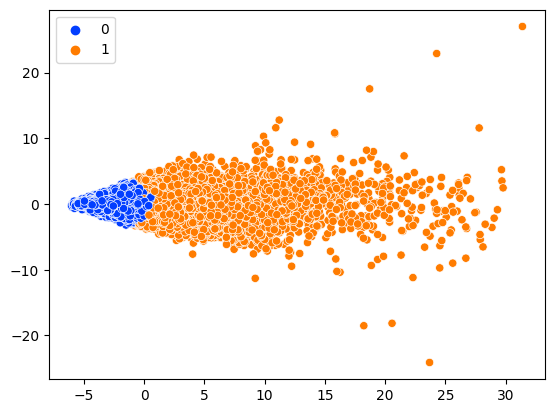

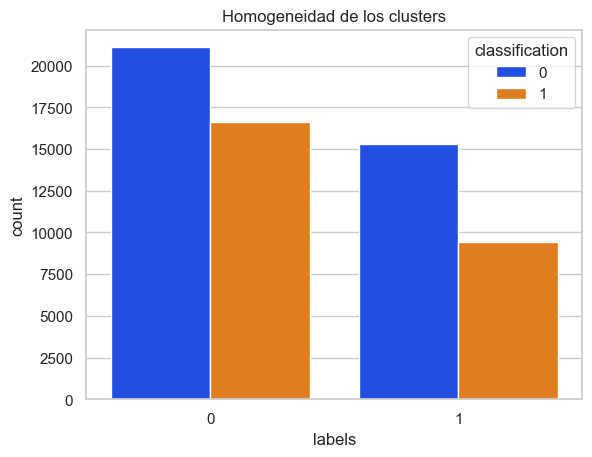

##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 0.0002924548312662517
completeness_score 0.0003736902504537999
v_measure_score 0.0003184118069067629


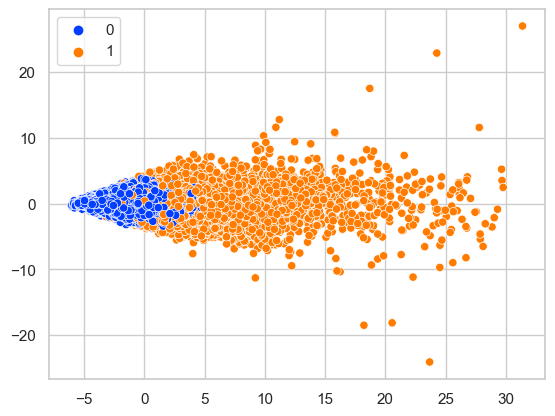

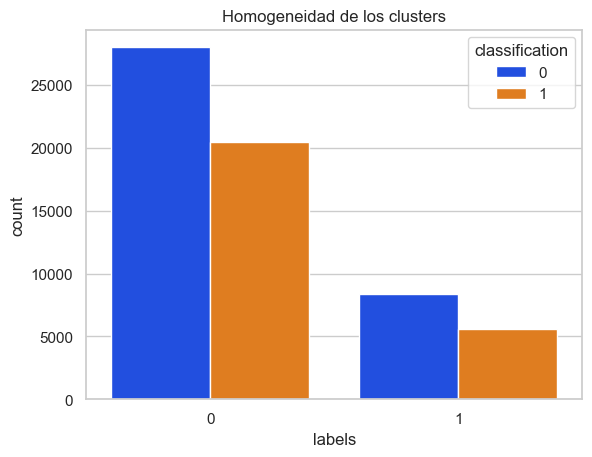

##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 6.118890031473323e-05
completeness_score 0.0004396576289073833
v_measure_score 9.035703205462741e-05


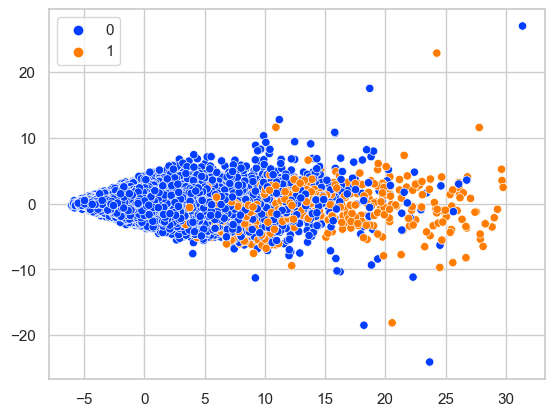

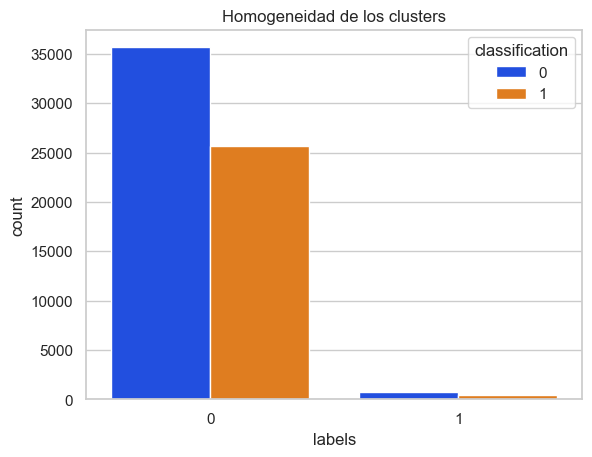

##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 0.0008002496952106488
completeness_score 0.0009686488388262994
v_measure_score 0.0008560592569320642


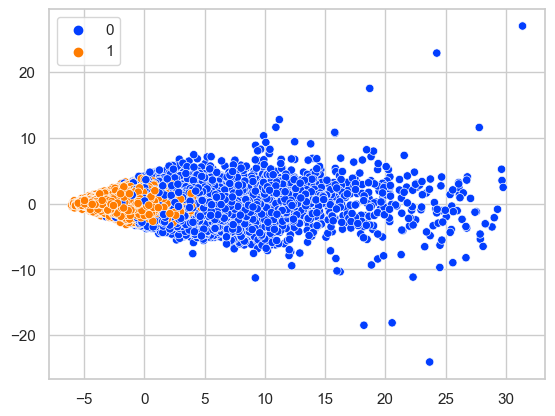

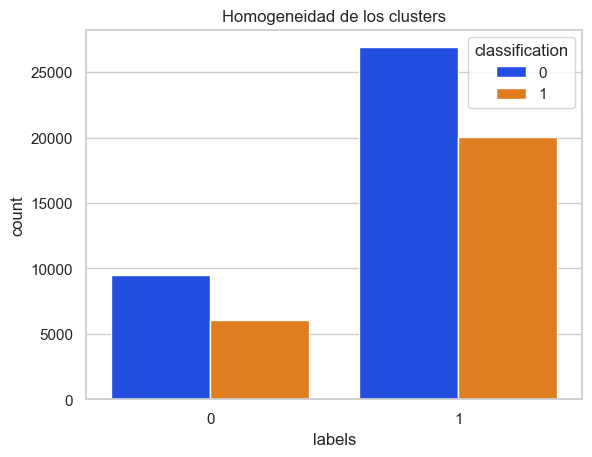

##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 0.005117437279751446
completeness_score 0.003502289242541115
v_measure_score 0.004362920517103427


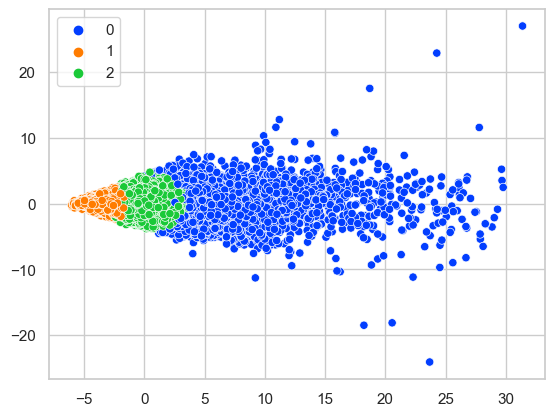

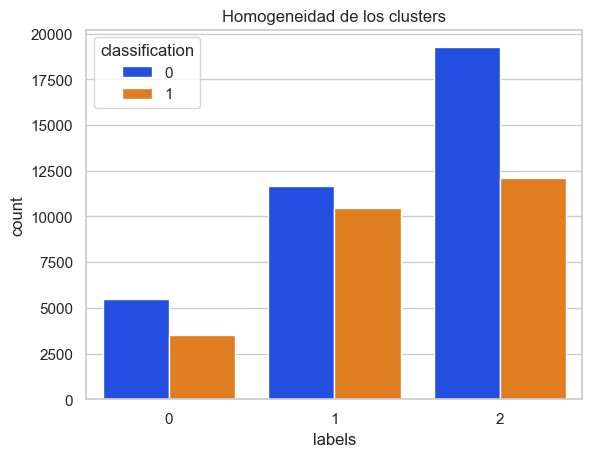

##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 0.002880254843064458
completeness_score 0.002195596353269183
v_measure_score 0.002578707909121017


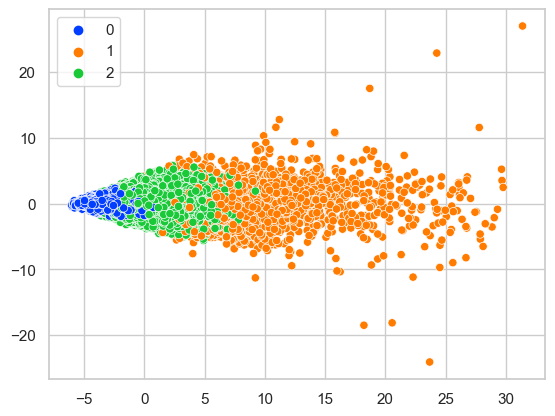

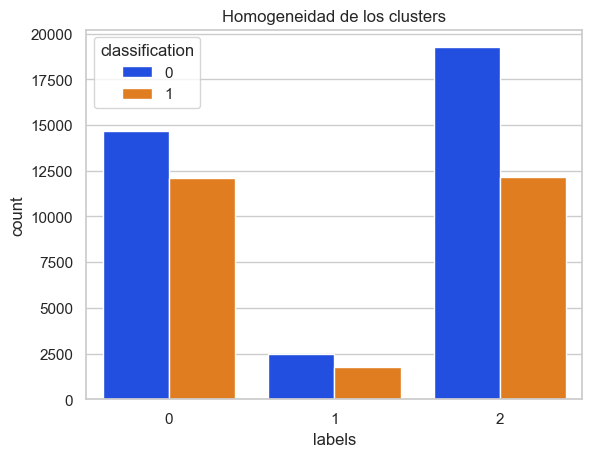

##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 6.19153451131494e-05
completeness_score 0.00014518892532813931
v_measure_score 7.88813380957481e-05


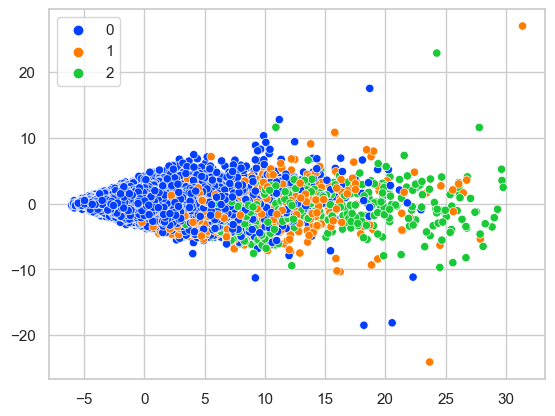

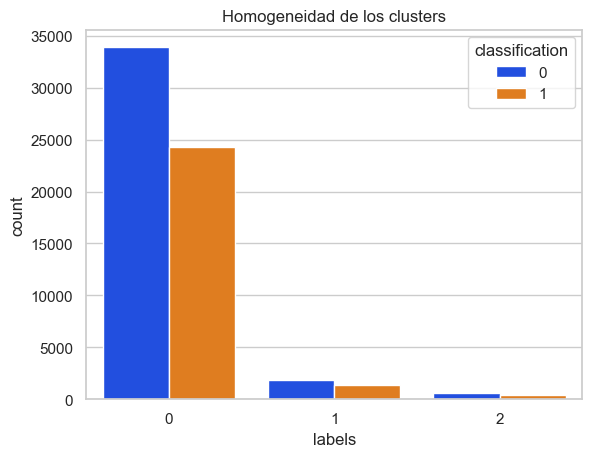

##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 0.005131223183535555
completeness_score 0.003961268545481857
v_measure_score 0.004619578615199815


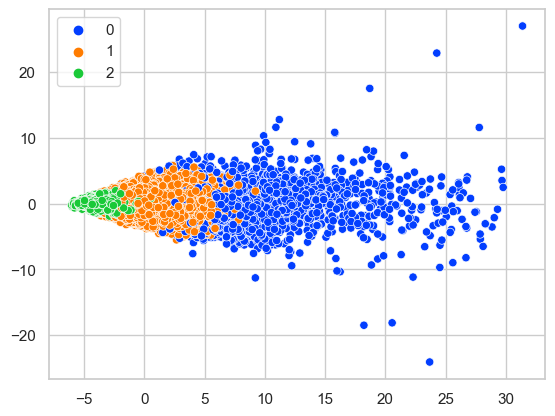

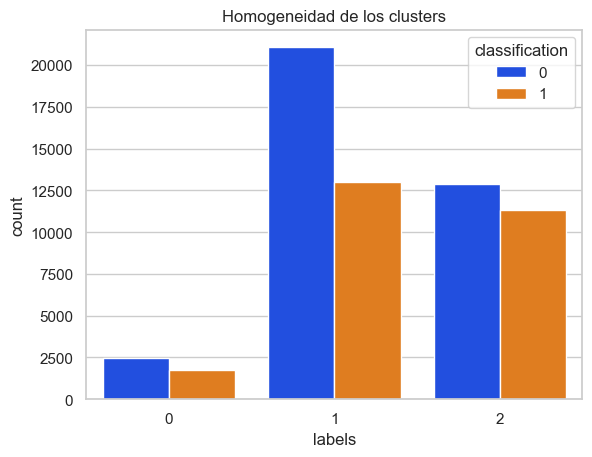

##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.004901277275065854
completeness_score 0.0027248357415755936
v_measure_score 0.0037715816245911904


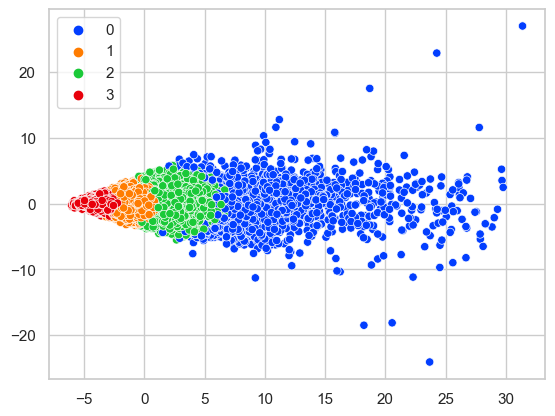

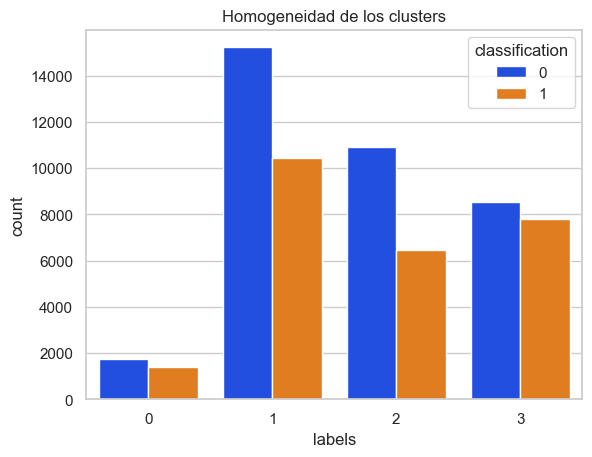

##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 0.003616687167040827
completeness_score 0.00218404860780741
v_measure_score 0.0029026771058637876


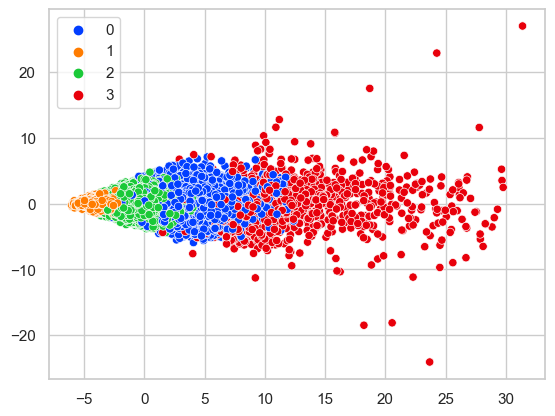

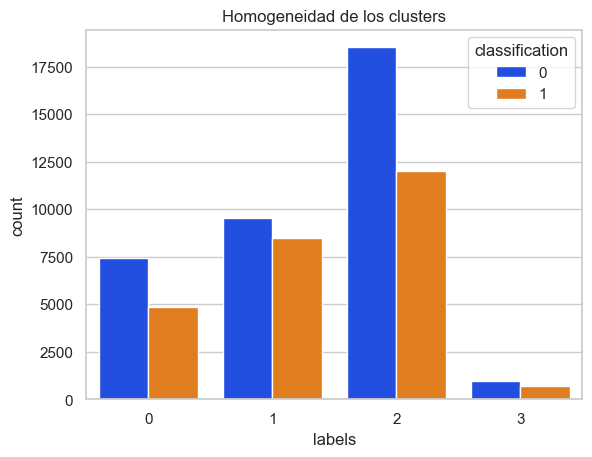

##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 0.00568805830005462
completeness_score 0.004288381536758919
v_measure_score 0.0050677841124507315


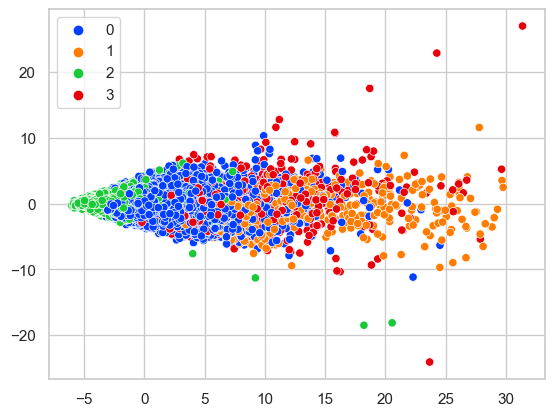

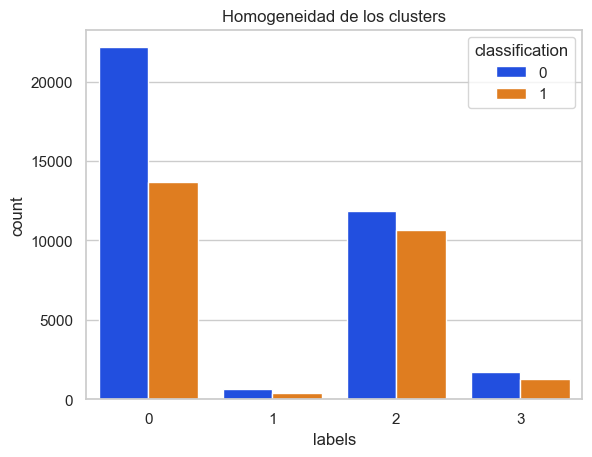

##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 0.004309222691096713
completeness_score 0.0025726910817879733
v_measure_score 0.0034387951480938962


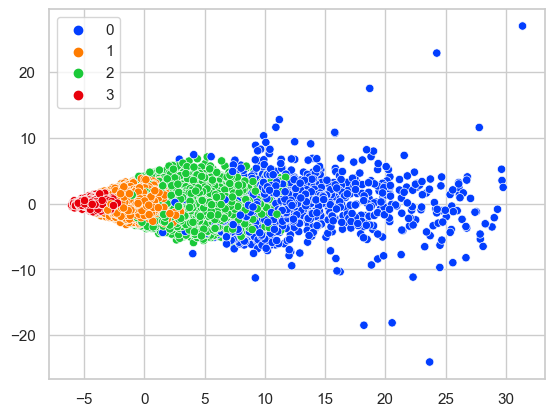

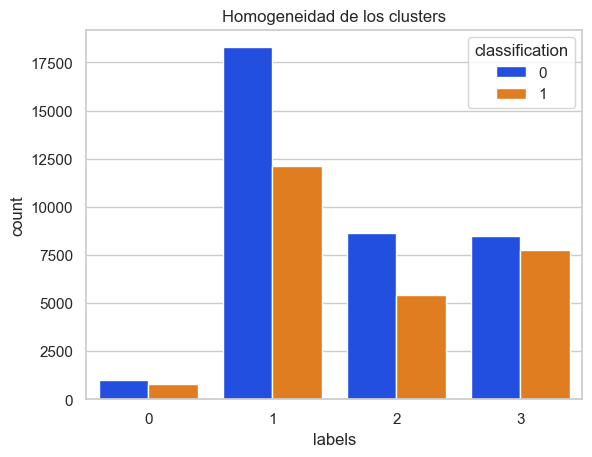

##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.006206835940892665
completeness_score 0.00290788302231929
v_measure_score 0.004354353389932056


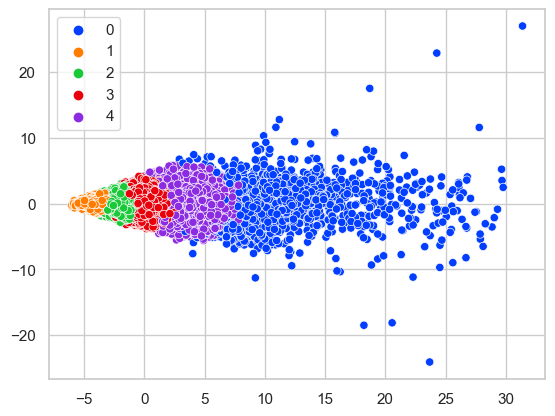

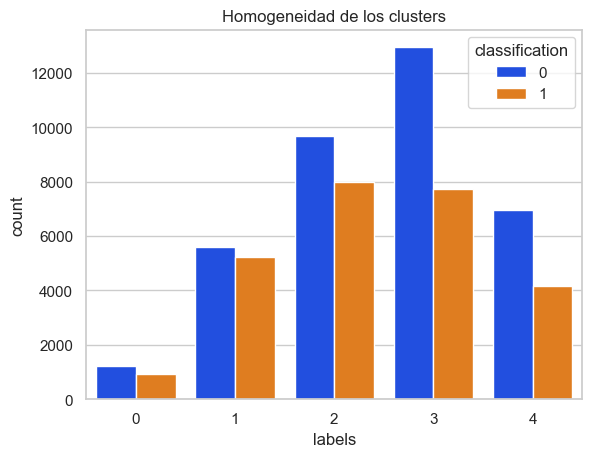

##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 0.0036717213731432227
completeness_score 0.0018444667084000286
v_measure_score 0.0026771562170715664


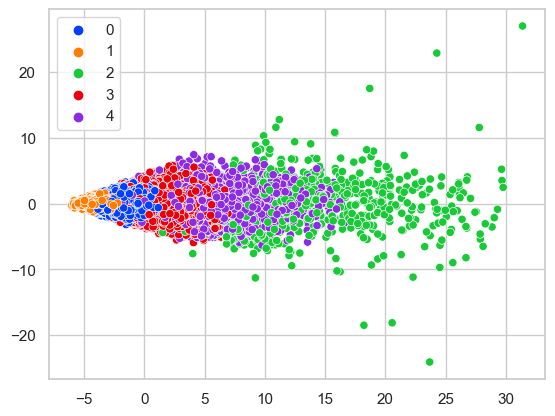

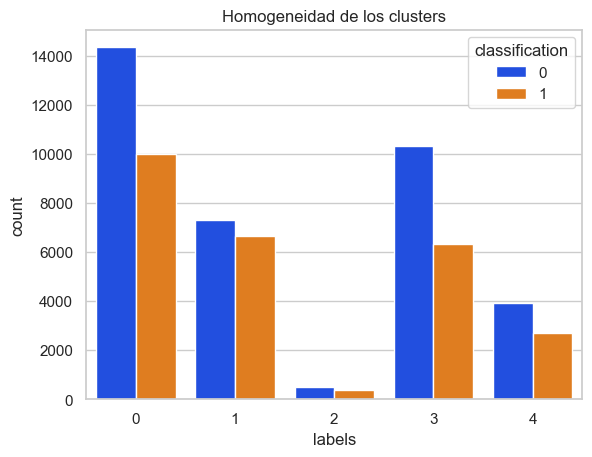

##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.00011371505426912002
completeness_score 0.000143362257727506
v_measure_score 0.00012327499412938646


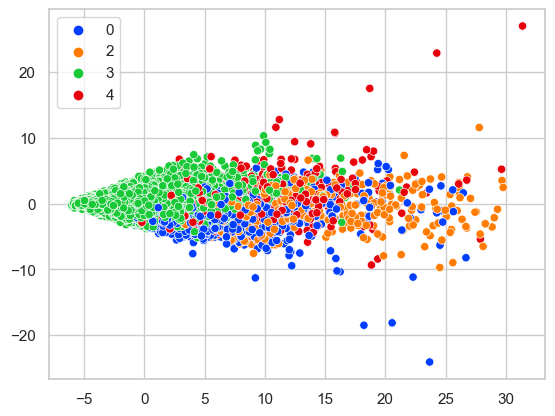

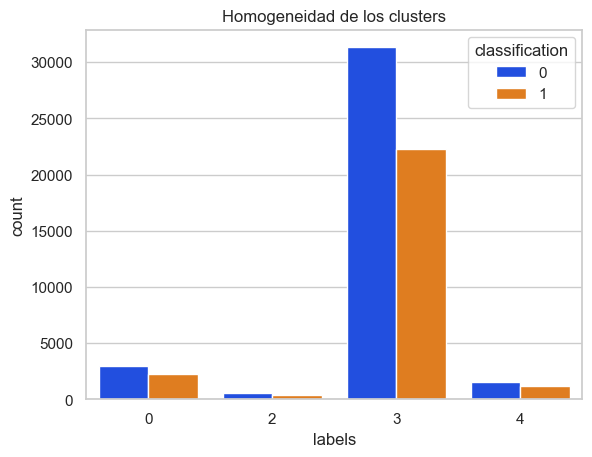

##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 0.004122557851695144
completeness_score 0.0021676699979522266
v_measure_score 0.003080698406660531


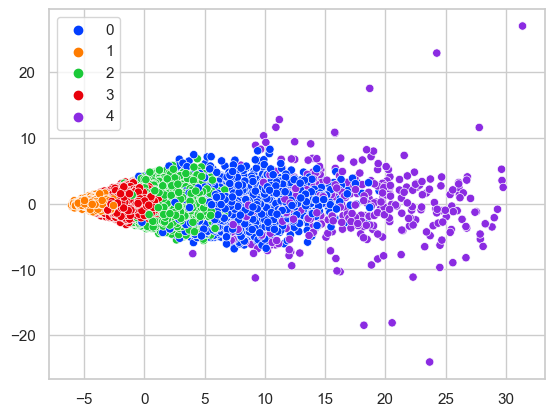

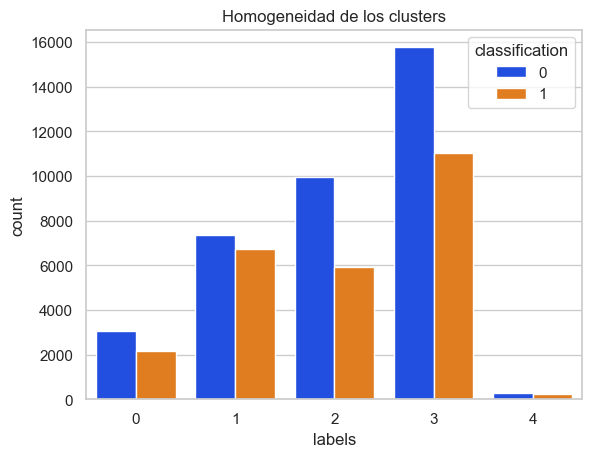

##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.006373514142821186
completeness_score 0.0025898779424259207
v_measure_score 0.004117657280188291


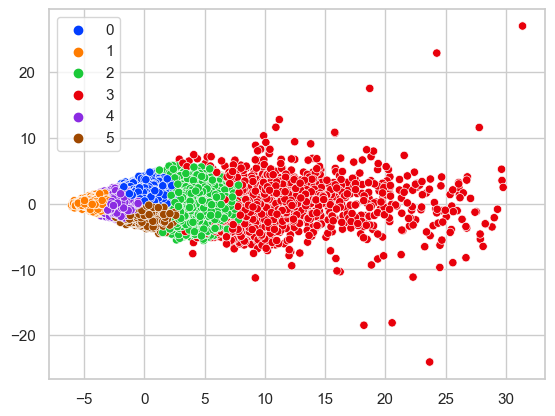

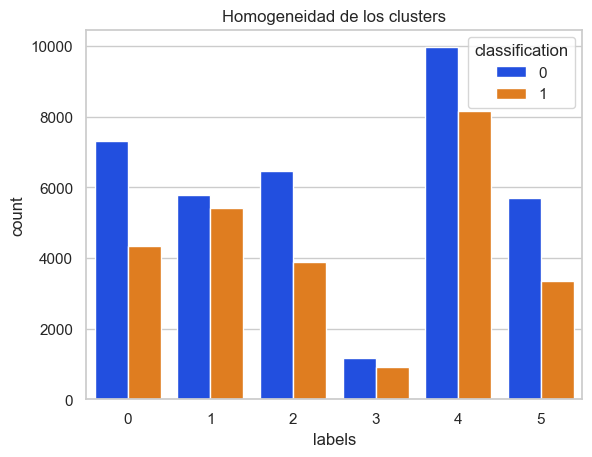

##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 0.0036761431595051367
completeness_score 0.0015812803684937021
v_measure_score 0.0024560083631506345


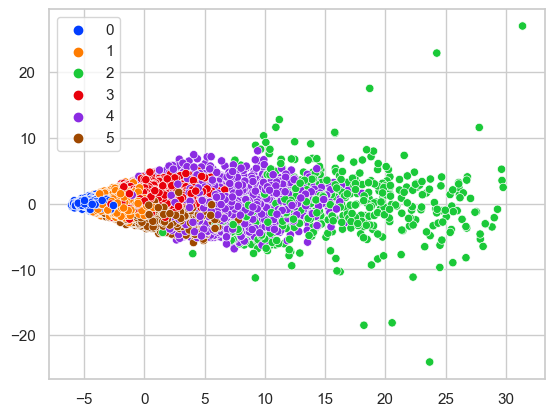

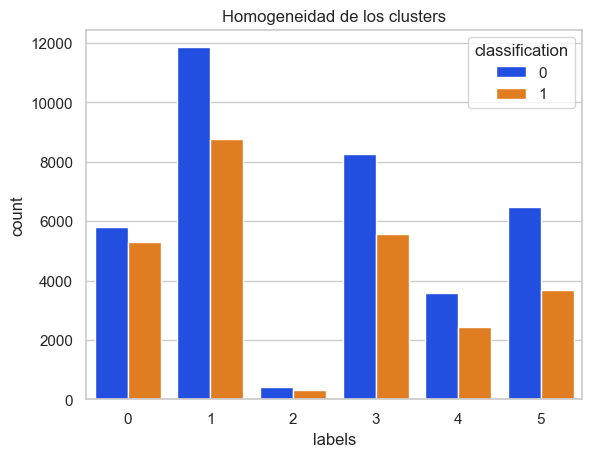

##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.00028274838589297945
completeness_score 0.00038875109714056627
v_measure_score 0.0003149533521524766


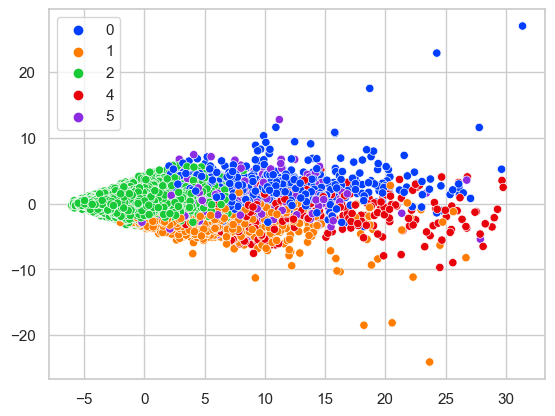

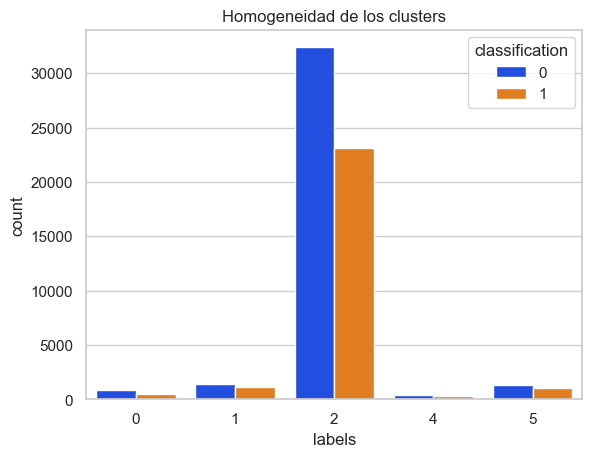

##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 0.004346361349951041
completeness_score 0.0019313684957099047
v_measure_score 0.002958918772233942


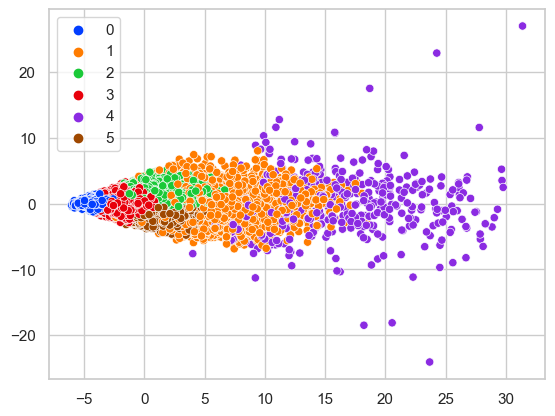

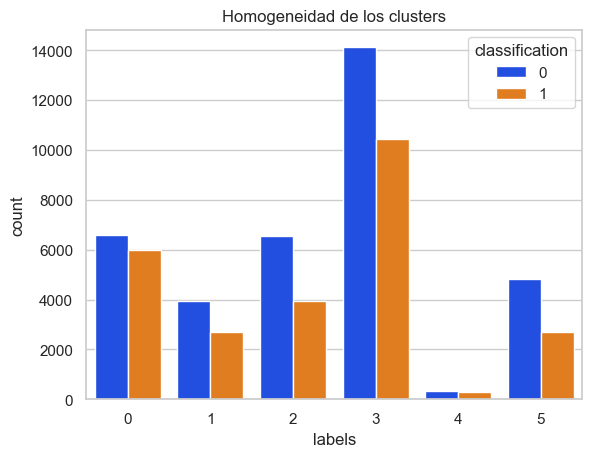

In [4]:
PCAs = pd.read_csv('count_PCA.csv').to_numpy()
test = pd.read_csv('count_test_PCA.csv').to_numpy()
GaussianAnalyze(PCAs, target, test, [2,3,4,5,6], 'count')

##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 1.2725166610974282e-05
completeness_score 0.04485499419927383
v_measure_score 2.0356801495973265e-05


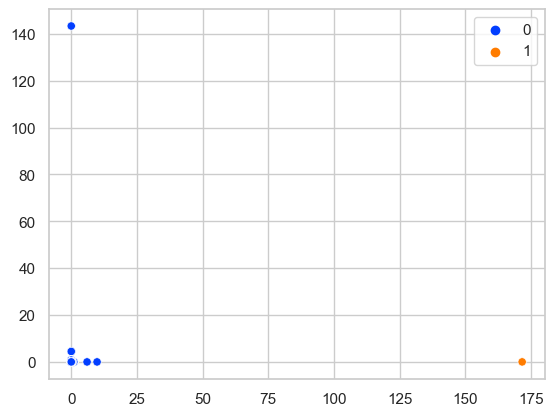

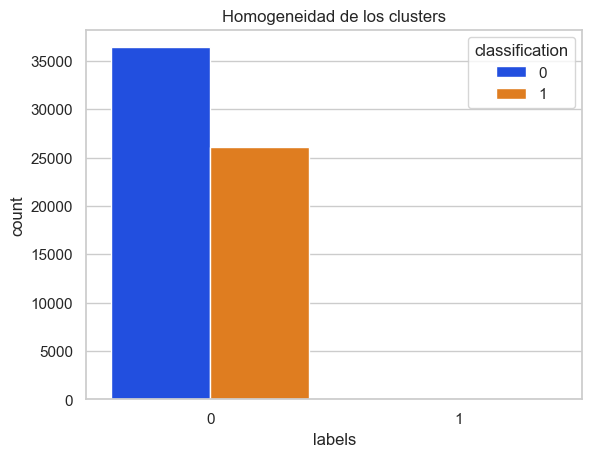

##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 1.2725166610974282e-05
completeness_score 0.04485499419927383
v_measure_score 2.0356801495973265e-05


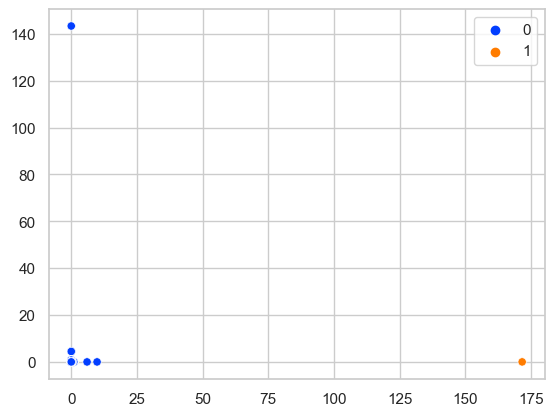

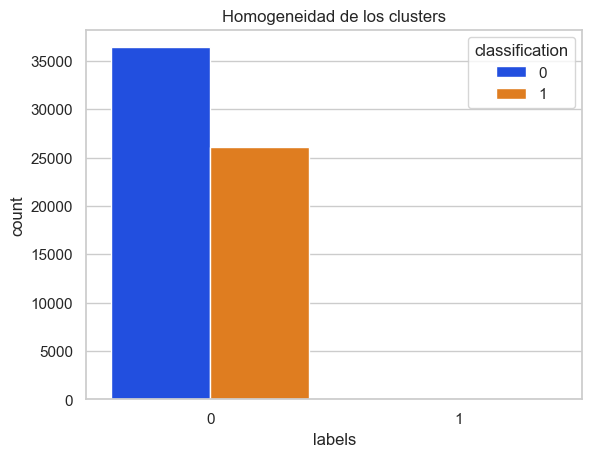

##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 1.2725166610974282e-05
completeness_score 0.04485499419927383
v_measure_score 2.0356801495973265e-05


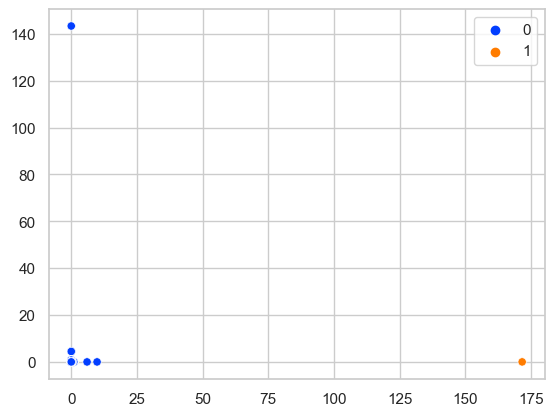

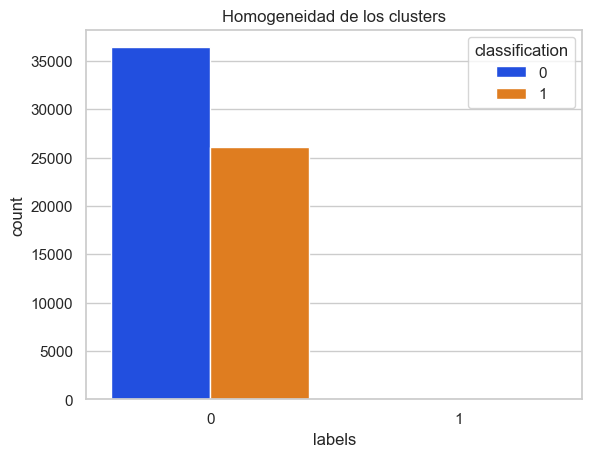

##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 1.2725166610974282e-05
completeness_score 0.04485499419927383
v_measure_score 2.0356801495973265e-05


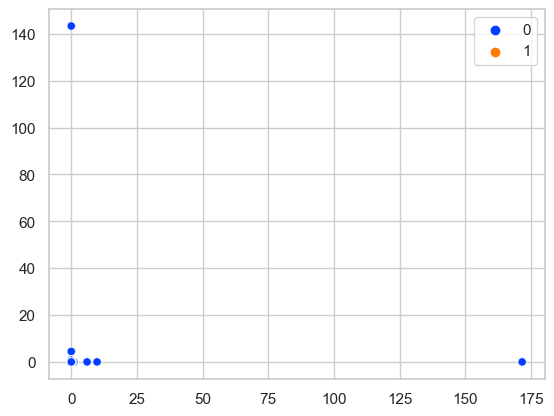

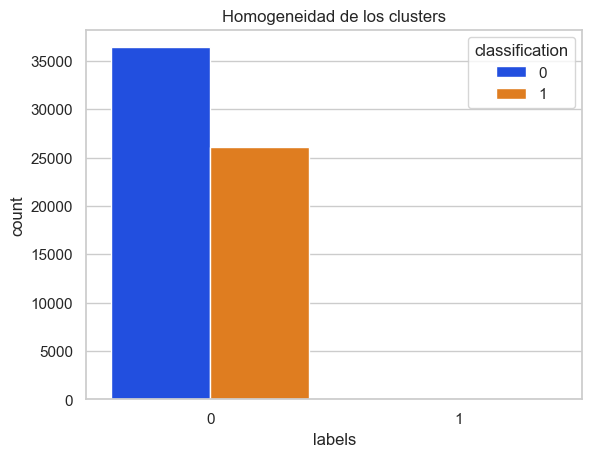

##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 2.545060331318464e-05
completeness_score 0.0448555000309573
v_measure_score 4.070710719535756e-05


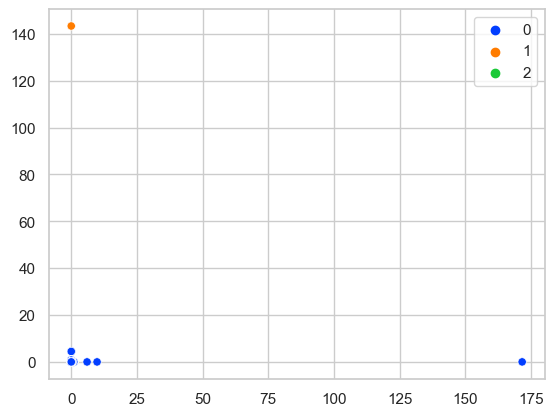

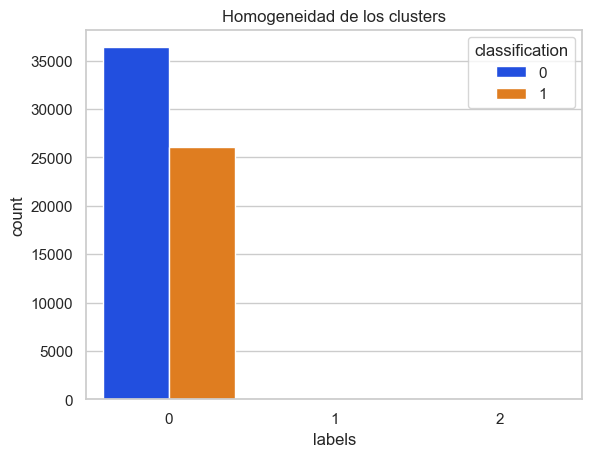

##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 1.2837179660603495e-05
completeness_score 4.862719109378993e-05
v_measure_score 1.7730986449676753e-05


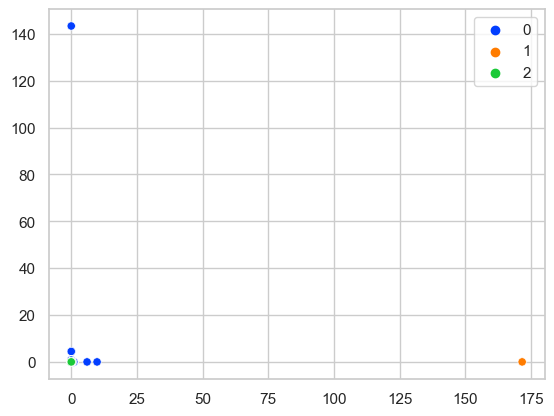

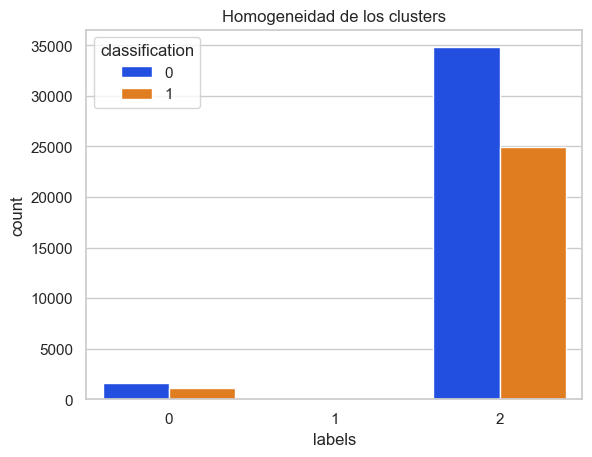

##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 2.545060331318464e-05
completeness_score 0.0448555000309573
v_measure_score 4.070710719535756e-05


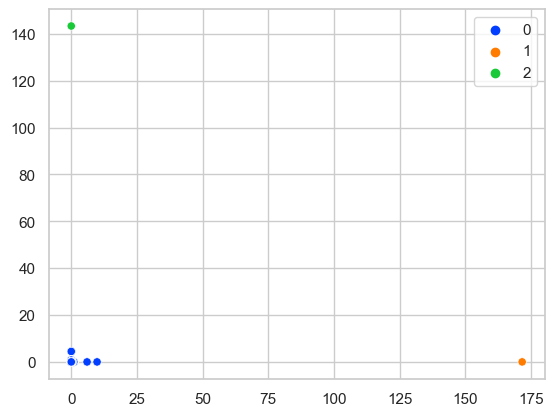

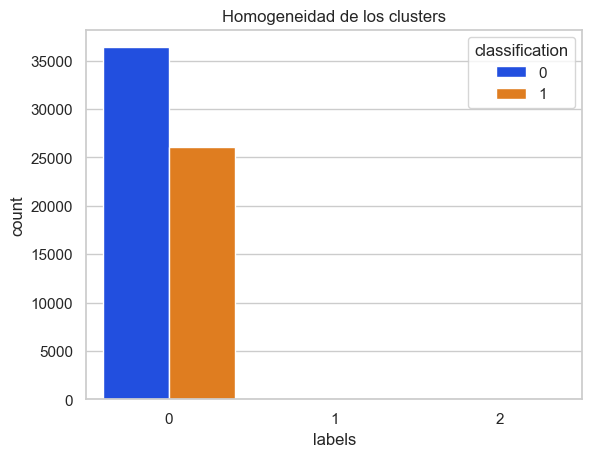

##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 2.0333194602694683e-05
completeness_score 8.803146173311004e-05
v_measure_score 2.857326109983677e-05


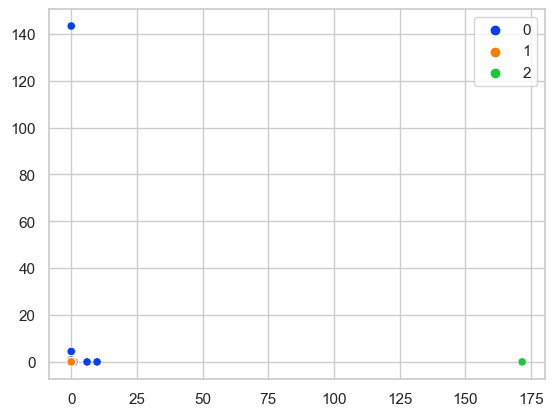

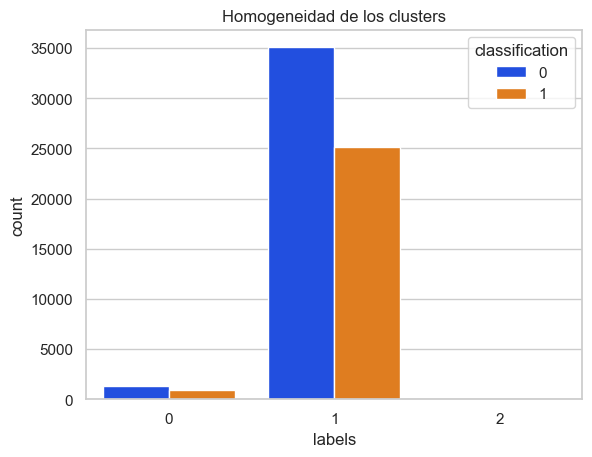

##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.07540063194422106
completeness_score 0.0983918636878924
v_measure_score 0.08264226530535651


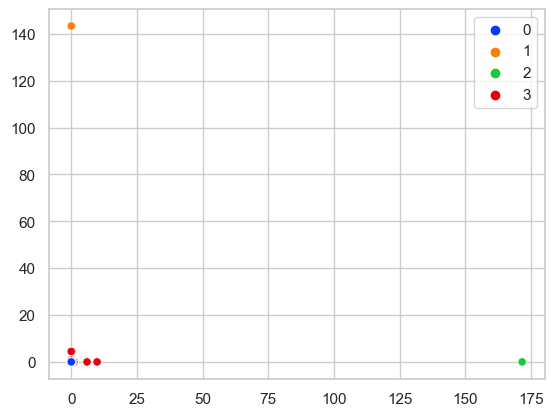

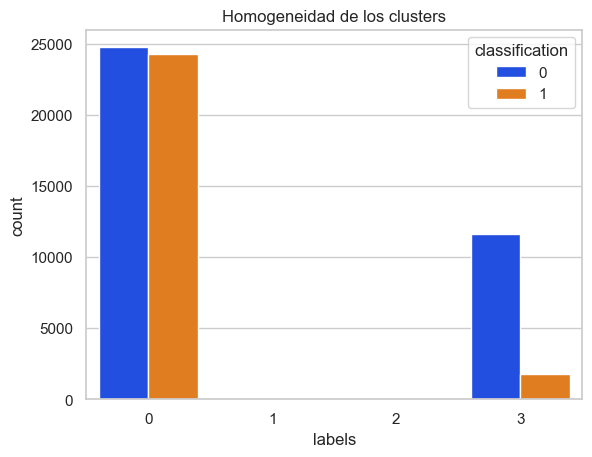

##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 6.539590319499296e-05
completeness_score 0.00018334465448284257
v_measure_score 8.618830774293223e-05


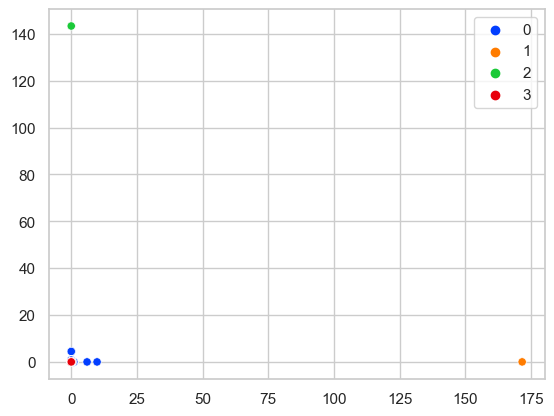

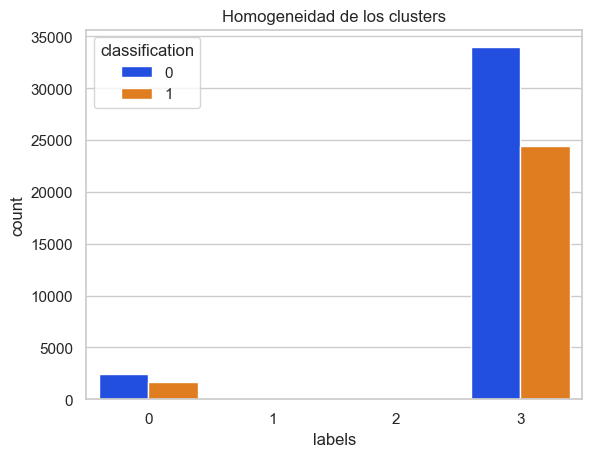

##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 3.8176310119131724e-05
completeness_score 0.04485600587840405
v_measure_score 6.105092044734407e-05


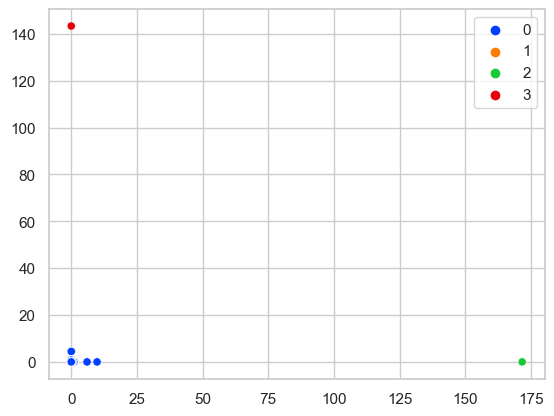

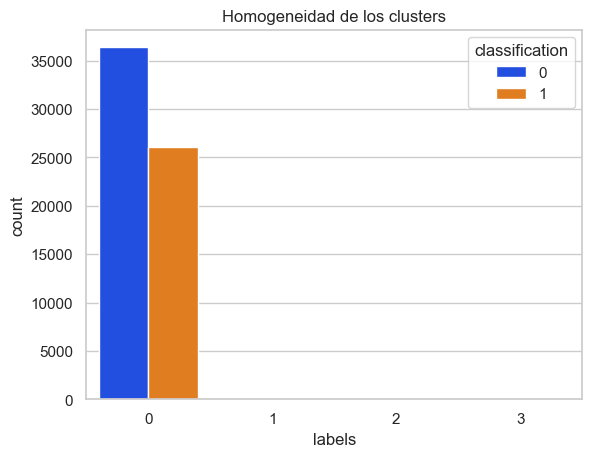

##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 2.8068909711514868e-05
completeness_score 0.00011688991961982525
v_measure_score 3.925451645474104e-05


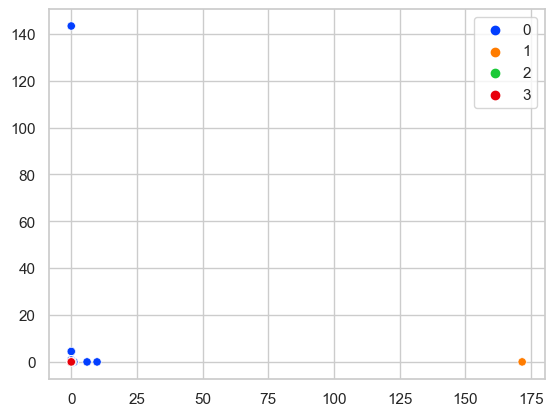

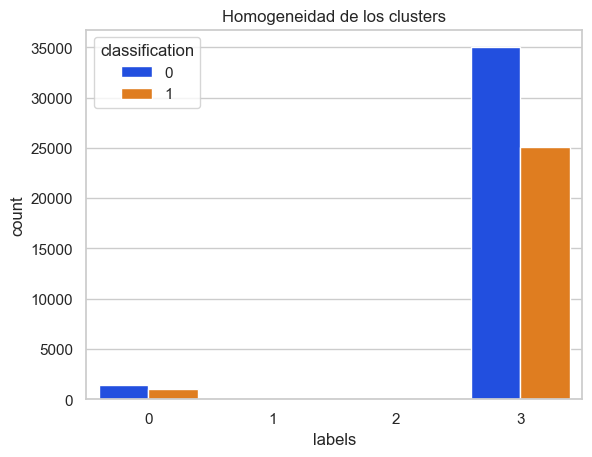

##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.1226133267385342
completeness_score 0.1888817746058313
v_measure_score 0.1411892123201074


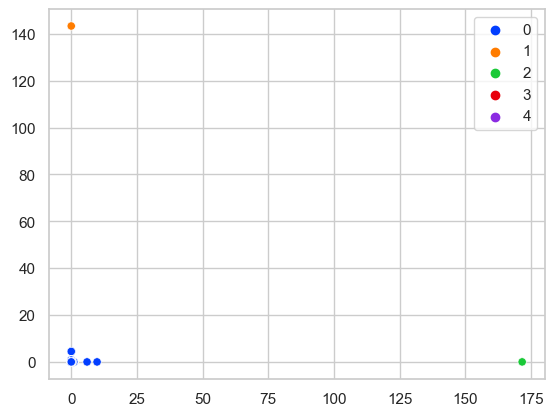

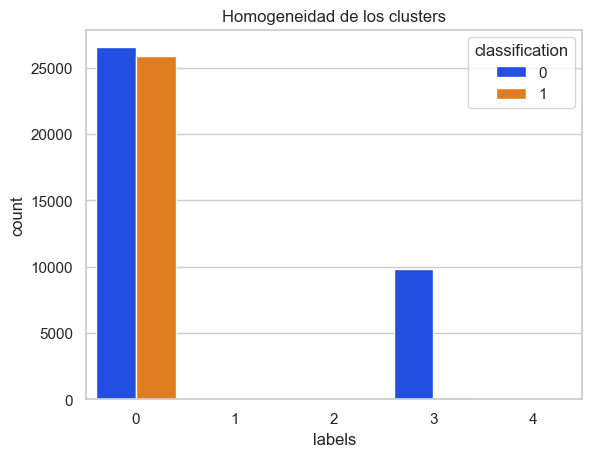

##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 5.0902287045319664e-05
completeness_score 0.04485651174514213
v_measure_score 8.1388244605238e-05


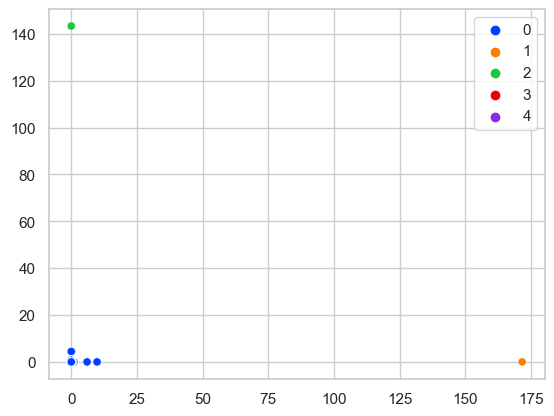

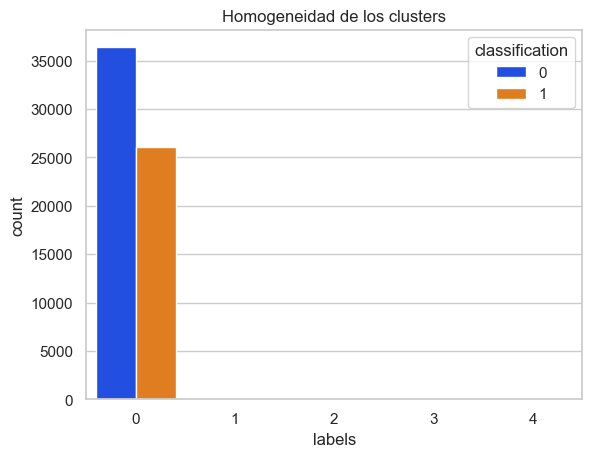

##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.1168853051359387
completeness_score 0.17407404014087574
v_measure_score 0.13330884265045376


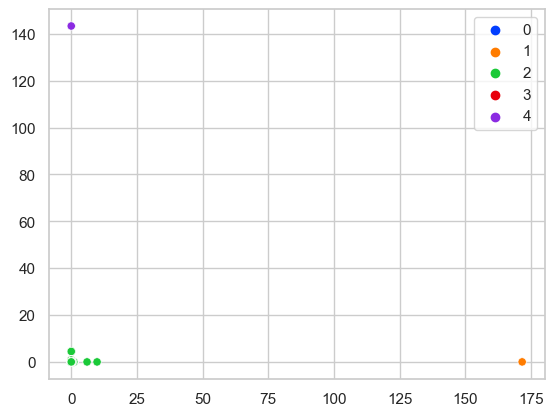

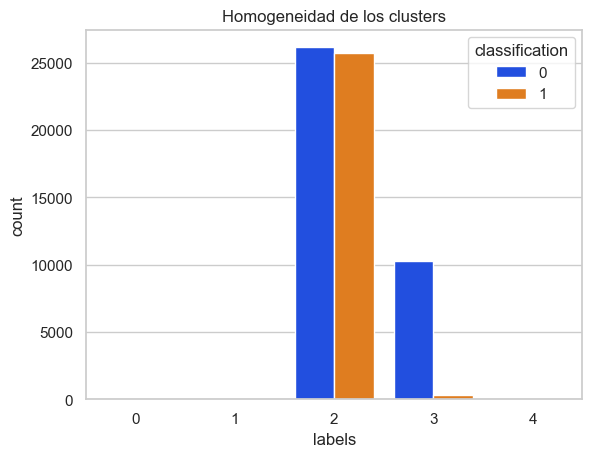

##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 5.0902287045319664e-05
completeness_score 0.04485651174514213
v_measure_score 8.1388244605238e-05


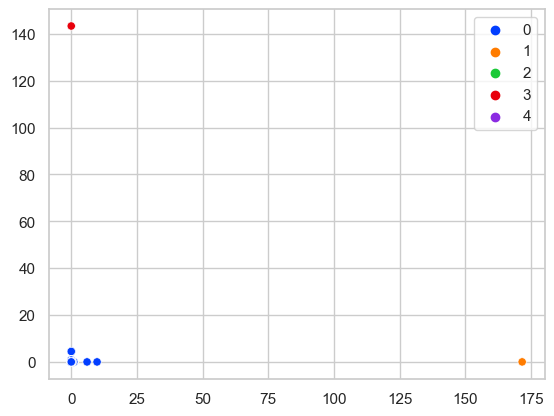

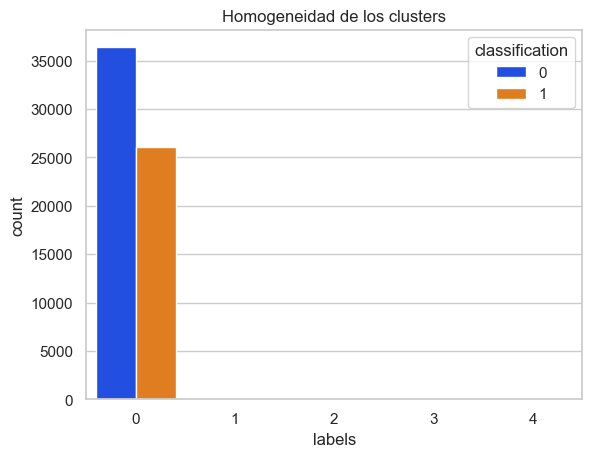

##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.0731905350204953
completeness_score 0.094697549132589
v_measure_score 0.08000427990935129


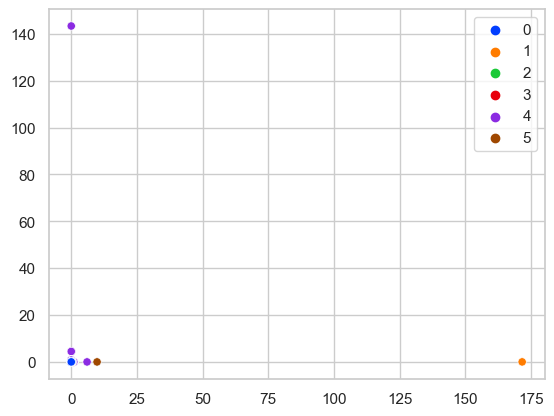

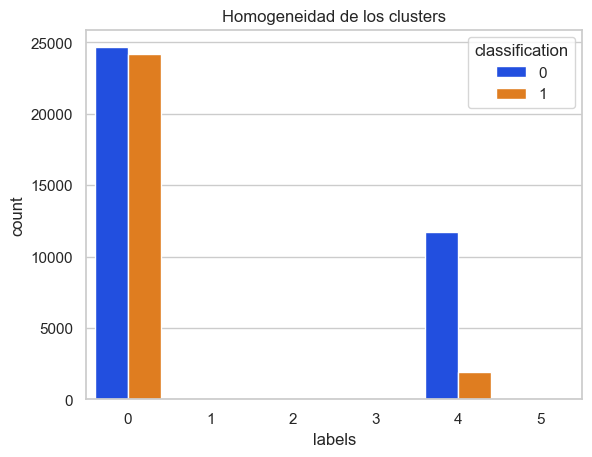

##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 9.51597262864887e-05
completeness_score 0.0002509805923029648
v_measure_score 0.00012403802324515486


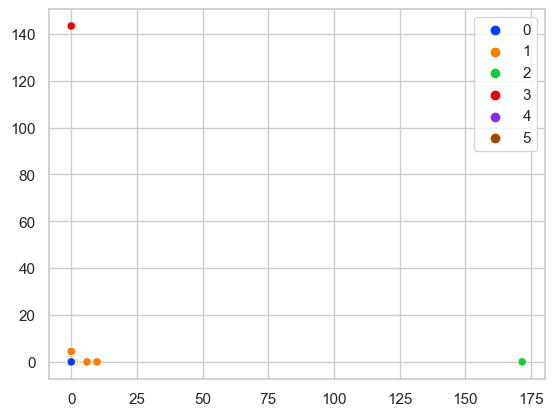

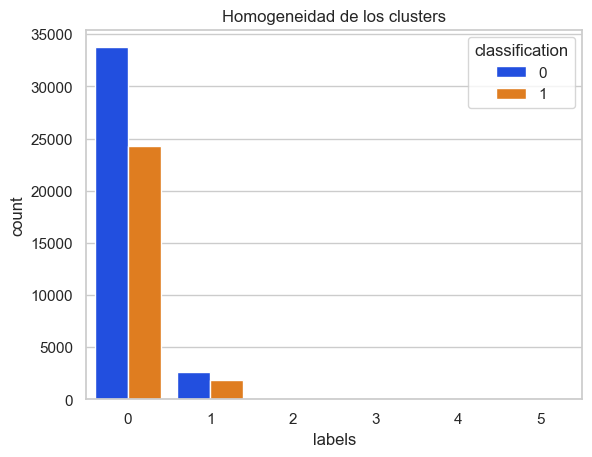

##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.11691758340963503
completeness_score 0.17411364297962378
v_measure_score 0.1333437938565697


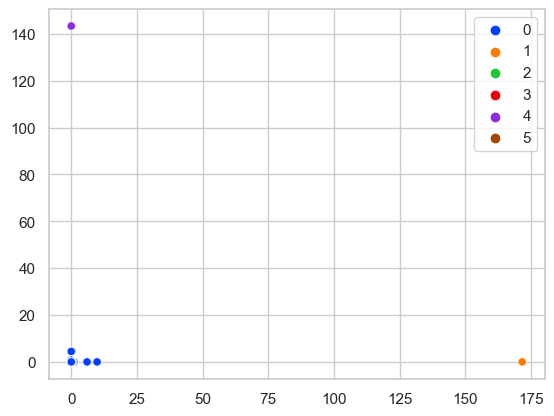

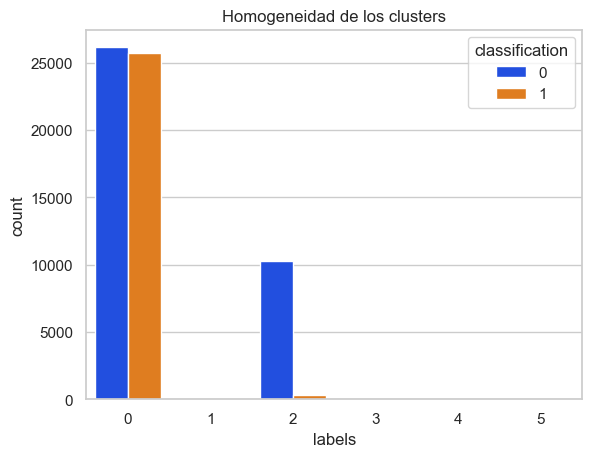

##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 7.596148979427186e-05
completeness_score 0.00023300822445376253
v_measure_score 0.00010165454332898831


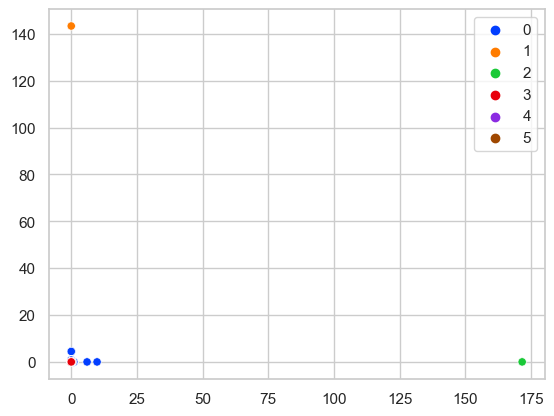

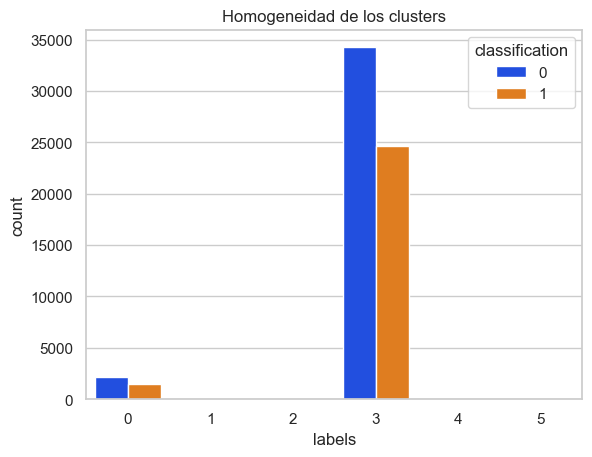

In [5]:
PCAs = pd.read_csv('first_PCA.csv').to_numpy()
test = pd.read_csv('first_test_PCA.csv').to_numpy()
GaussianAnalyze(PCAs, target, test, [2,3,4,5,6], 'first')

##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 0.0024778727701256463
completeness_score 0.015873756239985215
v_measure_score 0.003625074750796748


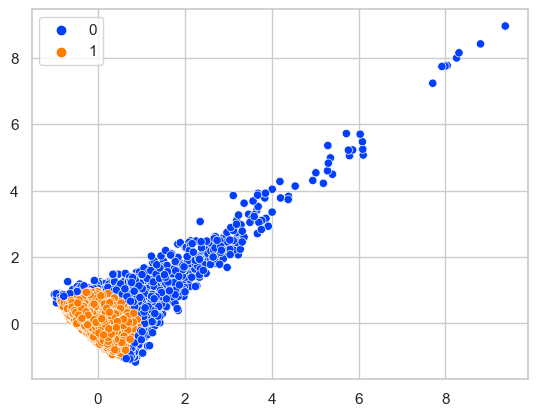

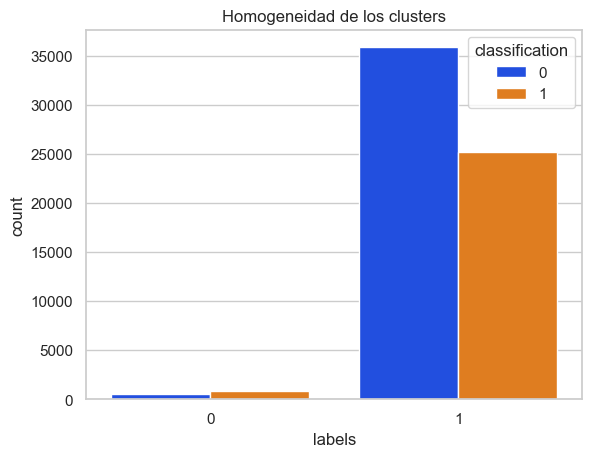

##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 0.003611540445796712
completeness_score 0.008825937161069422
v_measure_score 0.0046394077445911066


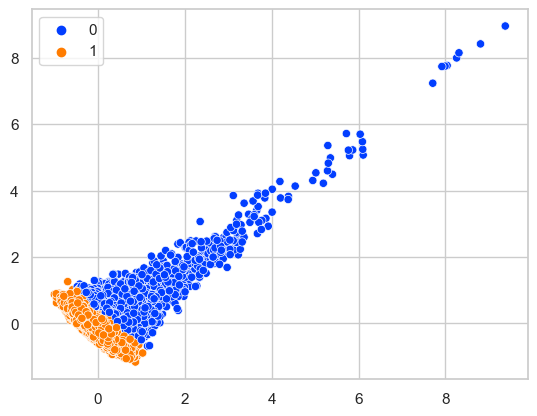

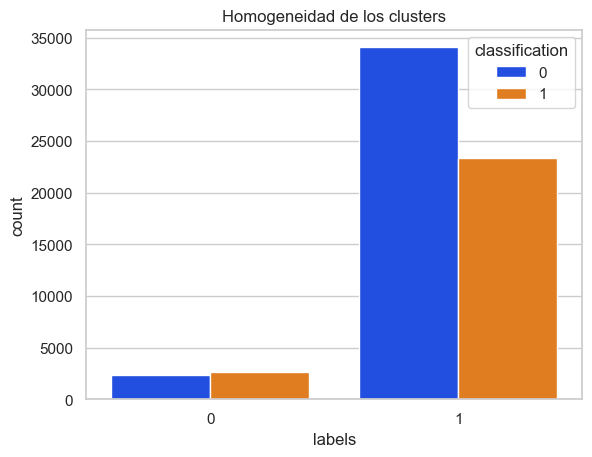

##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 0.0006564333941420215
completeness_score 0.0006627246788568918
v_measure_score 0.0006587785781971736


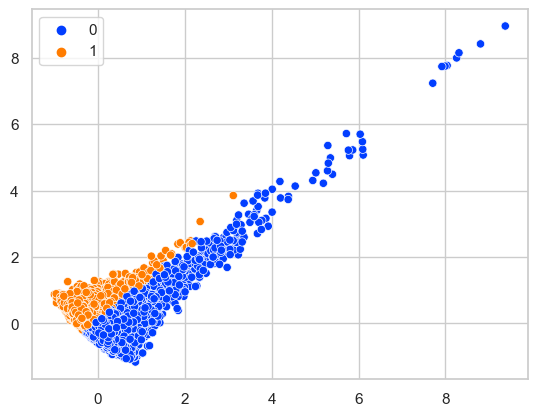

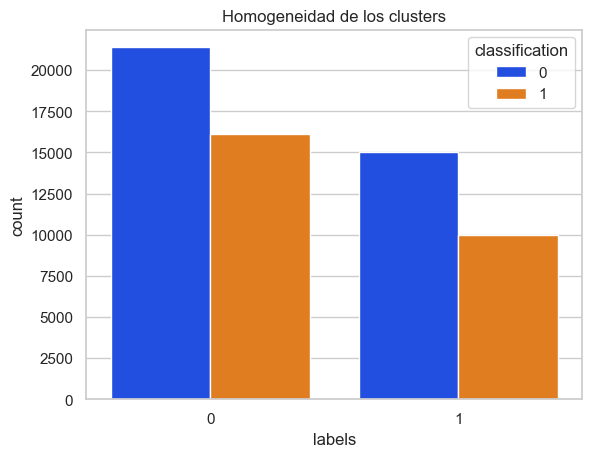

##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 0.0025643327582927466
completeness_score 0.01894550625834416
v_measure_score 0.0037947534562684563


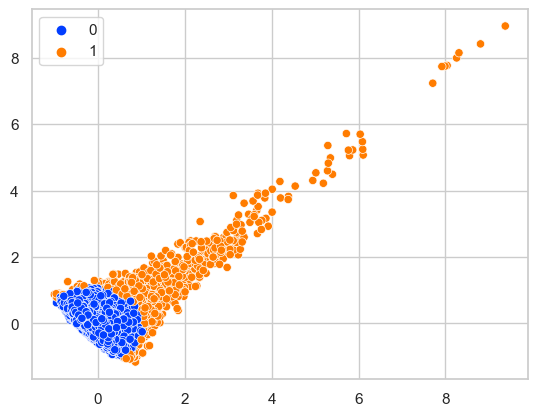

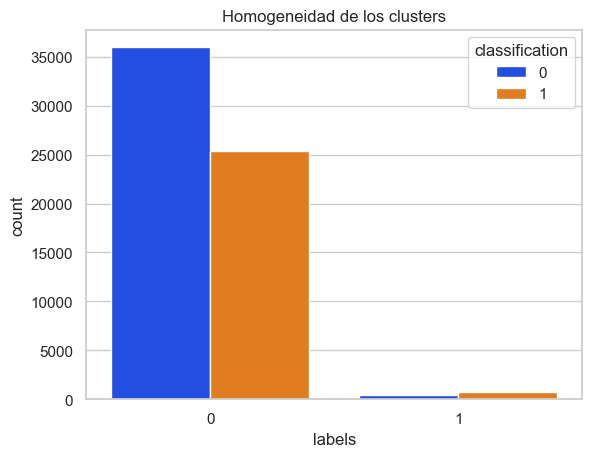

##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 0.0026014650203857945
completeness_score 0.0021324756019874217
v_measure_score 0.0024032615396481385


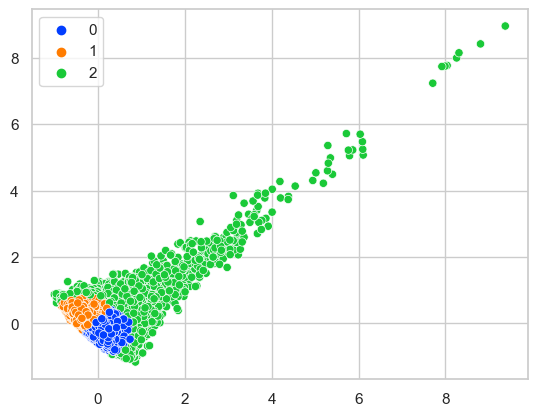

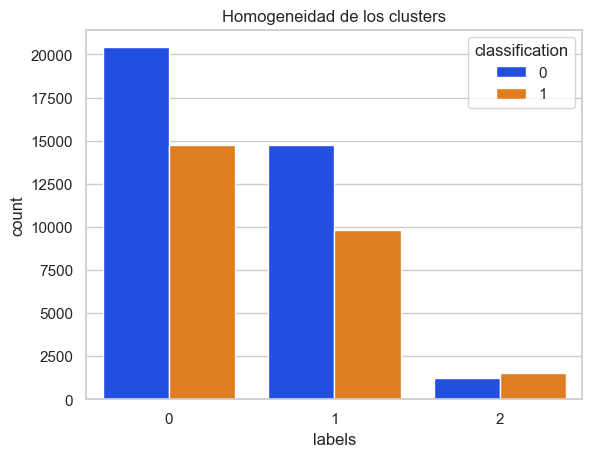

##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 0.0068489952000218395
completeness_score 0.00551014105489877
v_measure_score 0.006277046394575496


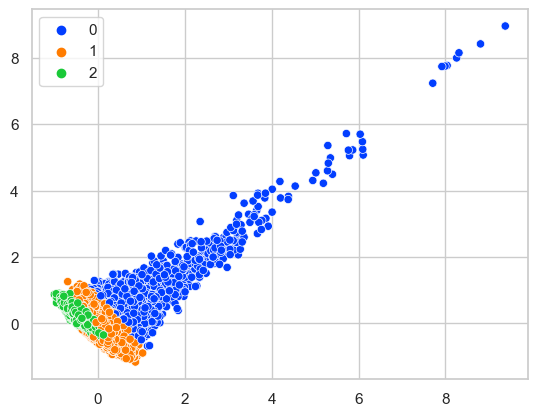

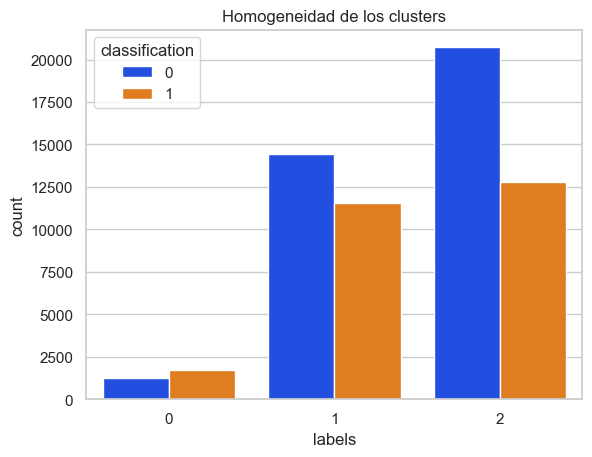

##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 0.0032545508897643934
completeness_score 0.00312980013310961
v_measure_score 0.0032066211028916906


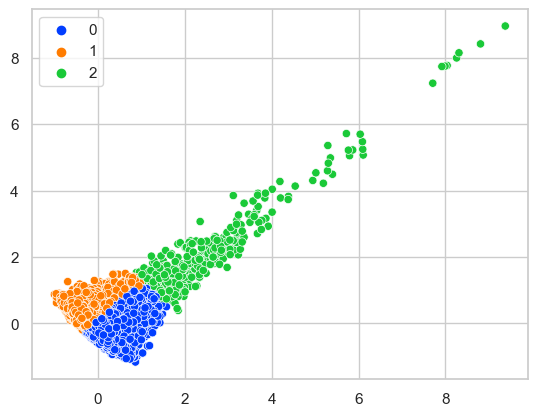

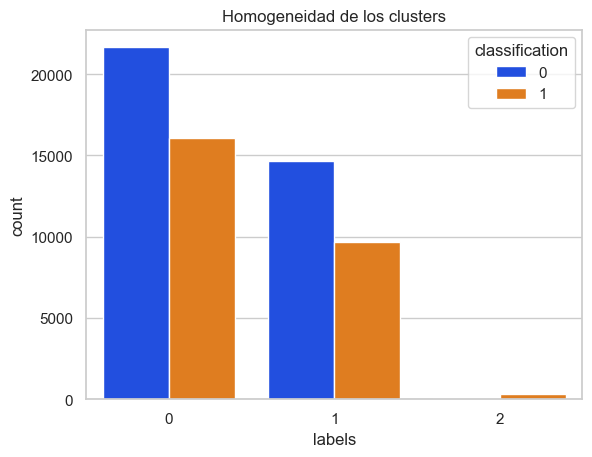

##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 0.0028013305146658376
completeness_score 0.002293771329411399
v_measure_score 0.002586689761616829


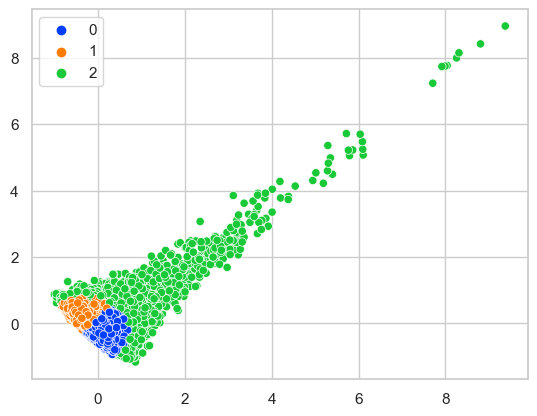

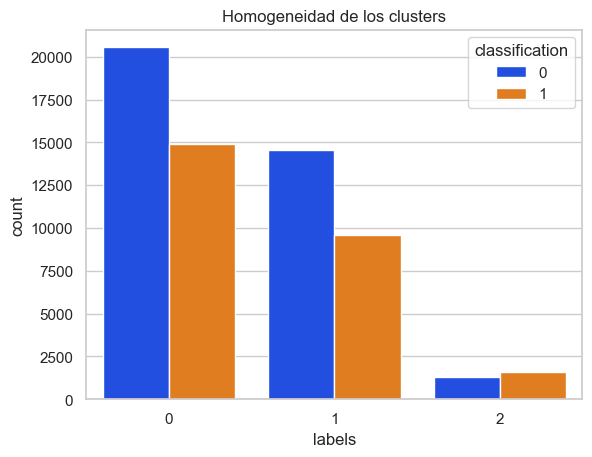

##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.004238712323487554
completeness_score 0.003211020992650575
v_measure_score 0.003784499614964671


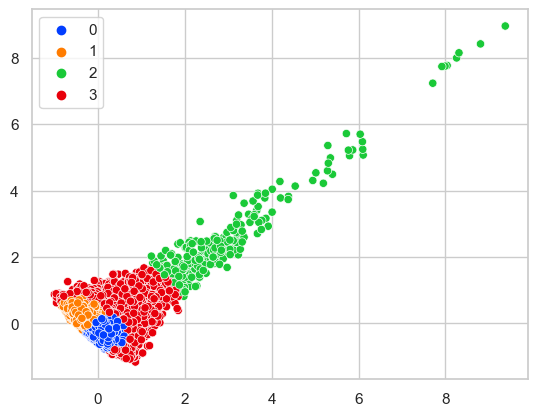

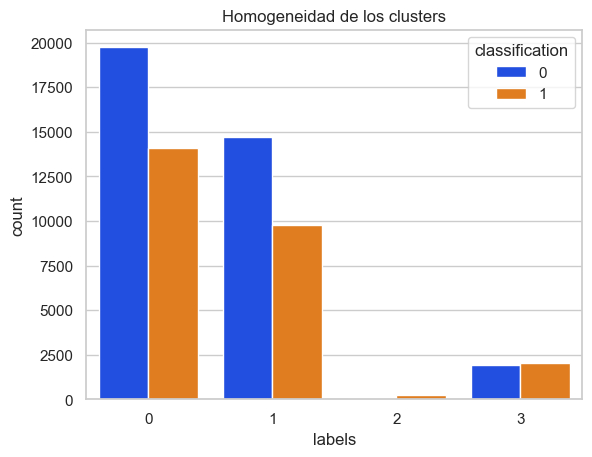

##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 0.008315391604855846
completeness_score 0.004761789114813273
v_measure_score 0.00649714588560723


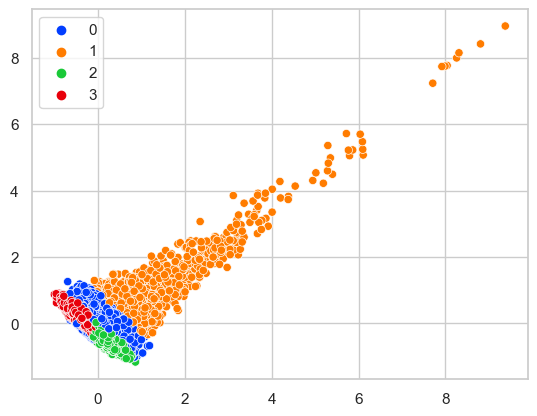

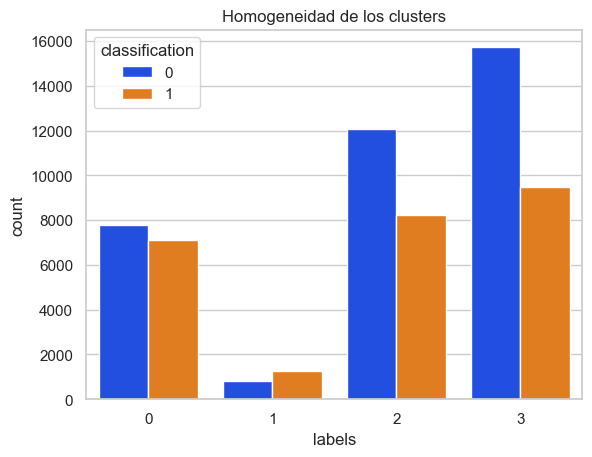

##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 0.004402589417859322
completeness_score 0.0038107959703967595
v_measure_score 0.004160312691796732


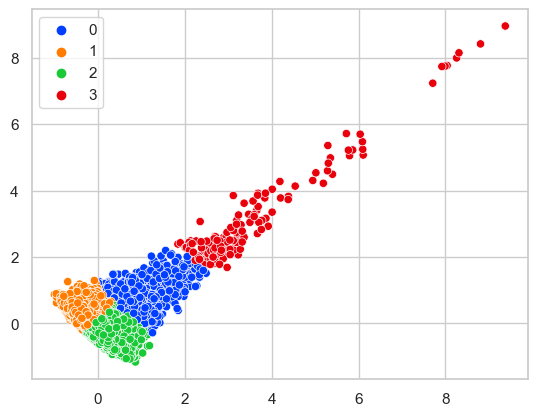

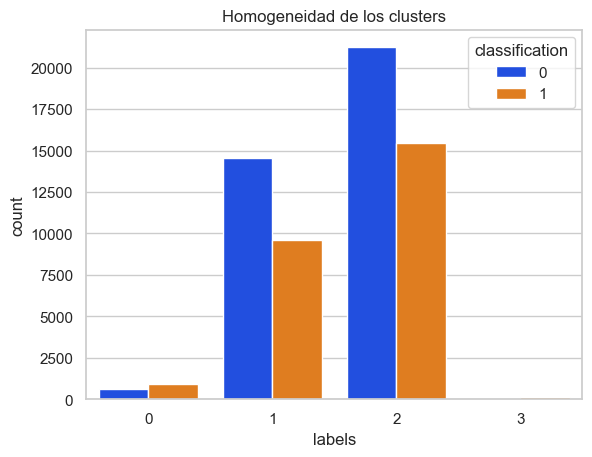

##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 0.004301384594894035
completeness_score 0.0032020098025493274
v_measure_score 0.0038107433177746596


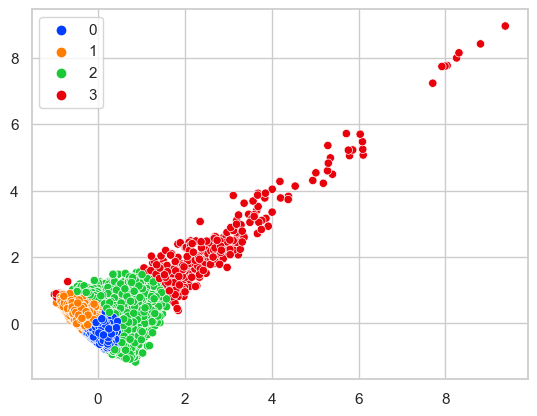

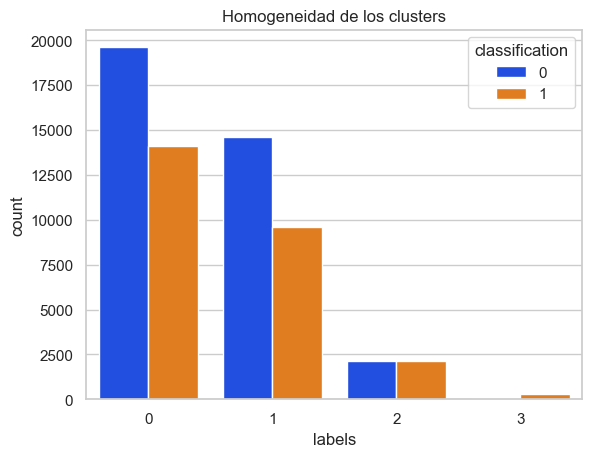

##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.004496072141656767
completeness_score 0.003352451934235499
v_measure_score 0.003986149692283092


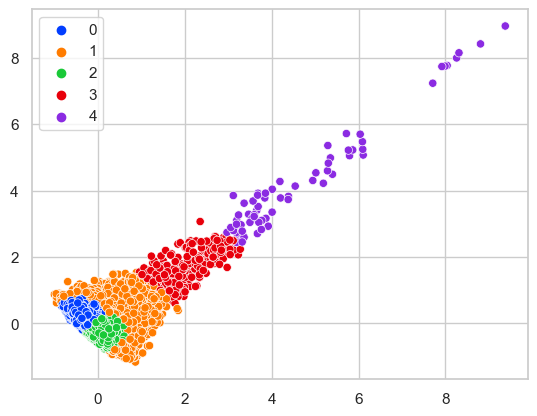

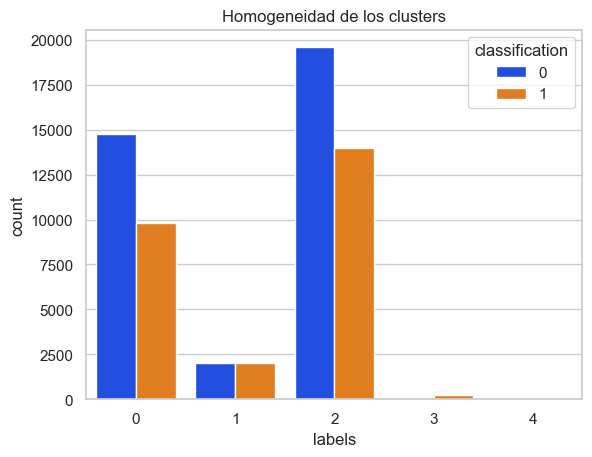

##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 0.006286509377433478
completeness_score 0.0032306592266566304
v_measure_score 0.004640487010042777


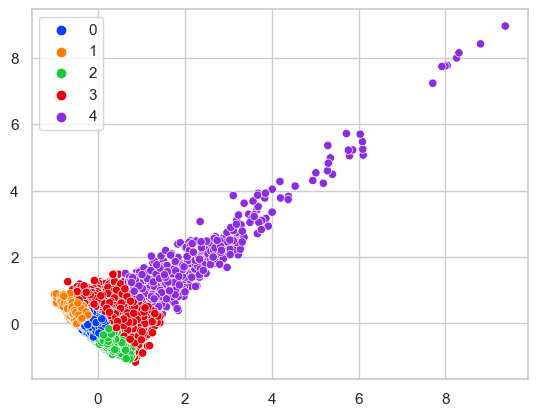

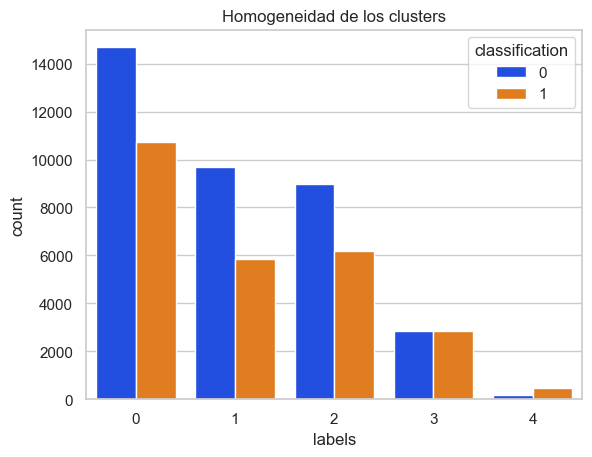

##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.004667859554326825
completeness_score 0.0029715949810278316
v_measure_score 0.003844834753206701


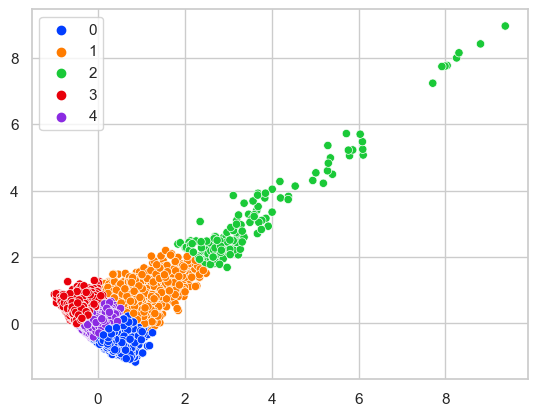

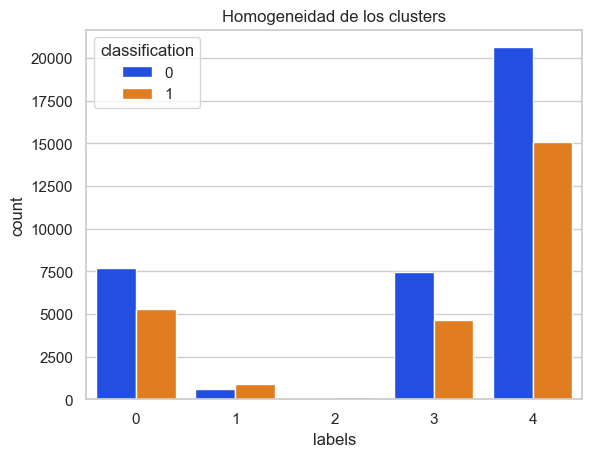

##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 0.005015560186107636
completeness_score 0.0026790546971074652
v_measure_score 0.003779475926160564


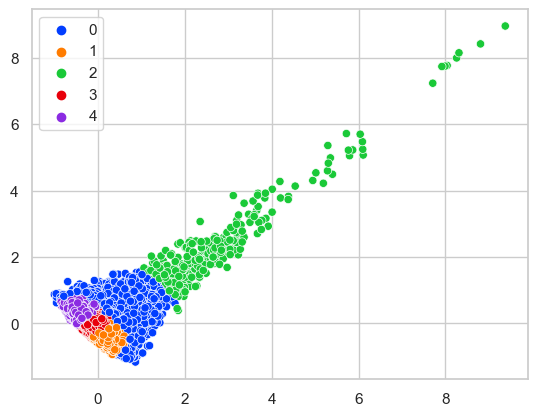

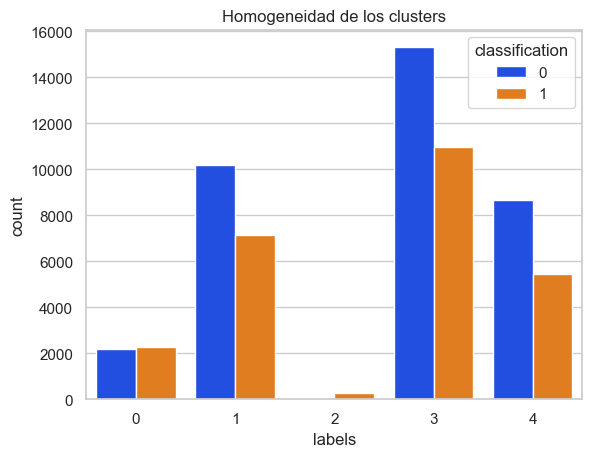

##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.005081628527448326
completeness_score 0.0026946333325214775
v_measure_score 0.003814499812663602


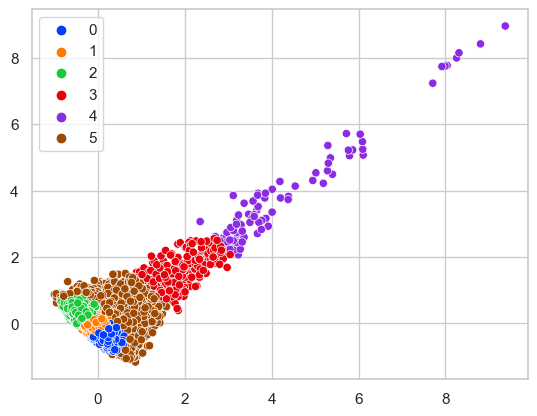

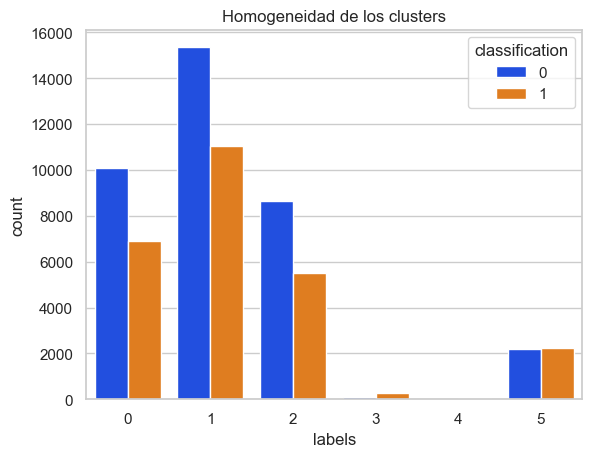

##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 0.006588129167977437
completeness_score 0.0033042758940548264
v_measure_score 0.004799456803466045


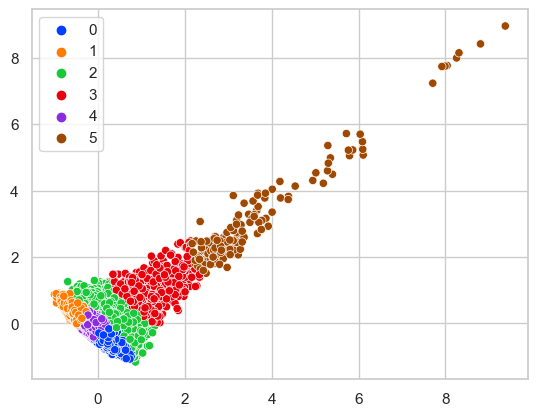

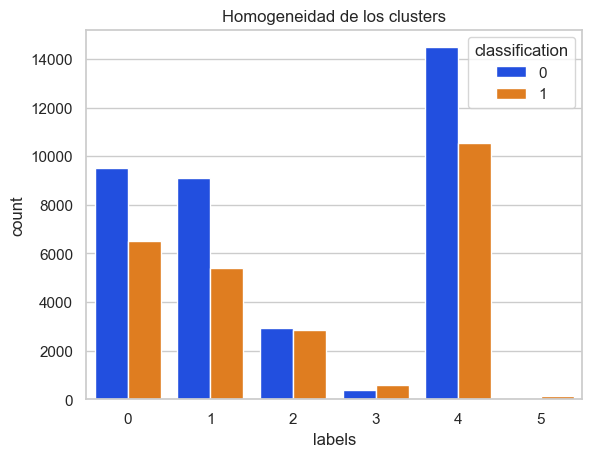

##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.005393080576691647
completeness_score 0.0033628186743081493
v_measure_score 0.004397482587192979


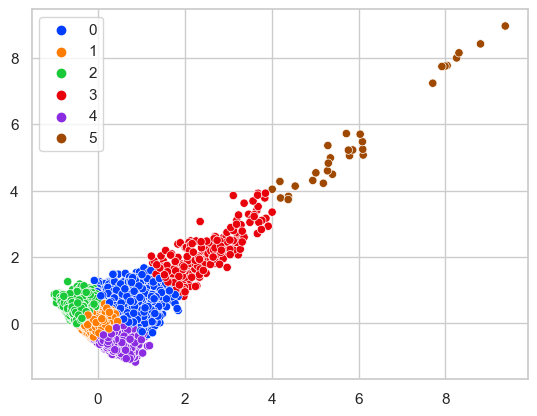

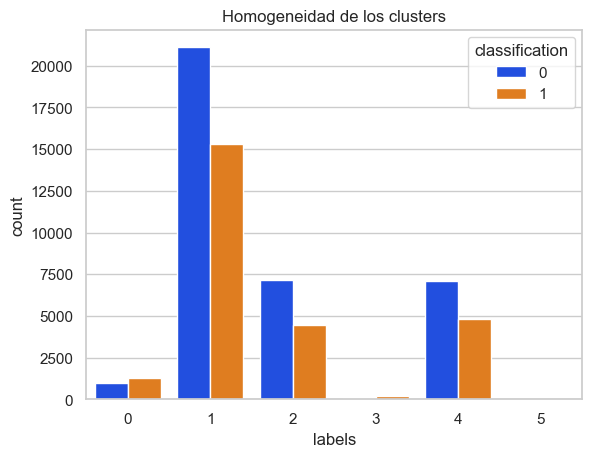

##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 0.005028699739729013
completeness_score 0.002651618154822918
v_measure_score 0.0037635061092011883


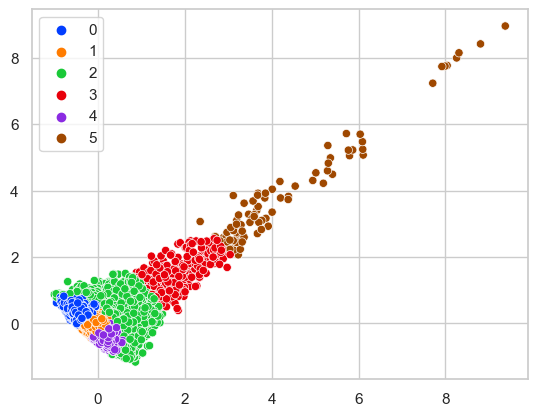

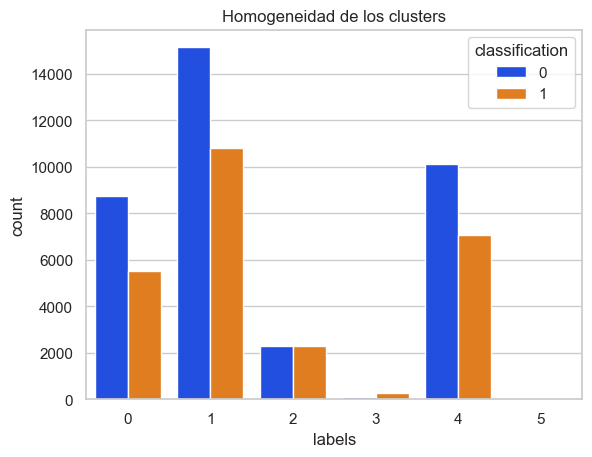

In [6]:
PCAs = pd.read_csv('left_PCA.csv').to_numpy()
test = pd.read_csv('left_test_PCA.csv').to_numpy()
GaussianAnalyze(PCAs, target, test, [2,3,4,5,6], 'left')

##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 0.0022989141804672
completeness_score 0.015866833283205383
v_measure_score 0.0033840754759412723


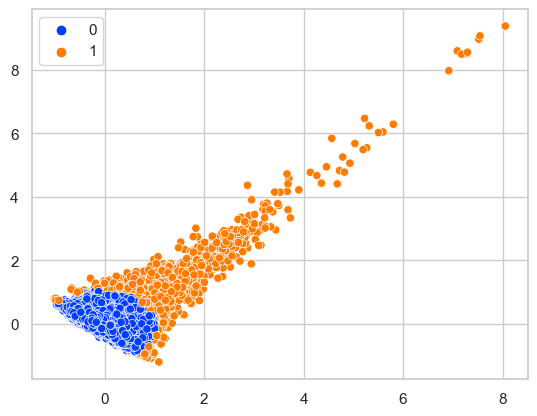

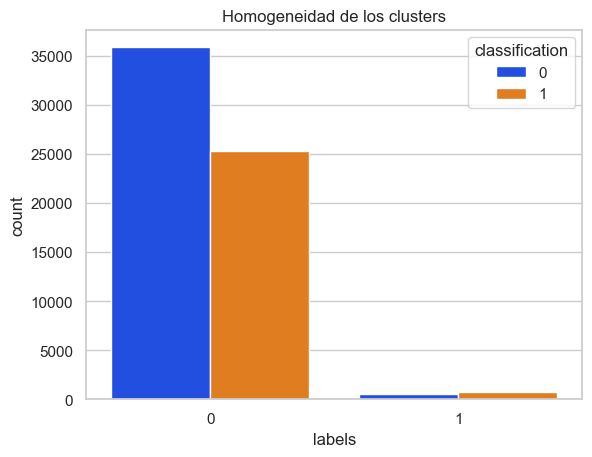

##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 0.0034257677990494036
completeness_score 0.006972982308812138
v_measure_score 0.004233344471551546


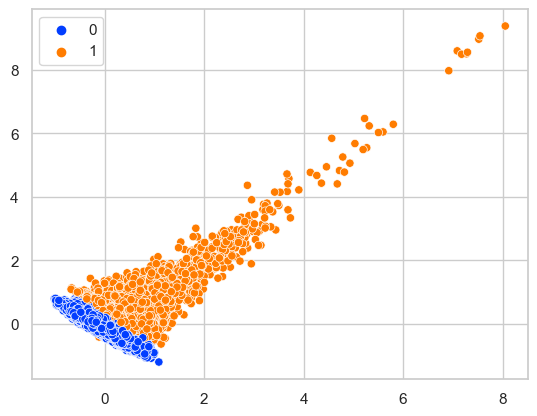

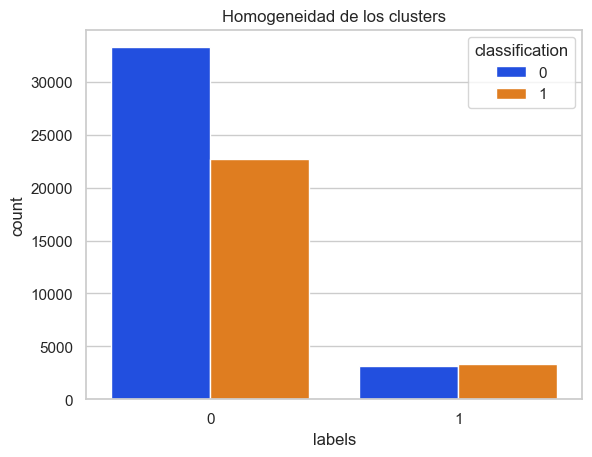

##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 0.00037426247864408275
completeness_score 0.00037498048388328237
v_measure_score 0.0003745314081532741


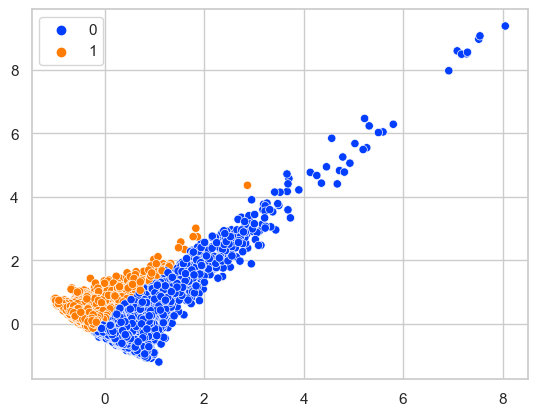

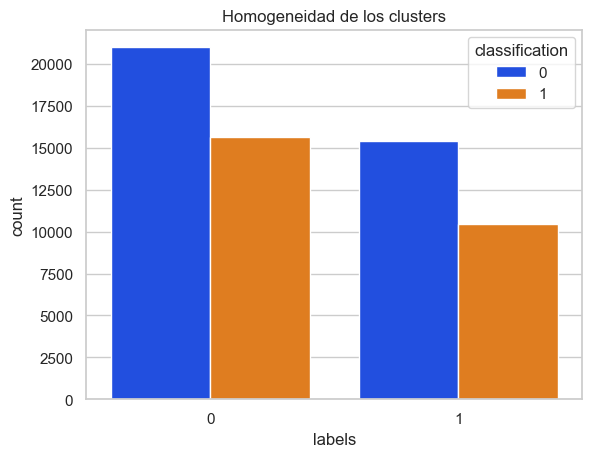

##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 0.0020802926562514834
completeness_score 0.012249738053765644
v_measure_score 0.003020678991401502


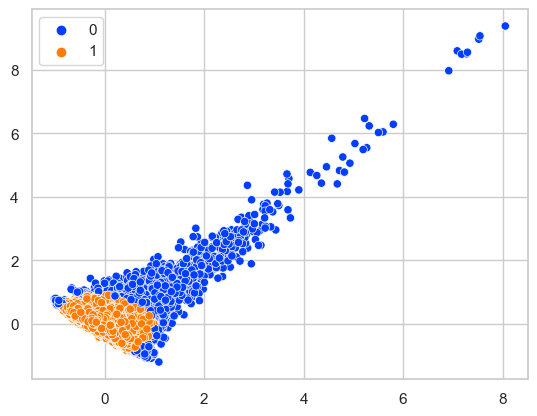

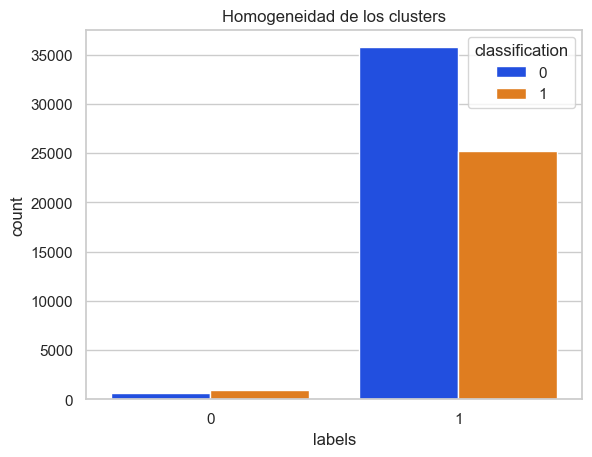

##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 0.002113843182636692
completeness_score 0.0017023821031691999
v_measure_score 0.0019381739382018613


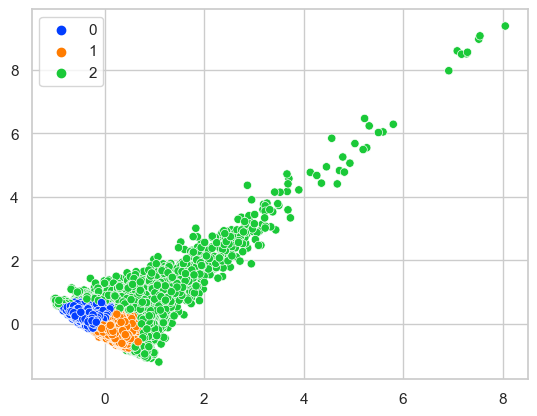

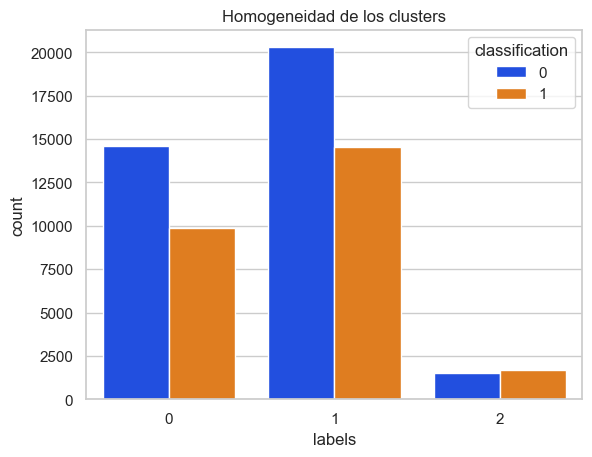

##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 0.004682433334336236
completeness_score 0.00545940539575523
v_measure_score 0.00494642020841251


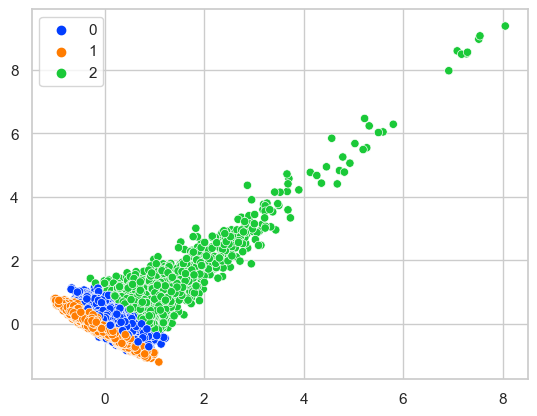

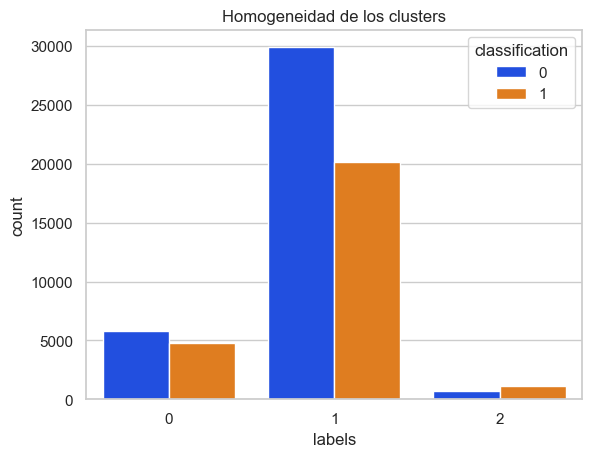

##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 0.003275600697364175
completeness_score 0.003115079375250656
v_measure_score 0.003213503267691404


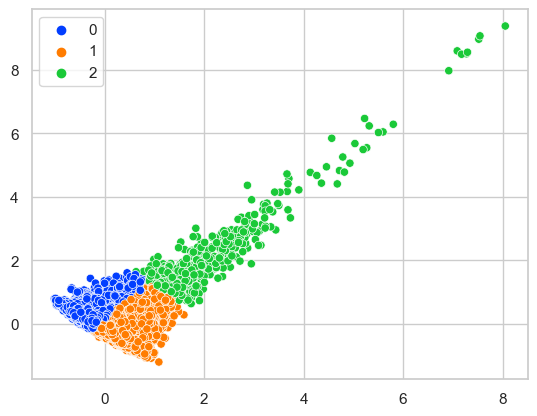

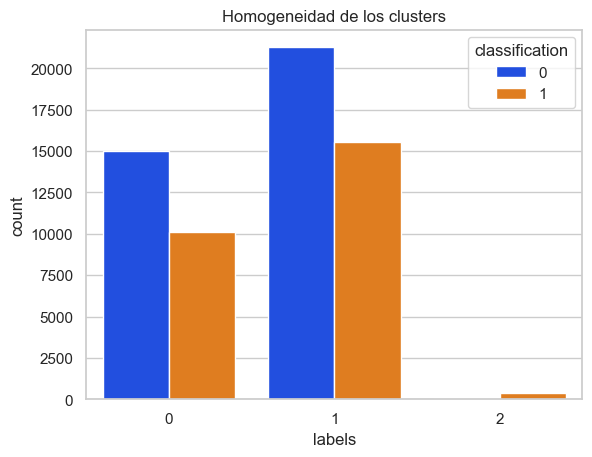

##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 0.0022338016256760605
completeness_score 0.001790111328446173
v_measure_score 0.002043835127350092


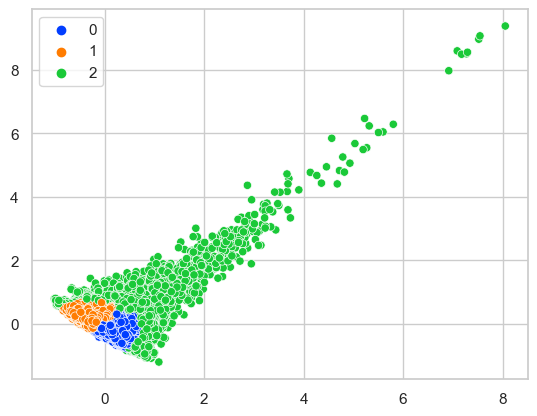

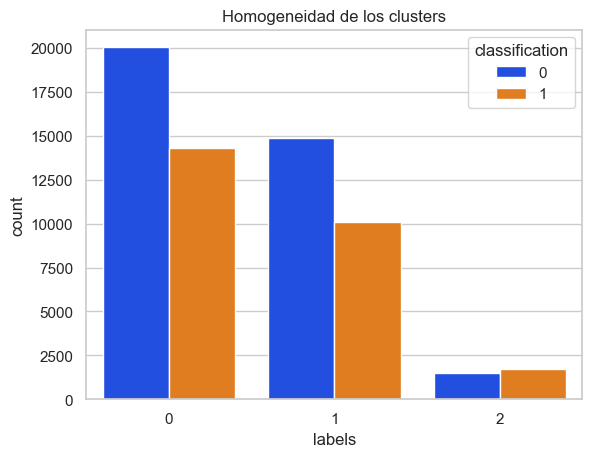

##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.0028325375417541485
completeness_score 0.0015494609839385878
v_measure_score 0.002161368388282047


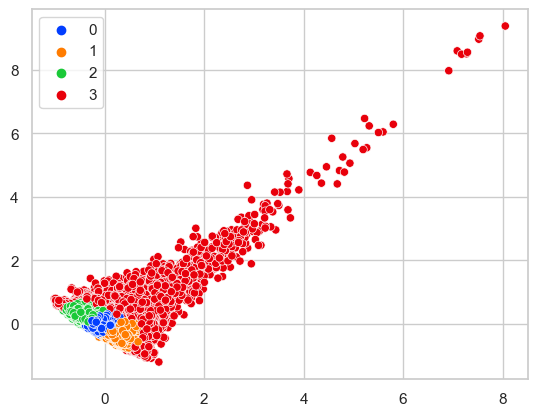

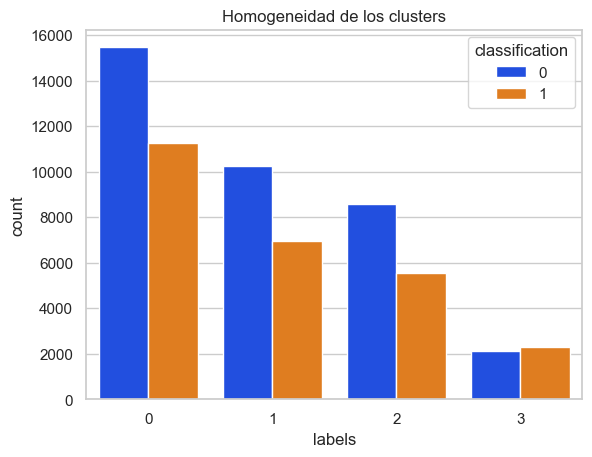

##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 0.004898479333606785
completeness_score 0.0032938706434245332
v_measure_score 0.004141842545725001


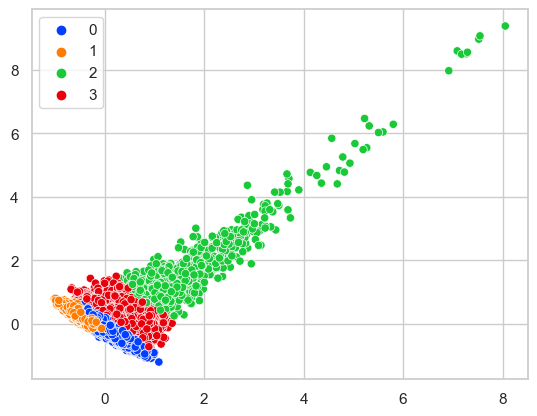

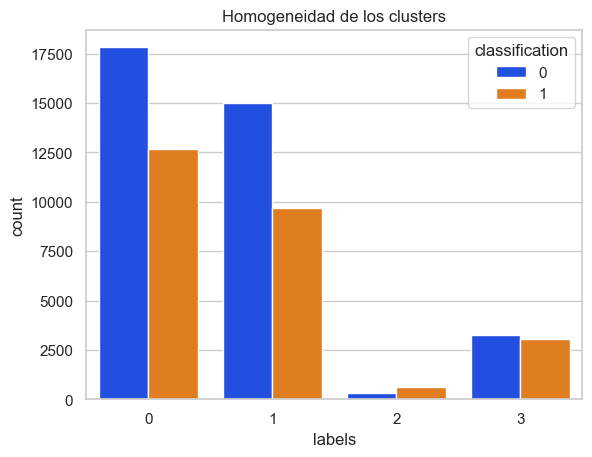

##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 0.0036325075864339714
completeness_score 0.0024608953697780956
v_measure_score 0.0030822243775860824


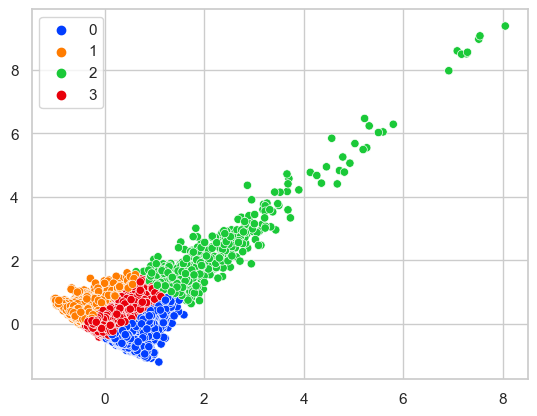

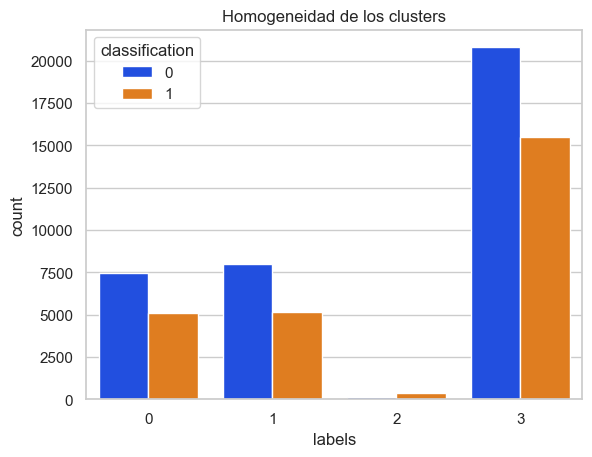

##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 0.0022853546376826015
completeness_score 0.0013044652101552774
v_measure_score 0.0017826752700647462


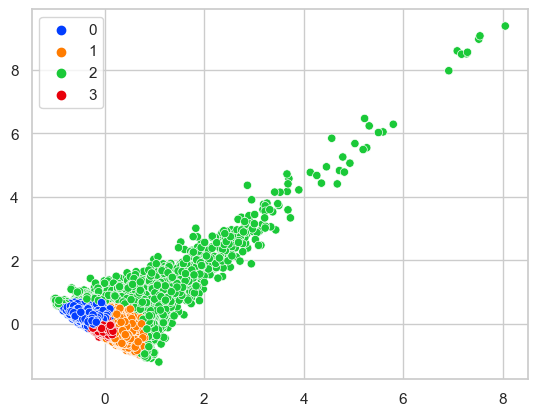

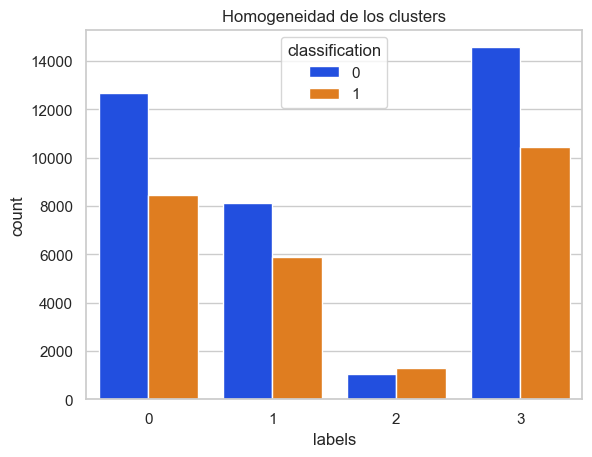

##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.004552290529950497
completeness_score 0.0023727073728564882
v_measure_score 0.0033859186300127324


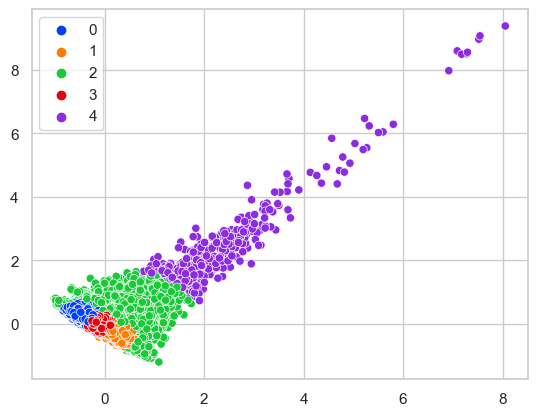

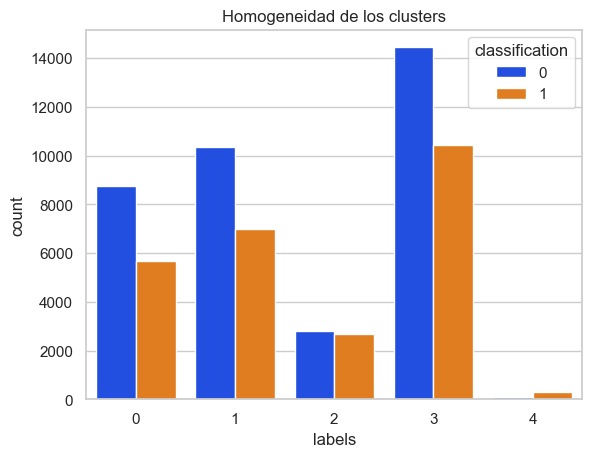

##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 0.005095951045217972
completeness_score 0.0025508426498736837
v_measure_score 0.0037084197974093128


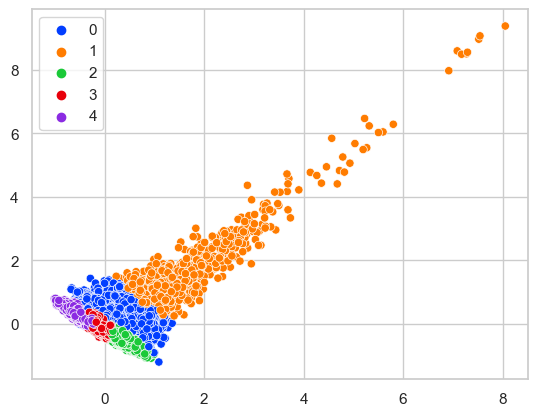

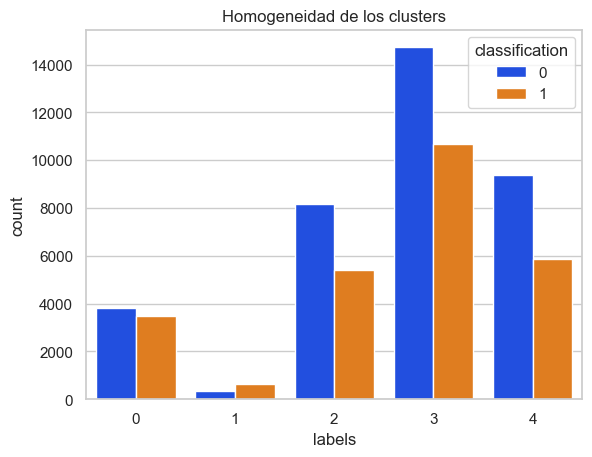

##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.004502462706870793
completeness_score 0.002872524372840536
v_measure_score 0.003712502111147773


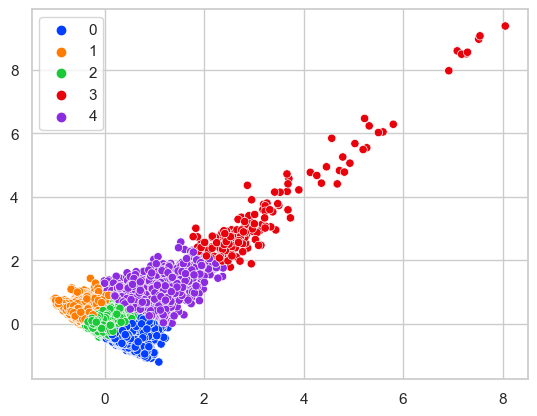

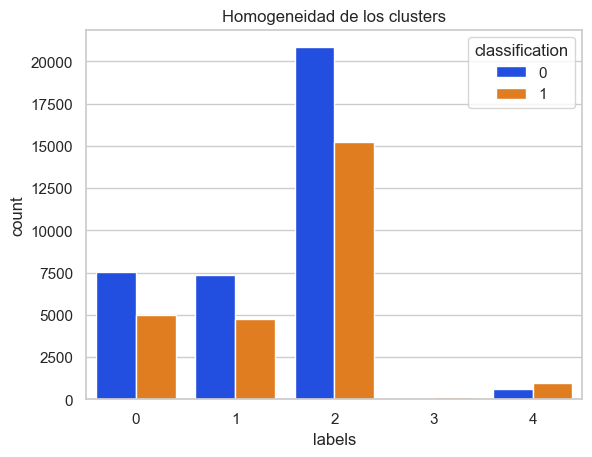

##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 0.004567200948025122
completeness_score 0.002363484593873516
v_measure_score 0.003383987823577669


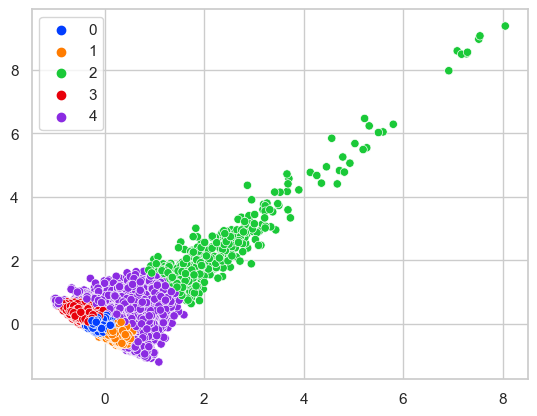

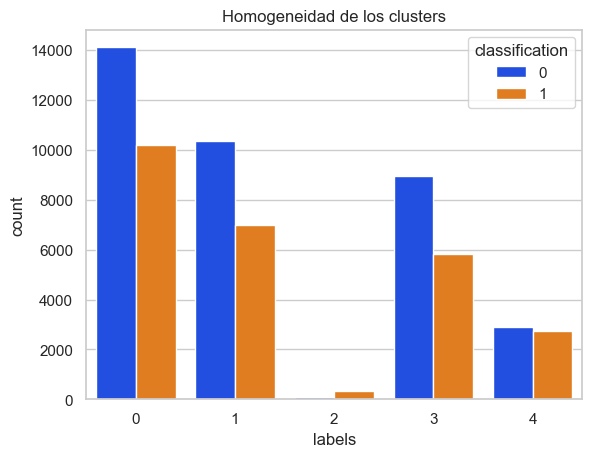

##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.0051458784886167725
completeness_score 0.0022765528619063014
v_measure_score 0.003494314625700858


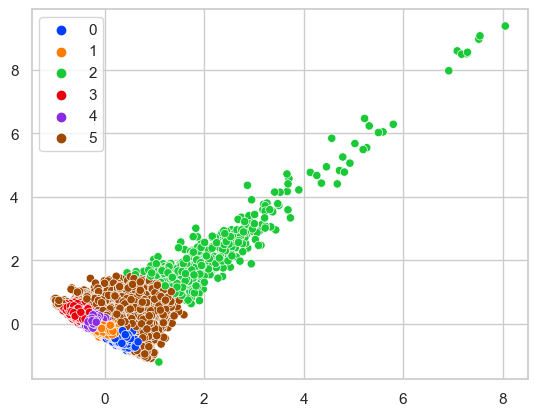

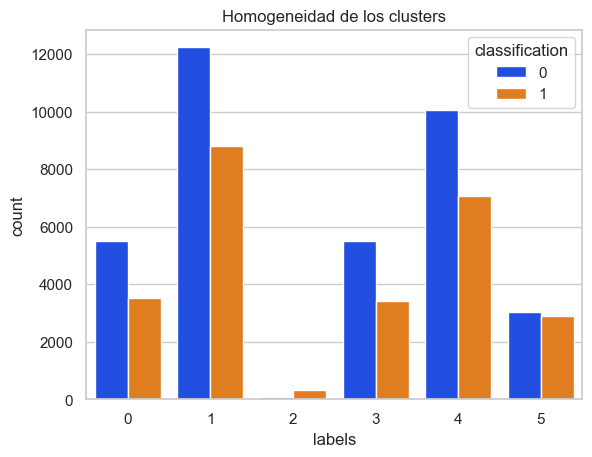

##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 0.005879459925705355
completeness_score 0.0028606123445282087
v_measure_score 0.004212422446309329


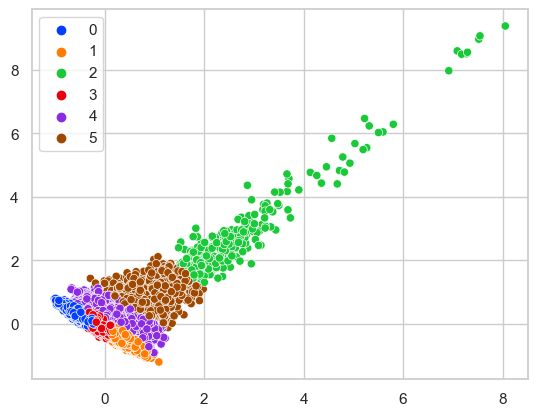

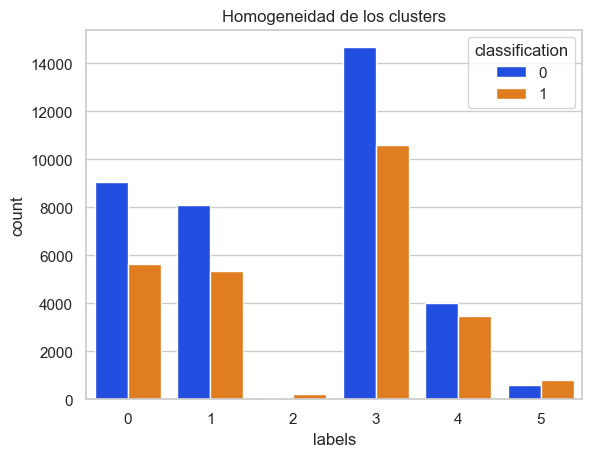

##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.00460972284788003
completeness_score 0.0024819356841821873
v_measure_score 0.0034882739003890984


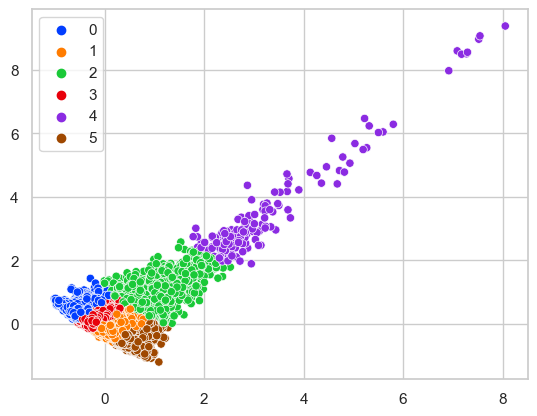

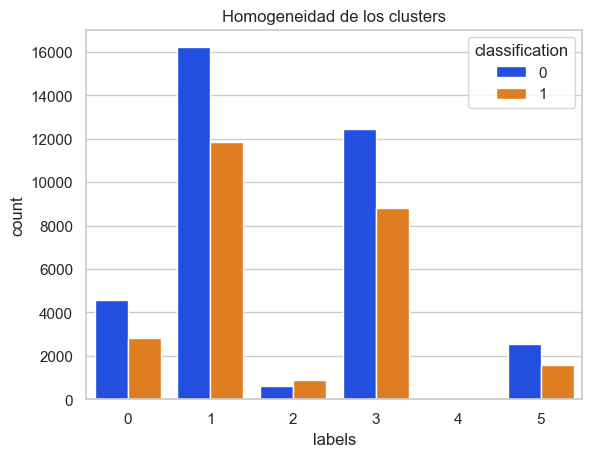

##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 0.004765775928739927
completeness_score 0.0024193711414443177
v_measure_score 0.0034947641404246437


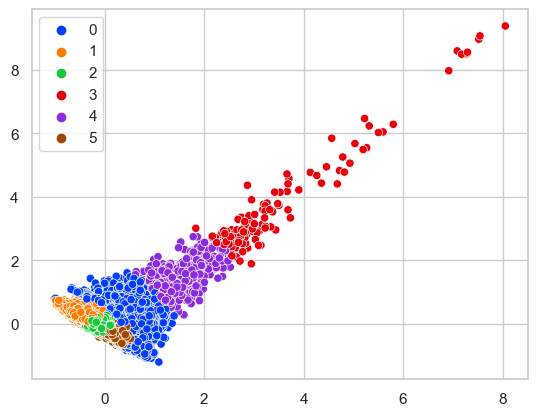

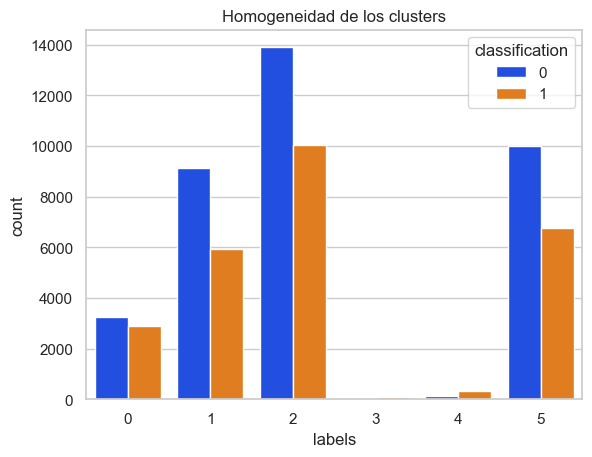

In [7]:
PCAs = pd.read_csv('right_PCA.csv').to_numpy()
test = pd.read_csv('right_test_PCA.csv').to_numpy()
GaussianAnalyze(PCAs, target, test, [2,3,4,5,6], 'right')

##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 0.0035926454606714274
completeness_score 0.0036169603859747034
v_measure_score 0.0036017251507278695


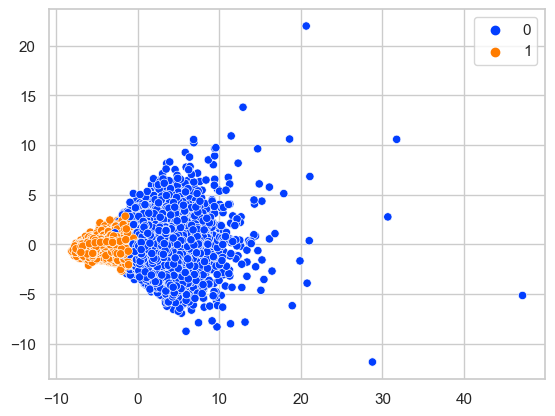

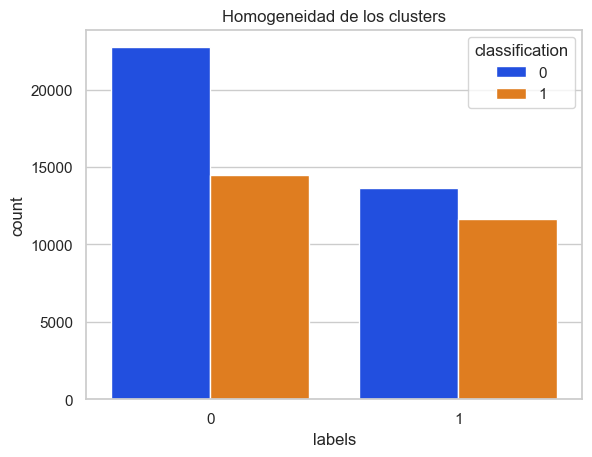

##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 0.0011072191452358492
completeness_score 0.001147991006778768
v_measure_score 0.0011221646262433408


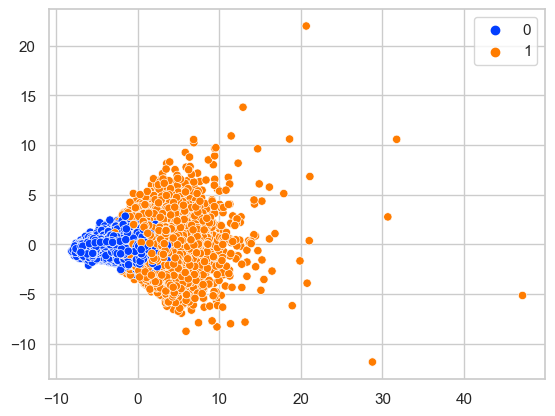

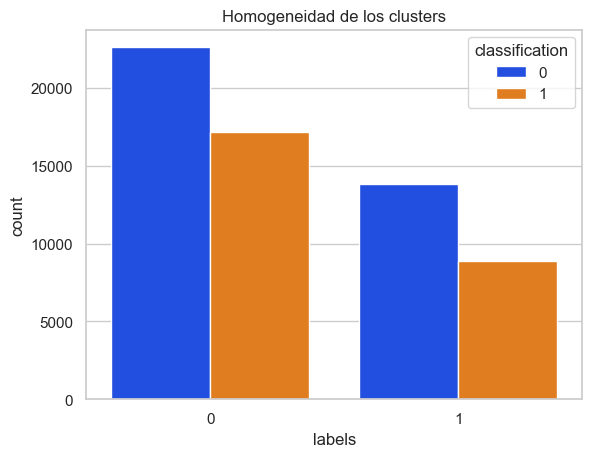

##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 0.002749602221466208
completeness_score 0.0028331311880616665
v_measure_score 0.002780341941105003


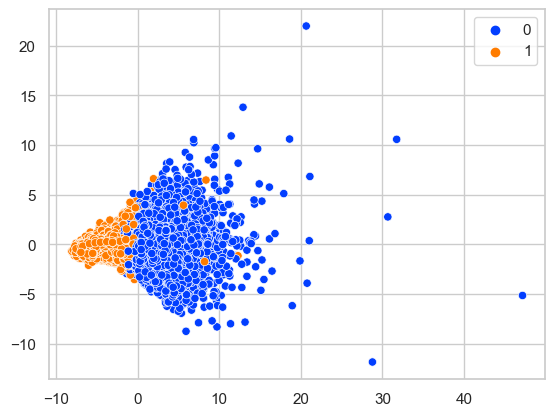

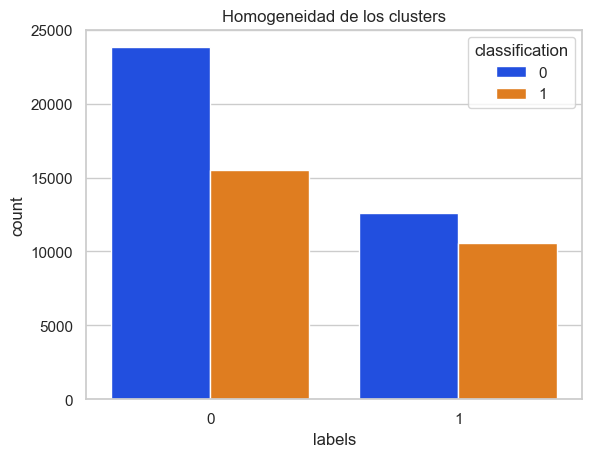

##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 0.0007650042160961126
completeness_score 0.0008206656318153152
v_measure_score 0.0007849693378273846


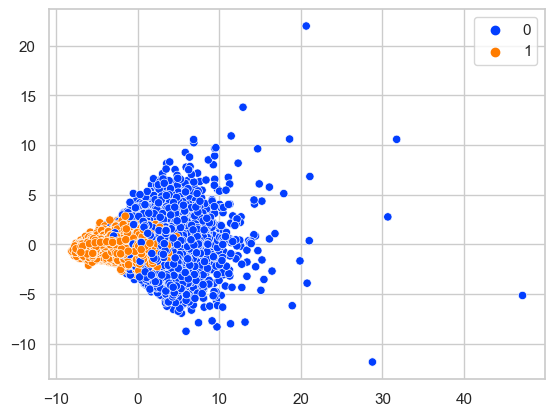

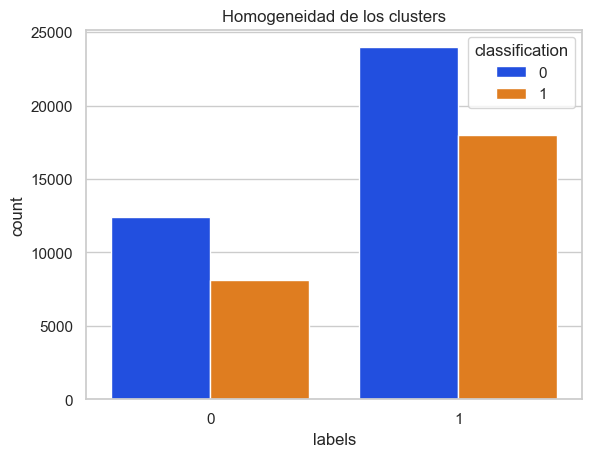

##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 0.0038247196277091658
completeness_score 0.002644786245700705
v_measure_score 0.0032765499904830356


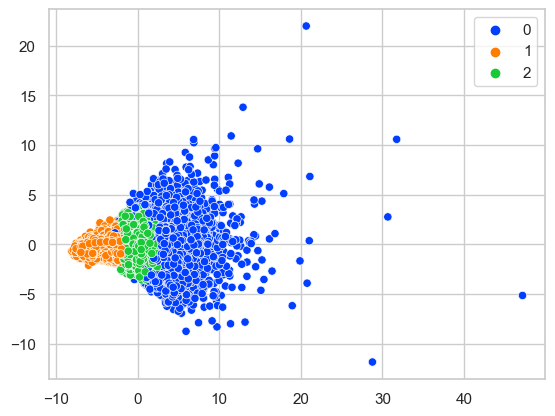

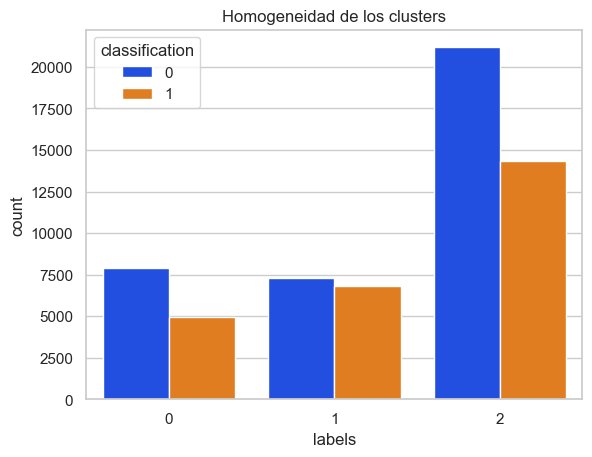

##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 0.0032682724646387372
completeness_score 0.0024396157268595123
v_measure_score 0.0028990107099249336


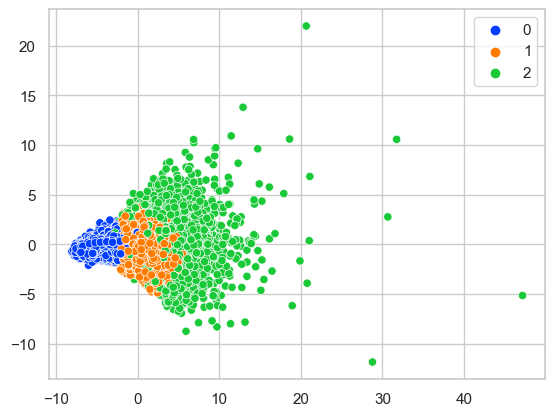

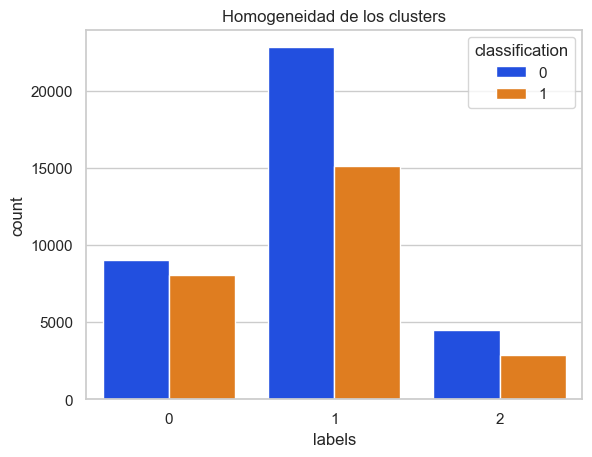

##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 0.0028072901194541033
completeness_score 0.0027140058695552583
v_measure_score 0.0027715666089969393


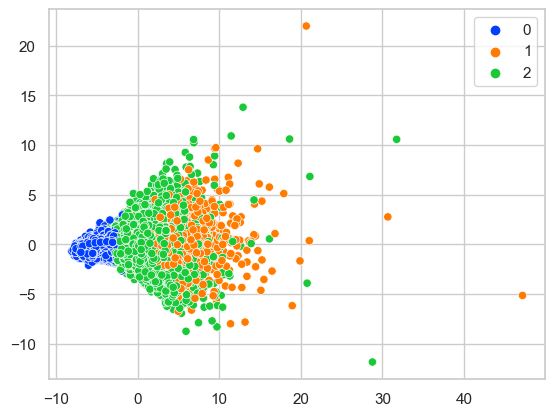

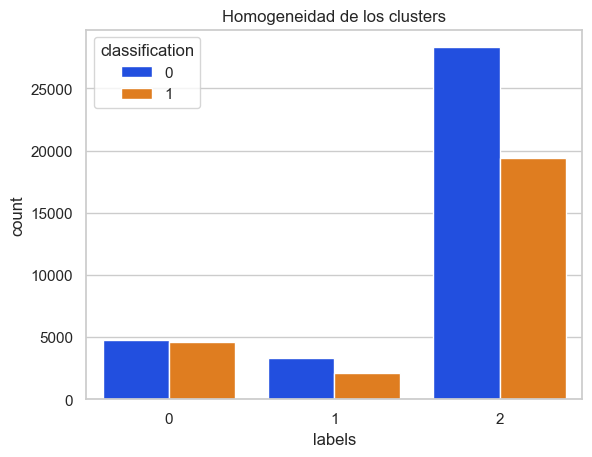

##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 0.0021228302151186738
completeness_score 0.001643382038263537
v_measure_score 0.0019134865526834579


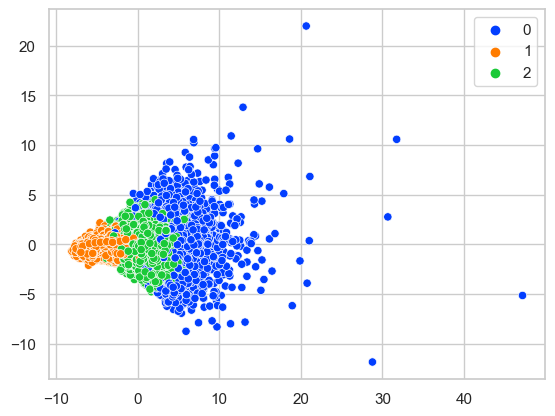

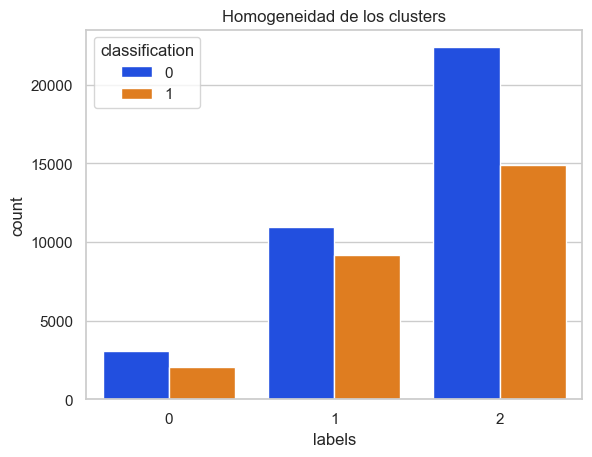

##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.0039809587615496295
completeness_score 0.0023015929961910883
v_measure_score 0.003125703406520263


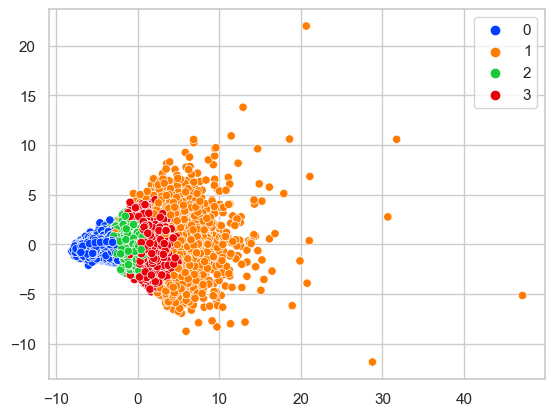

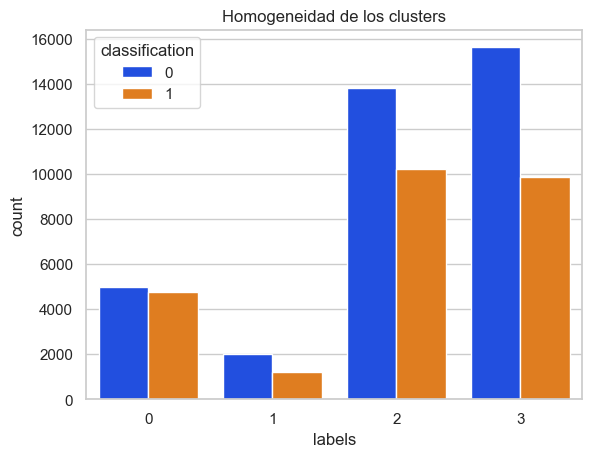

##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 0.0028440665325208813
completeness_score 0.0015536987839207391
v_measure_score 0.0021686550738783637


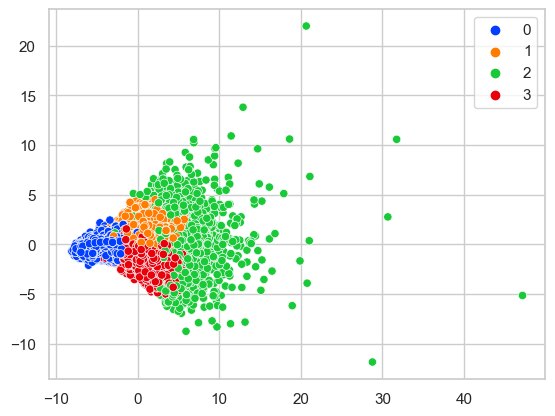

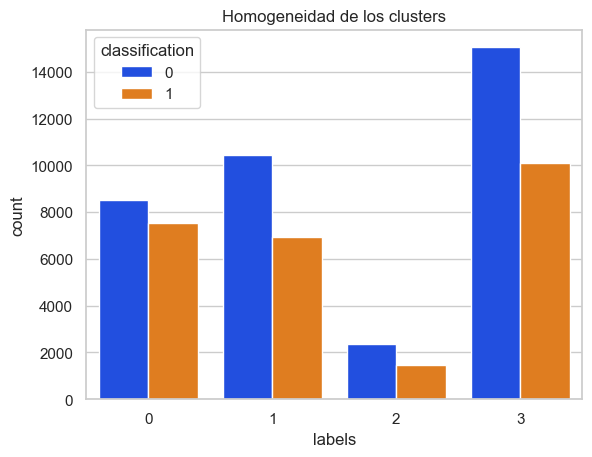

##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 0.003235683647062972
completeness_score 0.002122739686480025
v_measure_score 0.0027040396844585


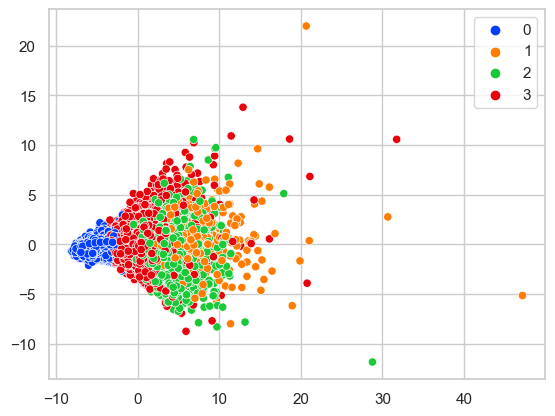

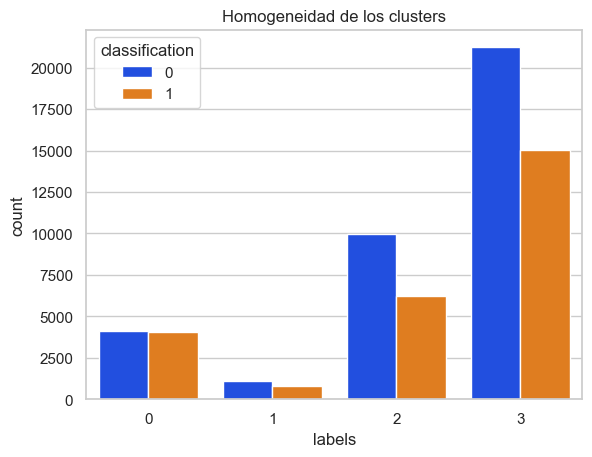

##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 0.002790064266198991
completeness_score 0.0016990490187000367
v_measure_score 0.002248601422115095


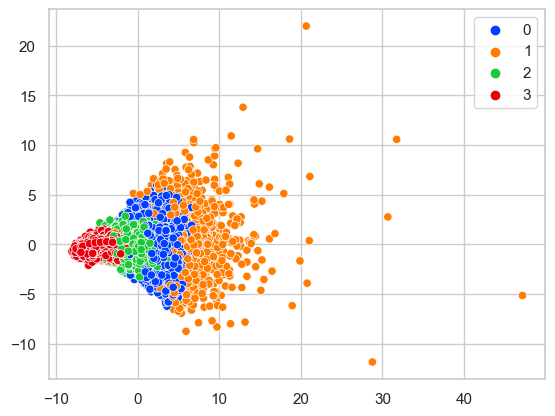

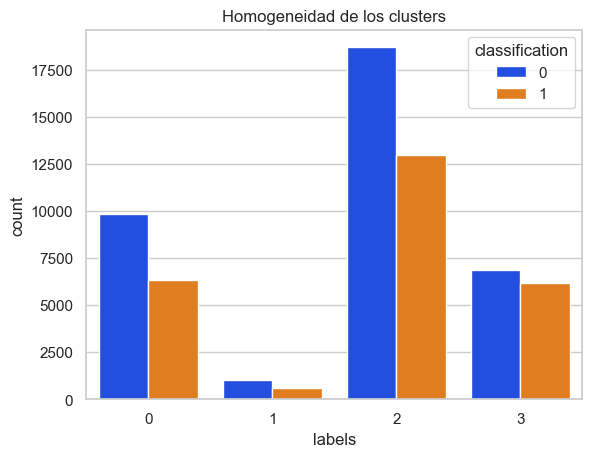

##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.003987127150503401
completeness_score 0.0018609808071735155
v_measure_score 0.00279126022539338


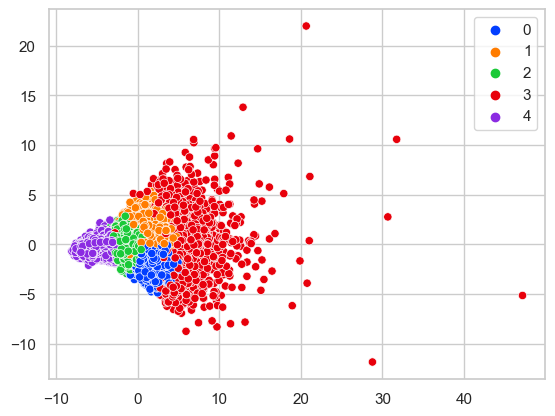

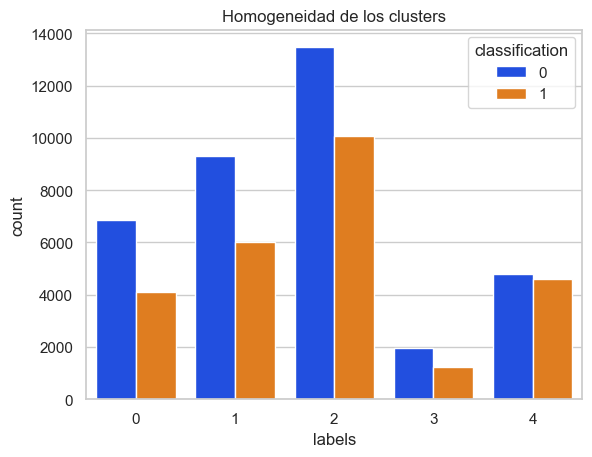

##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 0.0026399258308894657
completeness_score 0.001223182009511277
v_measure_score 0.001840513917702326


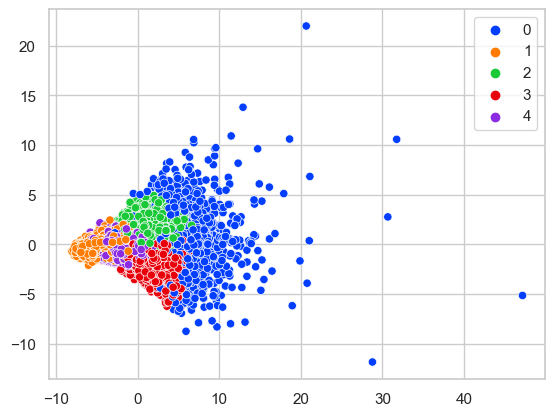

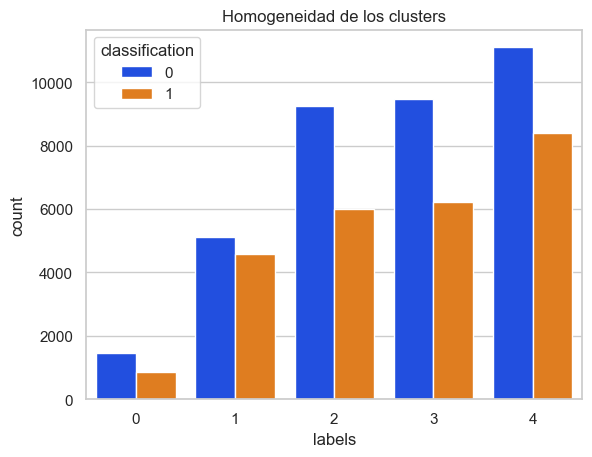

##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.0027965956679203187
completeness_score 0.0017647264948906771
v_measure_score 0.002293664650151169


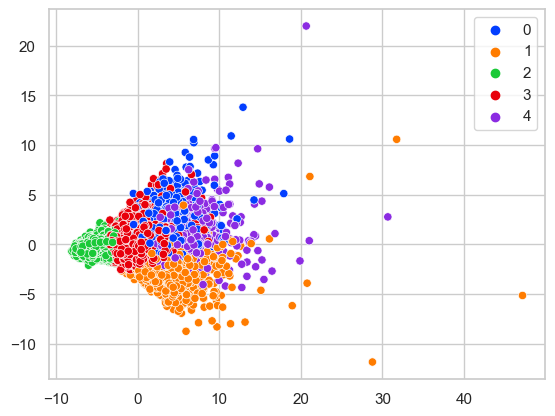

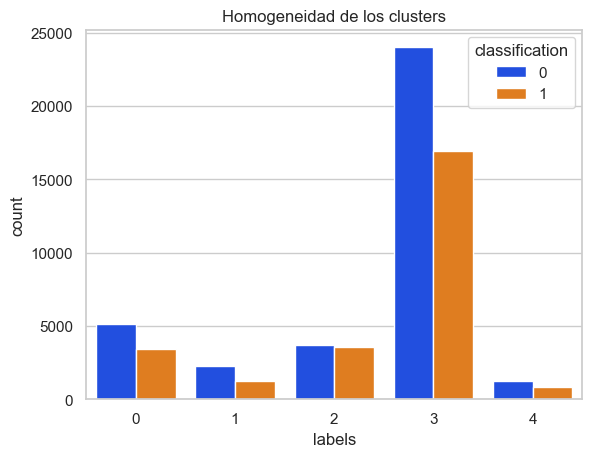

##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 0.0031440483000780236
completeness_score 0.001595840487793914
v_measure_score 0.0023053469556818915


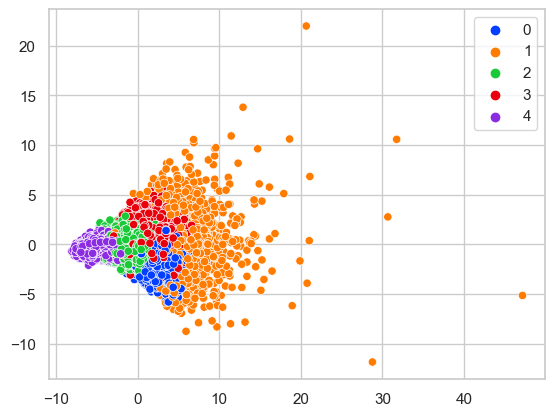

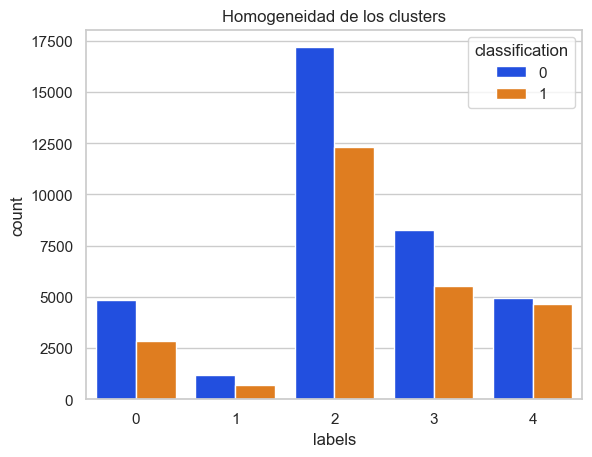

##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.00467901840774465
completeness_score 0.002067087675812544
v_measure_score 0.0031747071738732853


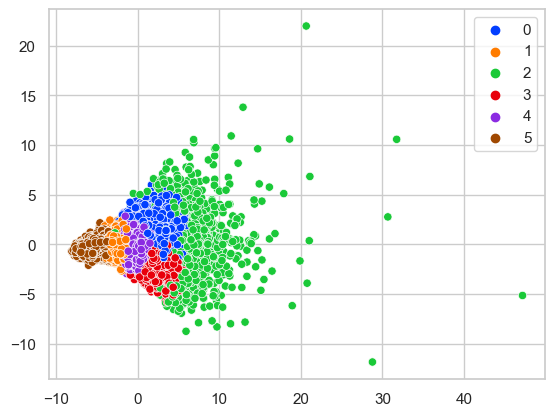

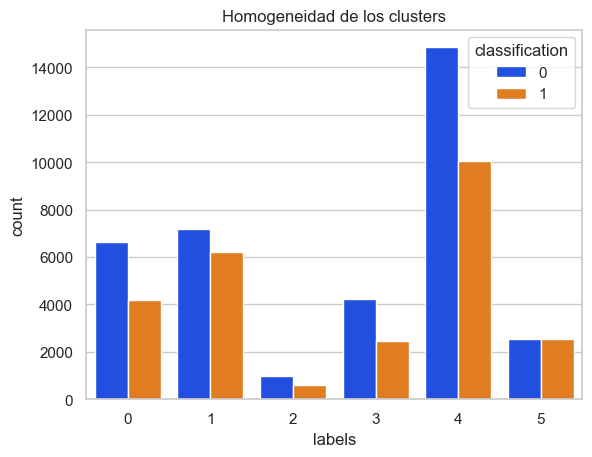

##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 0.003488797290229462
completeness_score 0.0014085120060475403
v_measure_score 0.002245257350758687


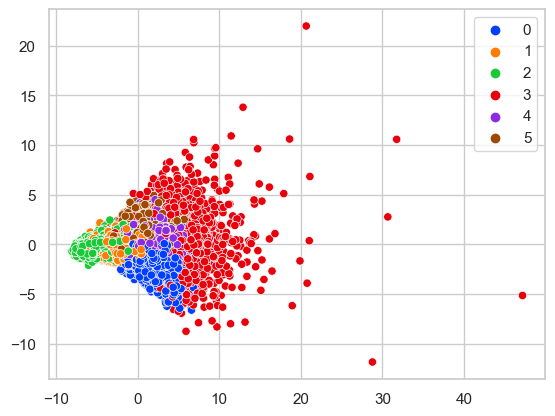

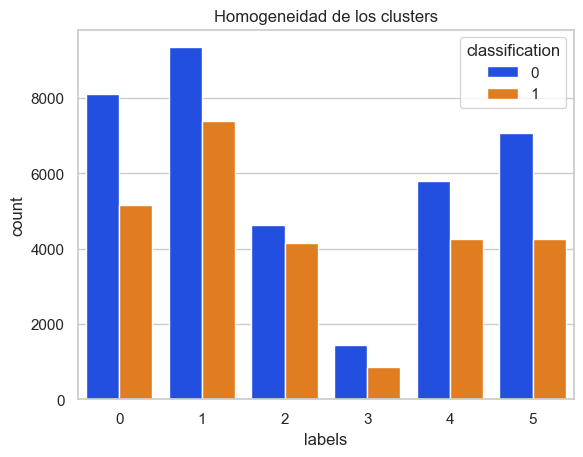

##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.0038459082003965105
completeness_score 0.00180324168475293
v_measure_score 0.0026992797823242195


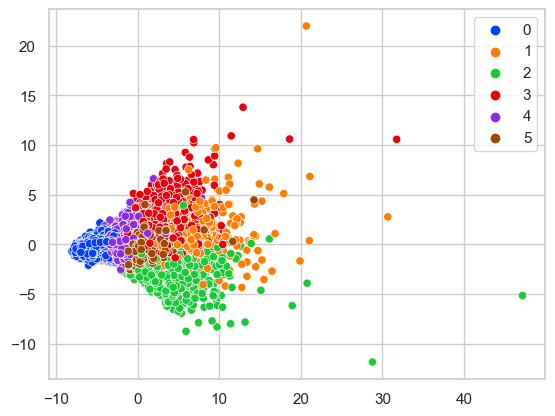

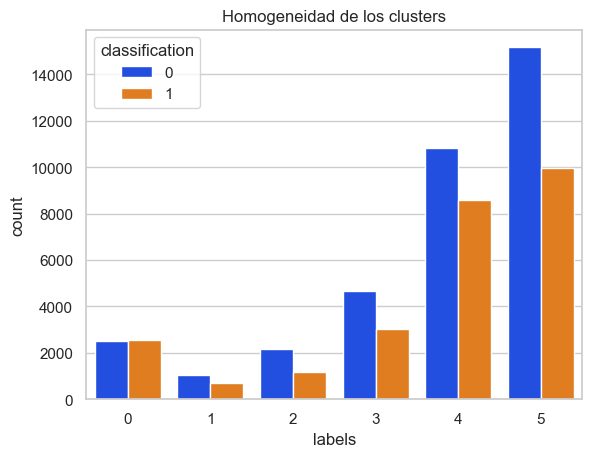

##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 0.0037144237035559016
completeness_score 0.0016142050701628198
v_measure_score 0.0024964084787731013


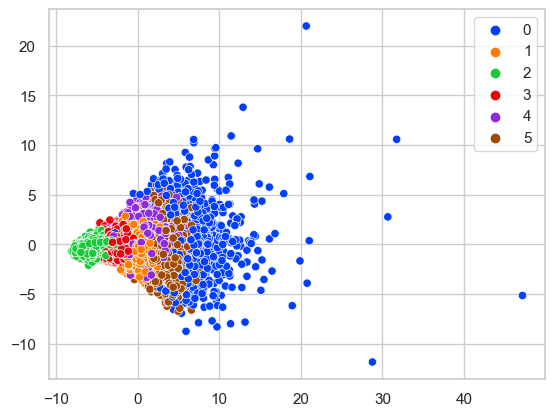

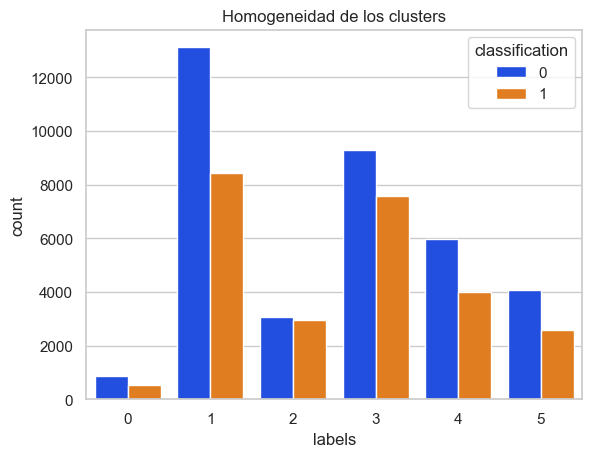

In [8]:
PCAs = pd.read_csv('max_dist_PCA.csv').to_numpy()
test = pd.read_csv('max_dist_test_PCA.csv').to_numpy()
GaussianAnalyze(PCAs, target, test, [2,3,4,5,6], 'max_dist')

##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 0.00178833423216327
completeness_score 0.0018022702720835498
v_measure_score 0.0017935349173616685


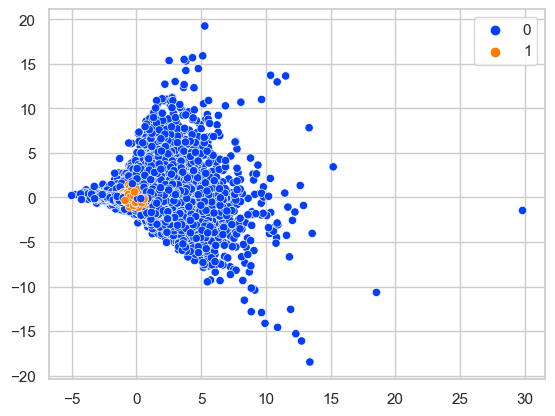

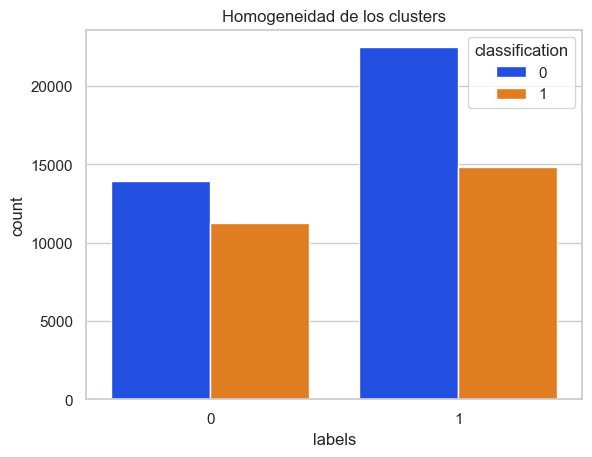

##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 0.0023093569406719573
completeness_score 0.0023724363314434694
v_measure_score 0.0023326146636406956


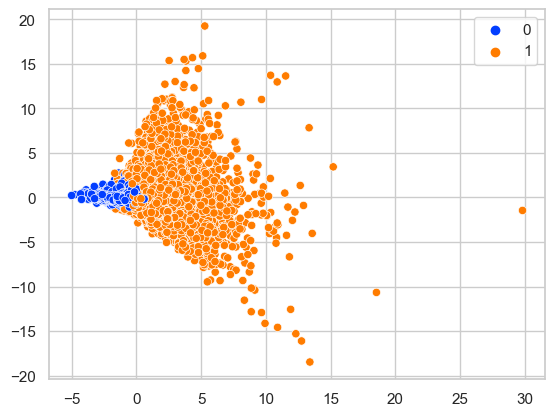

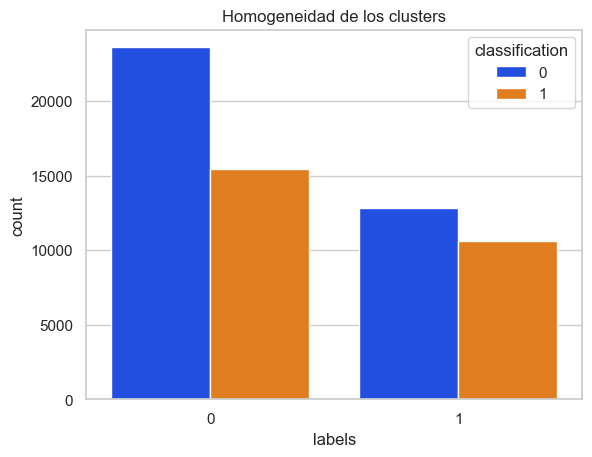

##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 0.0005472684336384969
completeness_score 0.0018014055623354229
v_measure_score 0.000740627552351199


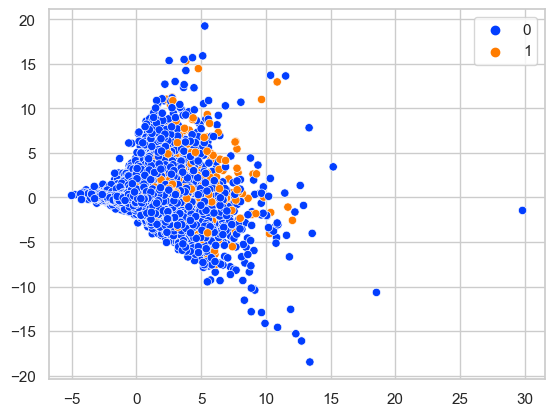

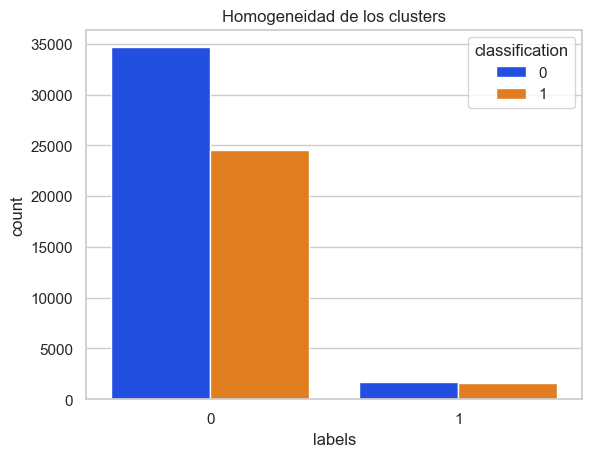

##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 0.0021423206923812505
completeness_score 0.002177832823277642
v_measure_score 0.0021555011876028046


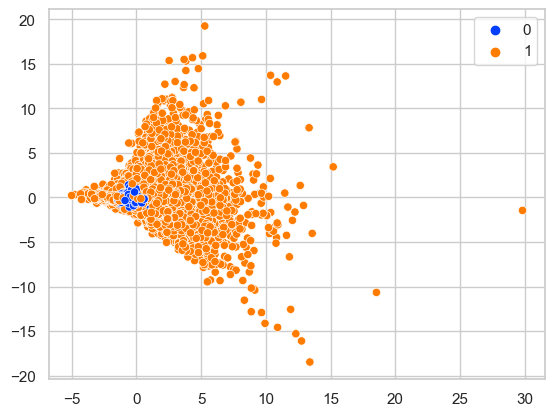

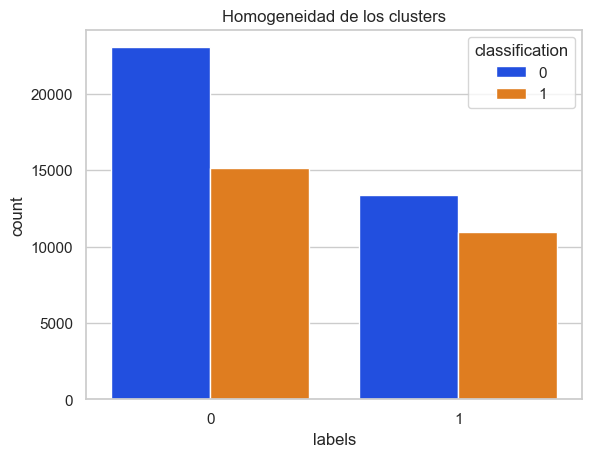

##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 0.0021256191037265174
completeness_score 0.0016254805392601588
v_measure_score 0.0019057311356553916


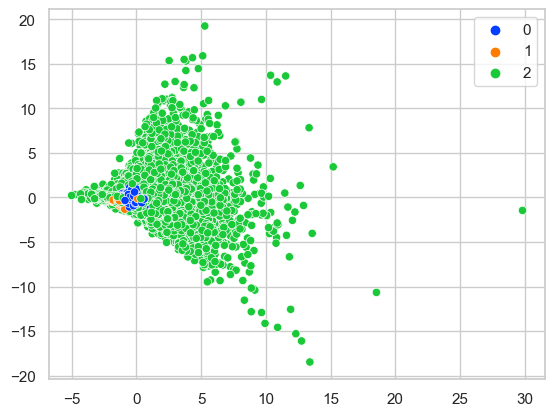

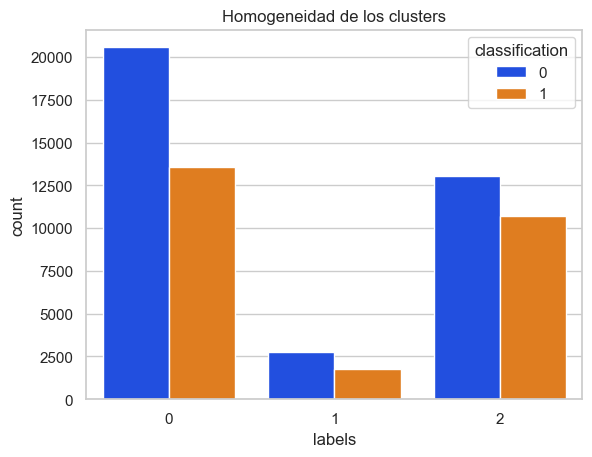

##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 0.003043113211682679
completeness_score 0.0020138580102457837
v_measure_score 0.002553681389797303


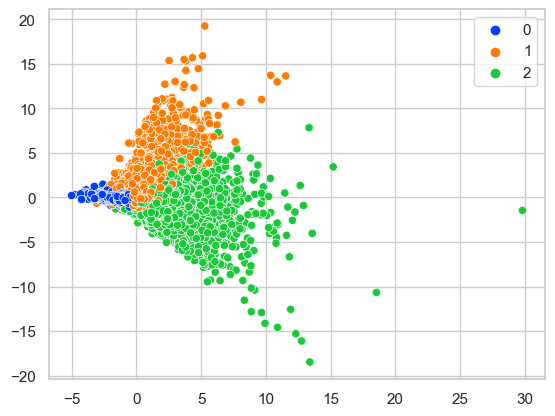

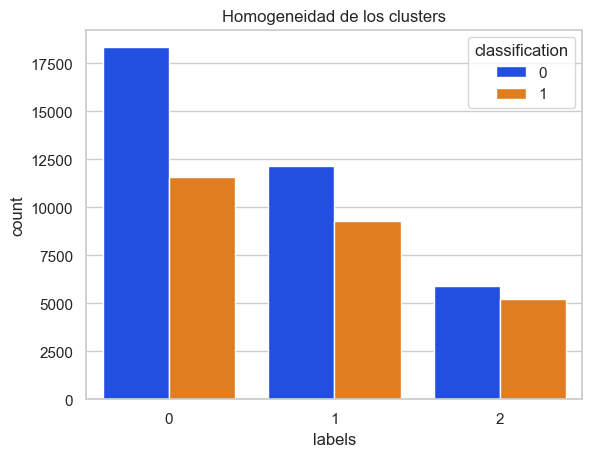

##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 0.0008666465211982687
completeness_score 0.0014469829484986094
v_measure_score 0.001020064110373884


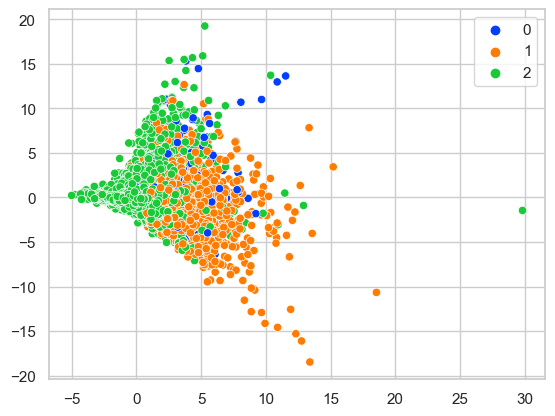

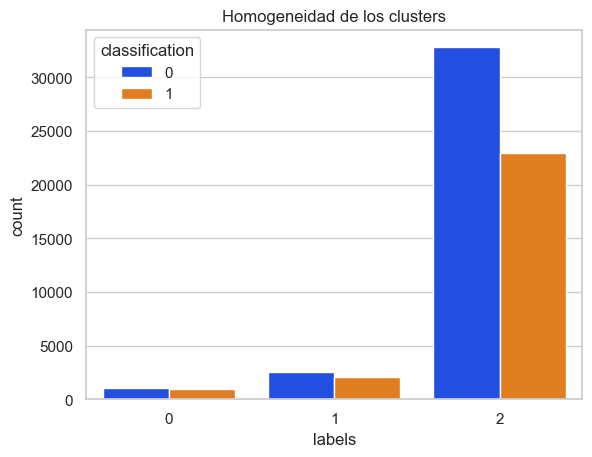

##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 0.0022934049287051408
completeness_score 0.0014941046793046967
v_measure_score 0.0019101941611138517


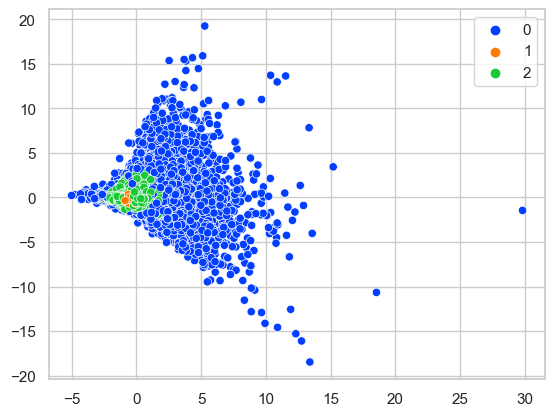

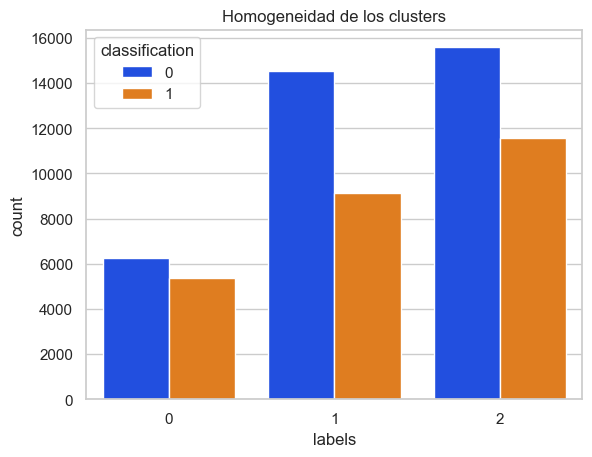

##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.002230714342236959
completeness_score 0.001376282670878533
v_measure_score 0.0018094556248648111


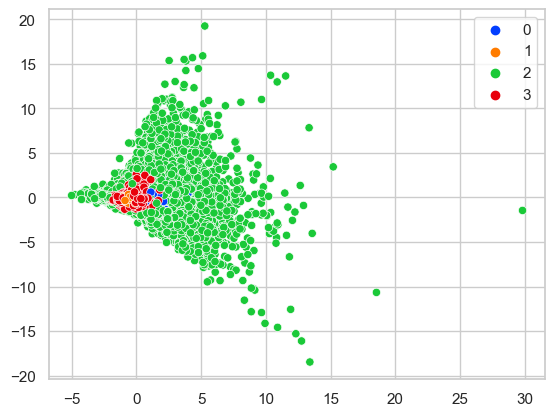

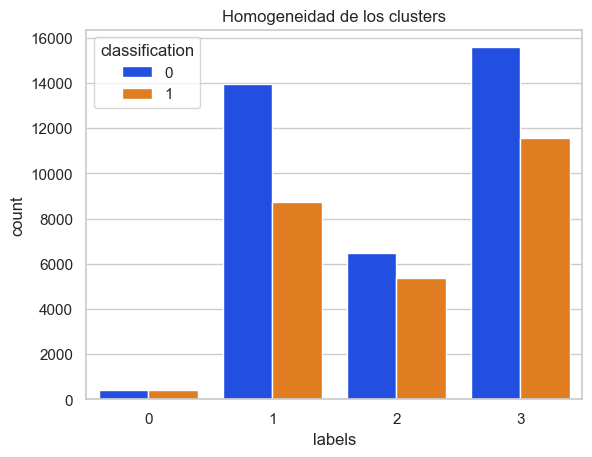

##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 0.003255638100697384
completeness_score 0.0016722335304627787
v_measure_score 0.0024025430638413936


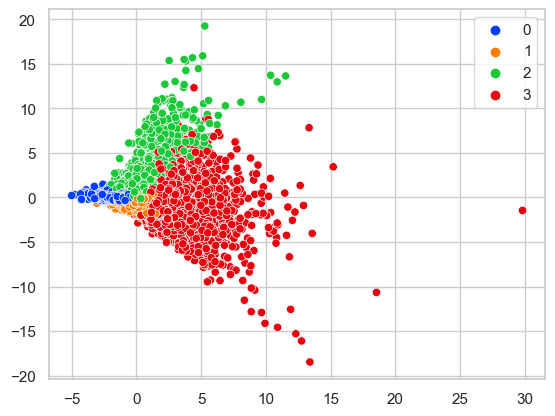

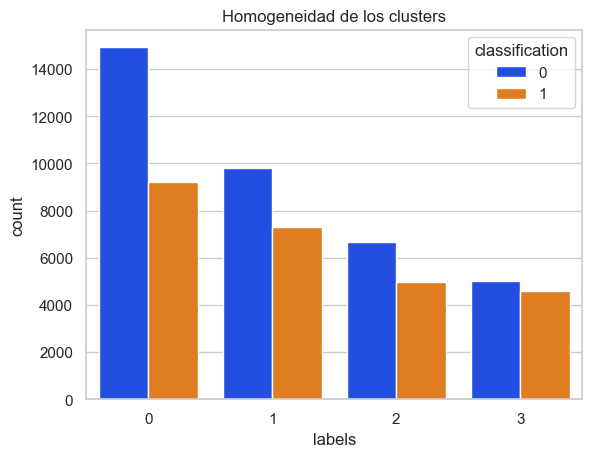

##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 0.00041965123387922187
completeness_score 0.0005580754249925249
v_measure_score 0.00046268788740565274


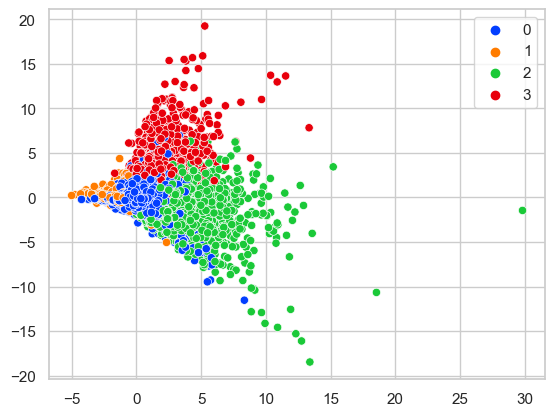

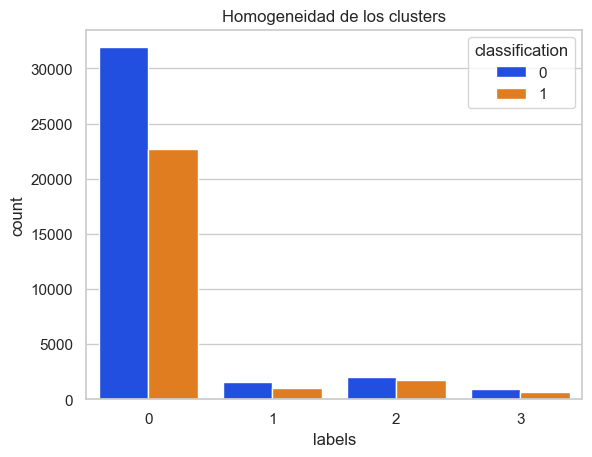

##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 0.0028836750573039915
completeness_score 0.0015119092198869353
v_measure_score 0.0021516107400865007


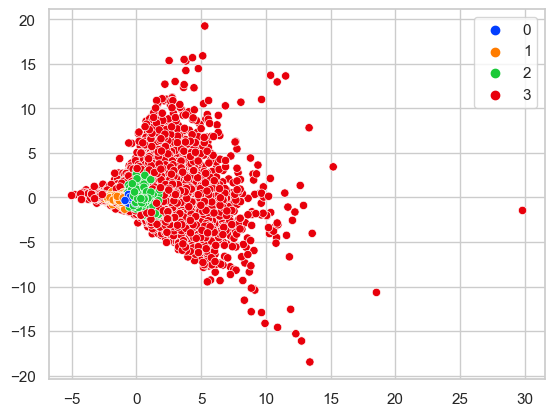

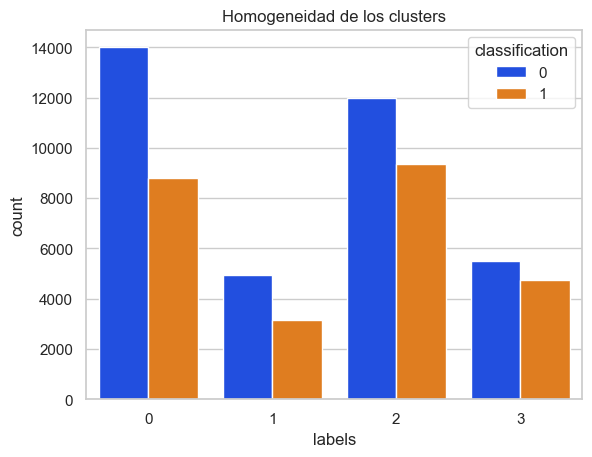

##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.0023989087060634733
completeness_score 0.0011269459724343183
v_measure_score 0.0016855081815646497


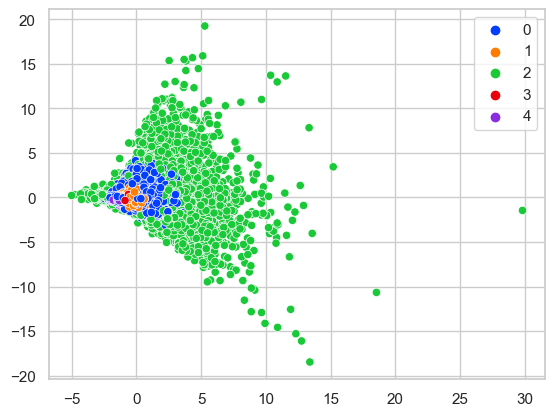

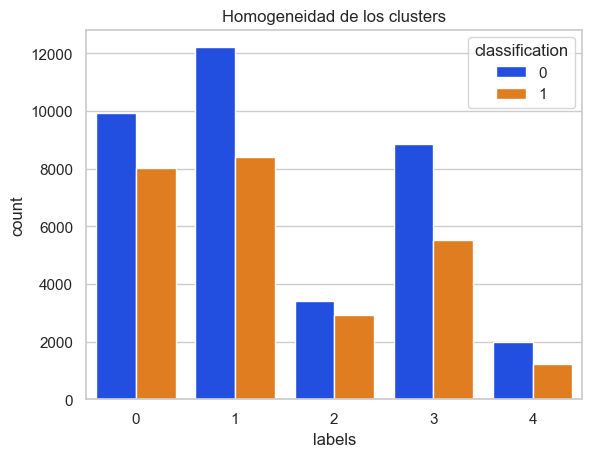

##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 0.0036400735784365675
completeness_score 0.001594330345800892
v_measure_score 0.0024575561911131714


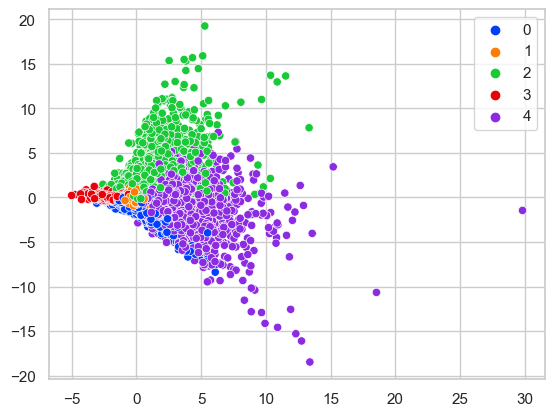

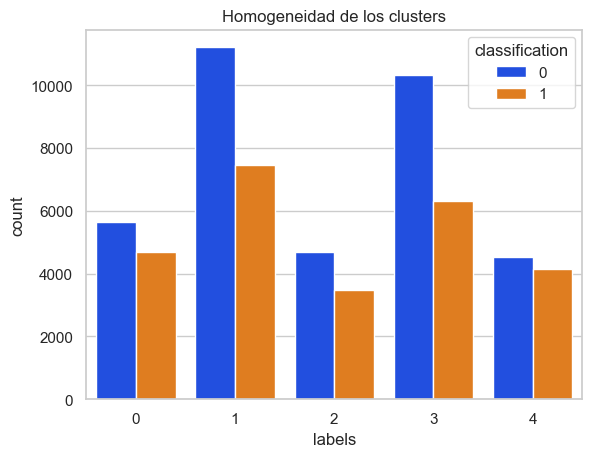

##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.0008141526046680217
completeness_score 0.0011440614198134785
v_measure_score 0.0009128677302464264


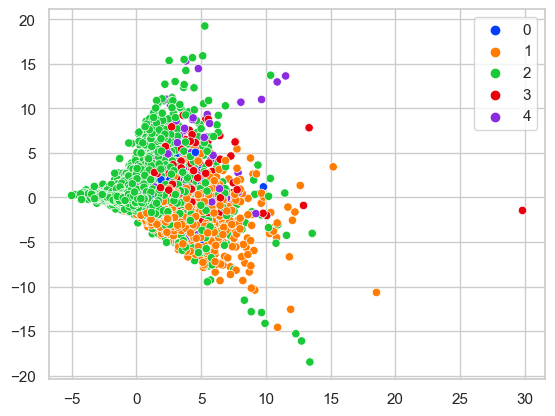

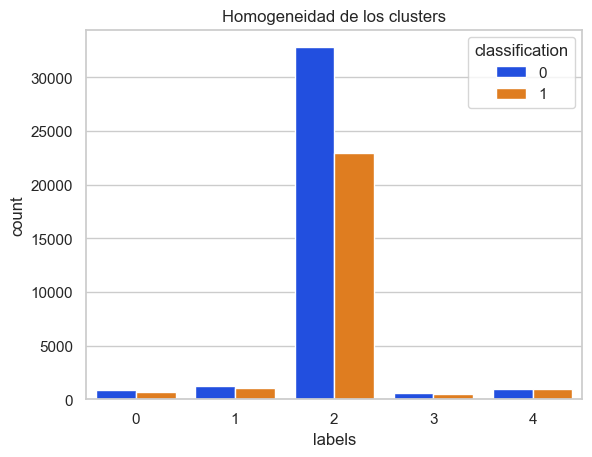

##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 0.003000685627874387
completeness_score 0.0013381027147050073
v_measure_score 0.002046943473333152


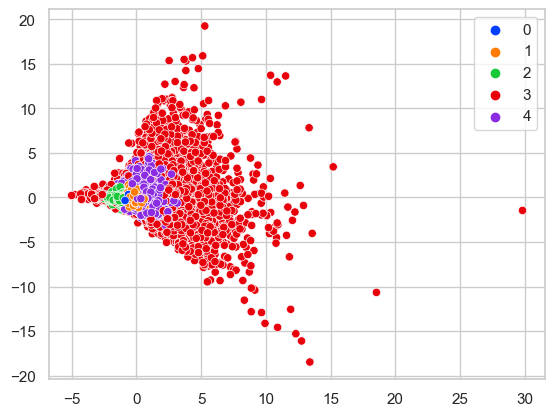

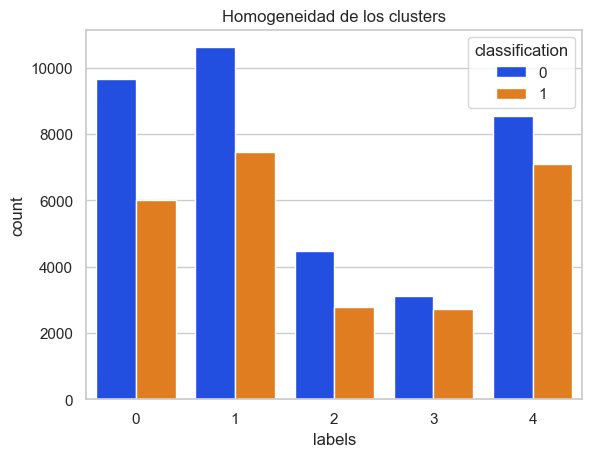

##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.002533640414896932
completeness_score 0.001149321303998541
v_measure_score 0.0017453221041982497


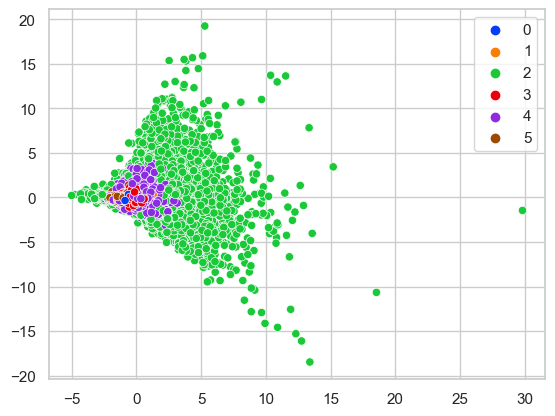

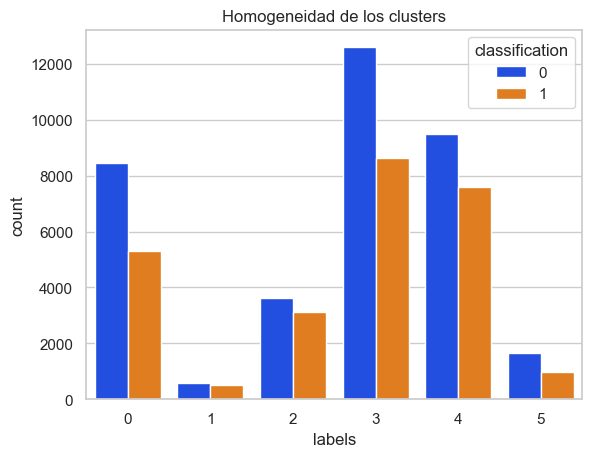

##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 0.0039638389825768575
completeness_score 0.0015312822269086747
v_measure_score 0.0024840509577490244


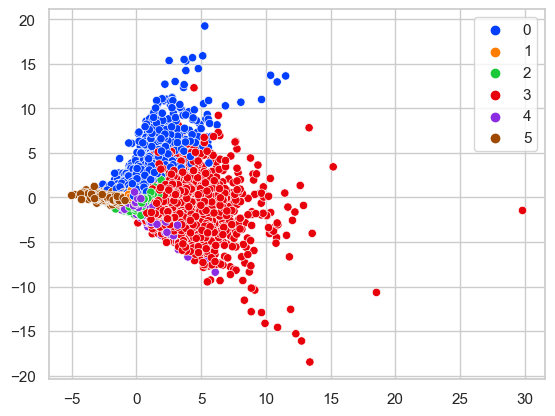

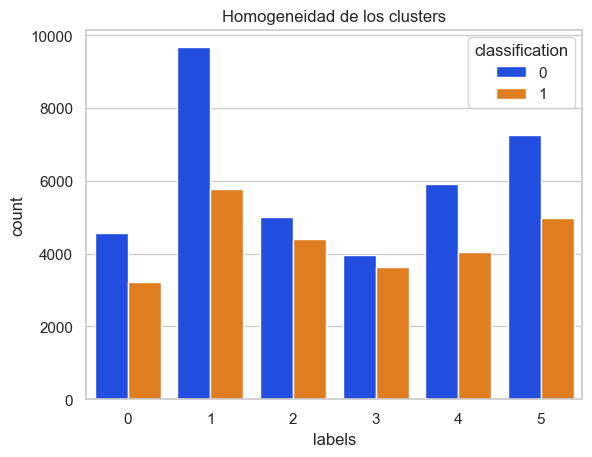

##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.0007400049979683225
completeness_score 0.000898586925284555
v_measure_score 0.0007924490466080315


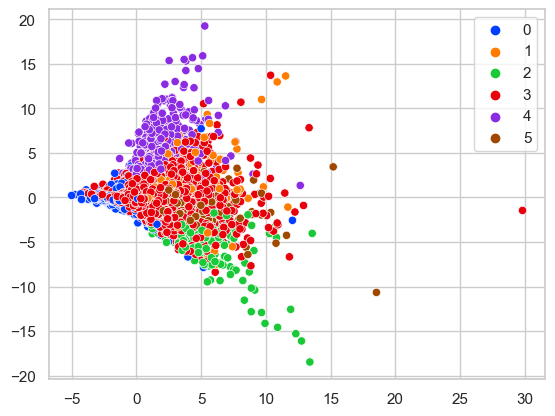

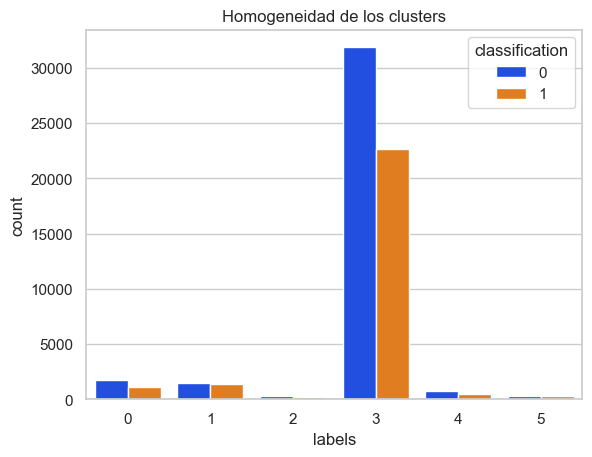

##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 0.0030871209639307174
completeness_score 0.0012435790961166982
v_measure_score 0.0019841152621518925


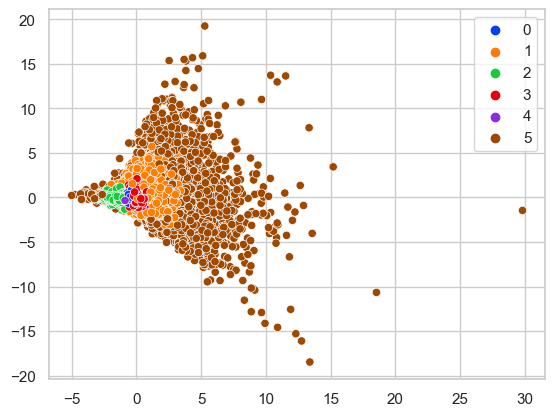

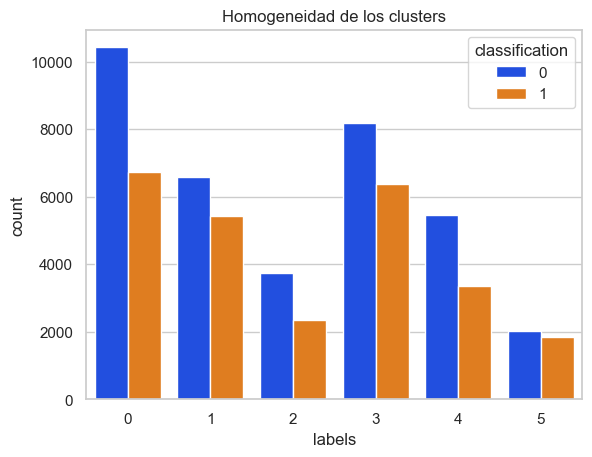

In [9]:
PCAs = pd.read_csv('min_dist_PCA.csv').to_numpy()
test = pd.read_csv('min_dist_test_PCA.csv').to_numpy()
GaussianAnalyze(PCAs, target, test, [2,3,4,5,6], 'min_dist')

In [10]:
df = pd.DataFrame(label_save)
df.to_csv('gaussian.csv', index=False)

df = pd.DataFrame(test_label_save)
df.to_csv('gaussian_test.csv', index=False)

In [11]:
df  = pd.read_csv("train.csv")
target = df['tgt']

origin_df = df.drop(['tgt', 'src', 'Unnamed: 0', 'src_bio_57'], axis=1)
df = pd.read_csv("test.csv")
test_origin_df = df.drop(['tgt', 'src', 'Unnamed: 0', 'src_bio_57'], axis=1)

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 2, cov_type = spherical)
homogeneity_score 0.05167722103589539
completeness_score 0.05321306599160801
v_measure_score 0.05224265988176839


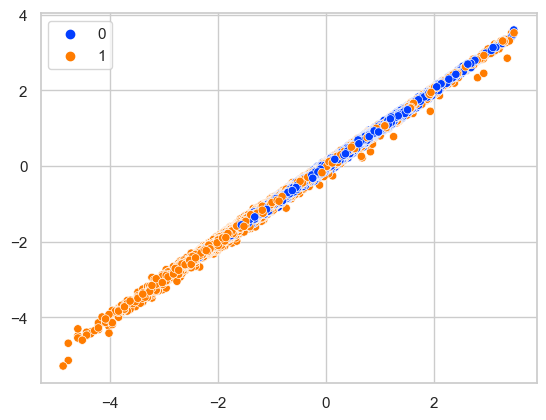

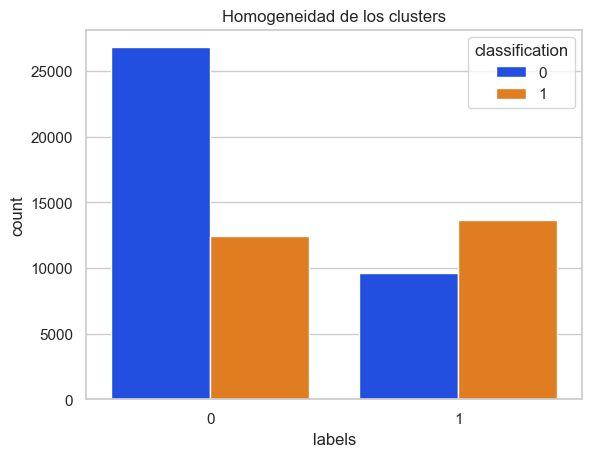

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 2, cov_type = full)
homogeneity_score 0.08634794282000426
completeness_score 0.09775512019322659
v_measure_score 0.0902993765249957


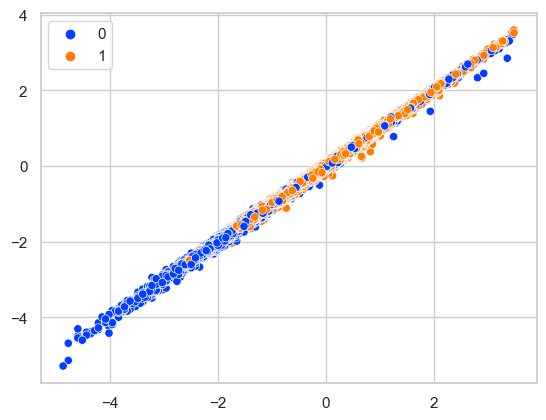

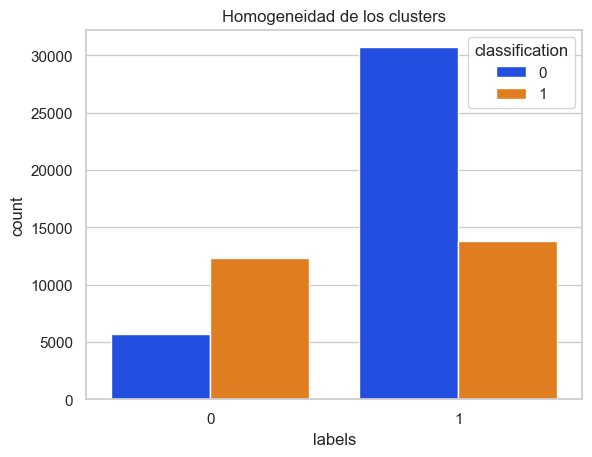

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 2, cov_type = tied)
homogeneity_score 0.12361381547373641
completeness_score 0.17925909321599065
v_measure_score 0.13989901329321716


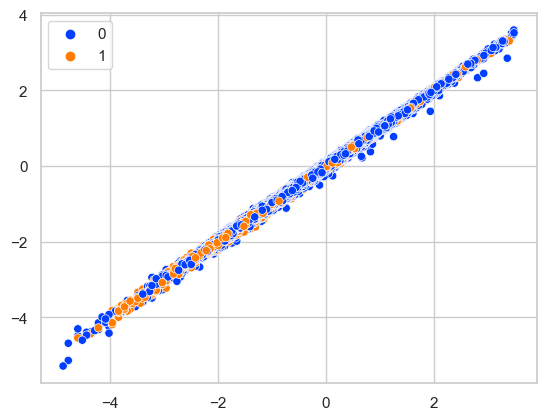

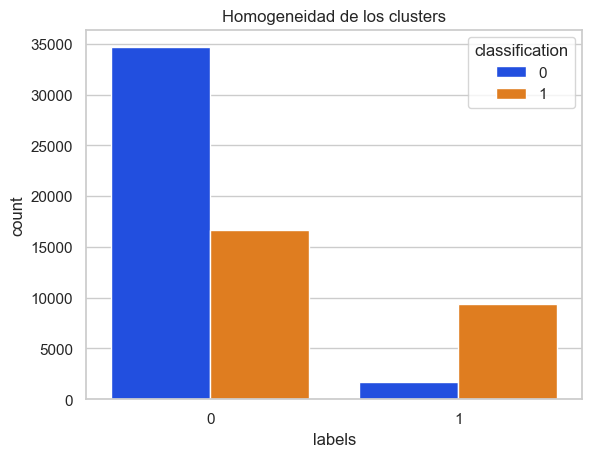

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 2, cov_type = diag)
homogeneity_score 0.061570748157819336
completeness_score 0.0649833323734058
v_measure_score 0.06280762087456145


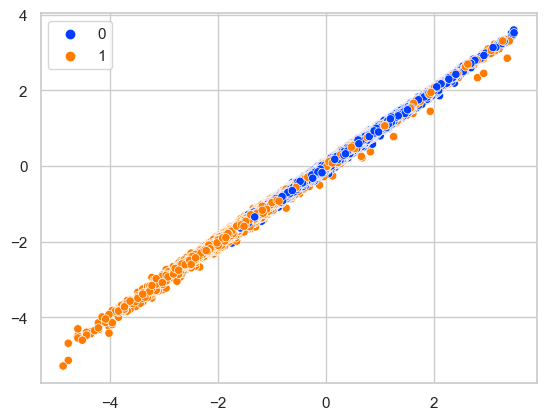

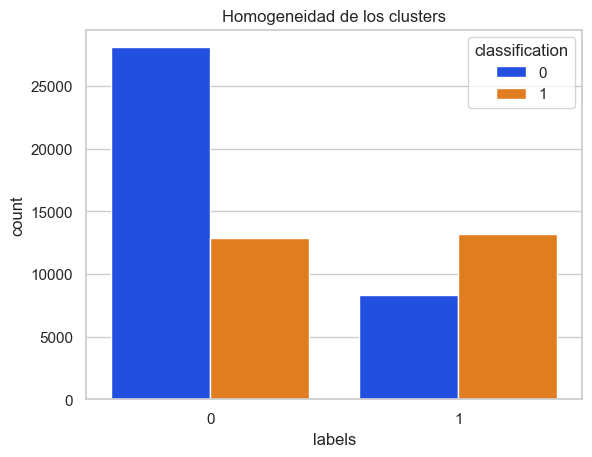

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 3, cov_type = spherical)
homogeneity_score 0.08731340340876376
completeness_score 0.05569906007491286
v_measure_score 0.07199045075928266


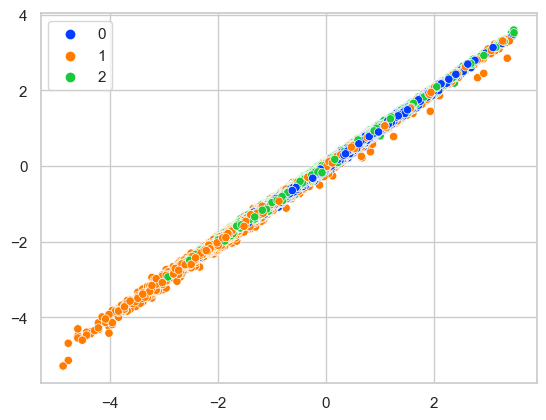

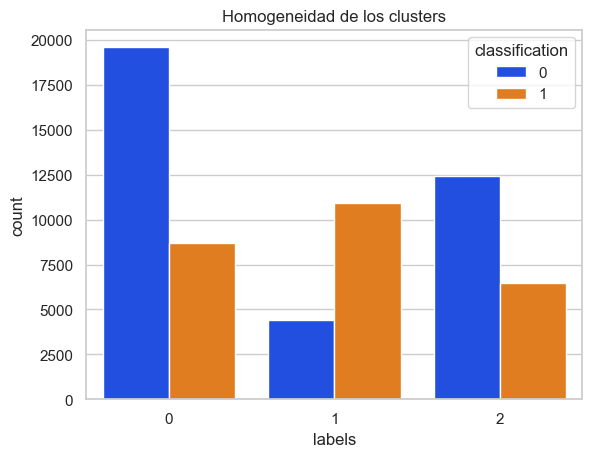

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 3, cov_type = full)
homogeneity_score 0.11871767858508005
completeness_score 0.07555330298465651
v_measure_score 0.09777107293551329


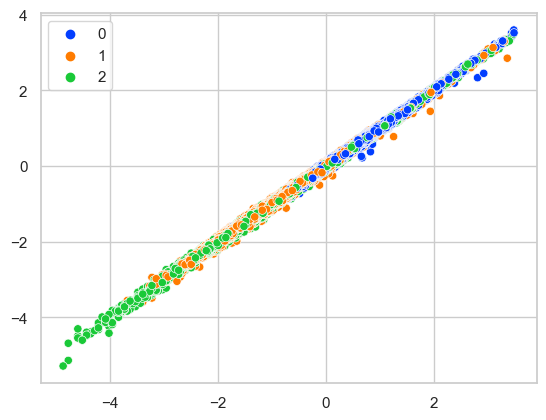

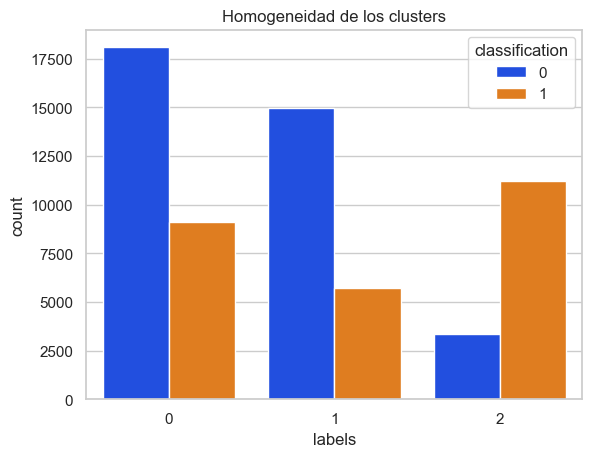

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 3, cov_type = tied)
homogeneity_score 0.12358094503359143
completeness_score 0.11394053014647668
v_measure_score 0.11978049641574279


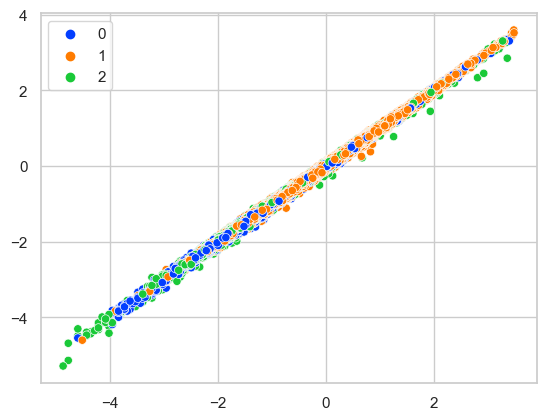

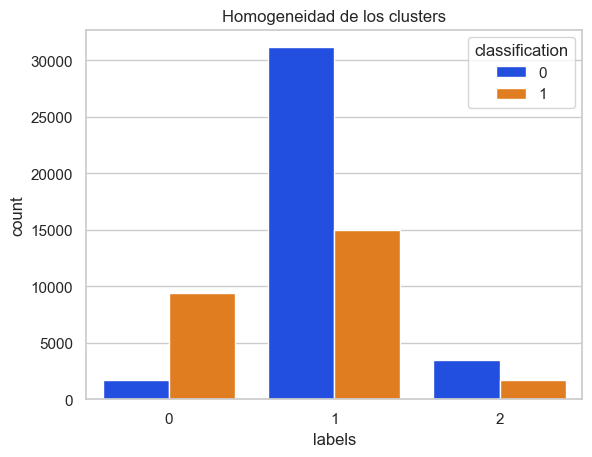

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 3, cov_type = diag)
homogeneity_score 0.11011063222963141
completeness_score 0.0708102700355158
v_measure_score 0.09114148994921611


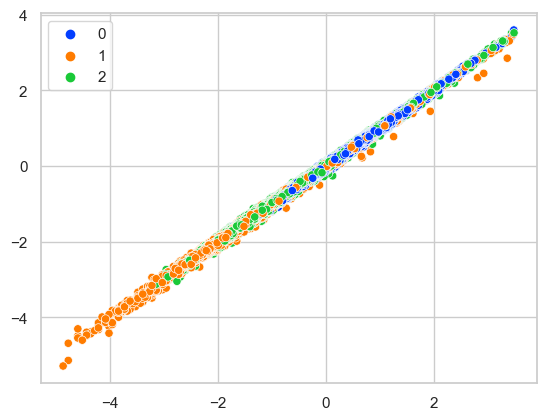

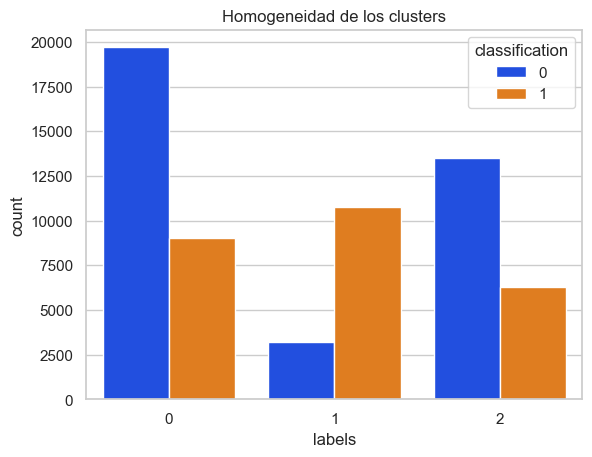

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 4, cov_type = spherical)
homogeneity_score 0.10595853031609556
completeness_score 0.05344711122492261
v_measure_score 0.077430449012835


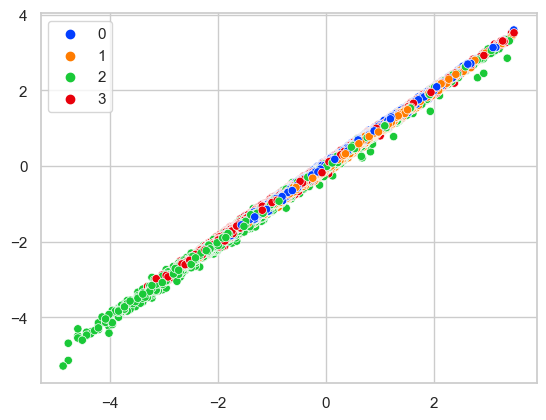

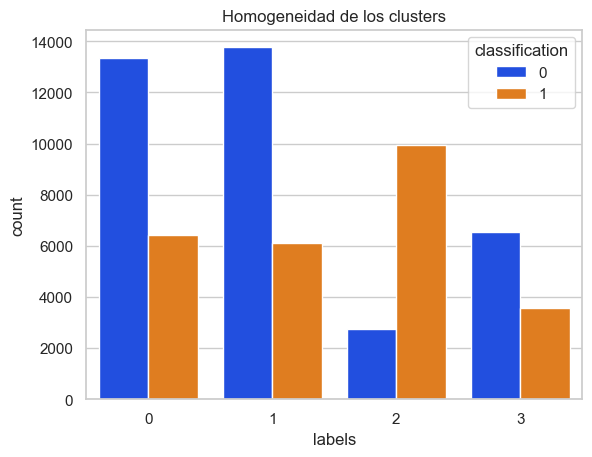

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 4, cov_type = full)
homogeneity_score 0.1298855176642749
completeness_score 0.07735184280666382
v_measure_score 0.10352066067603027


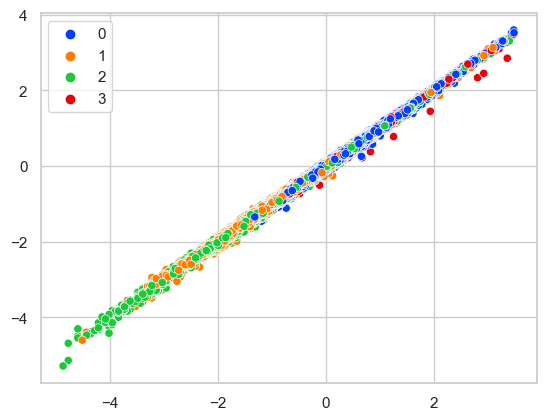

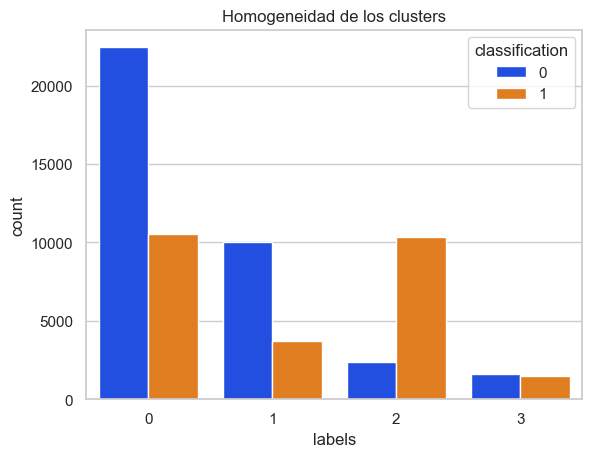

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 4, cov_type = tied)
homogeneity_score 0.12727428861998308
completeness_score 0.10828975729675511
v_measure_score 0.11942315603246997


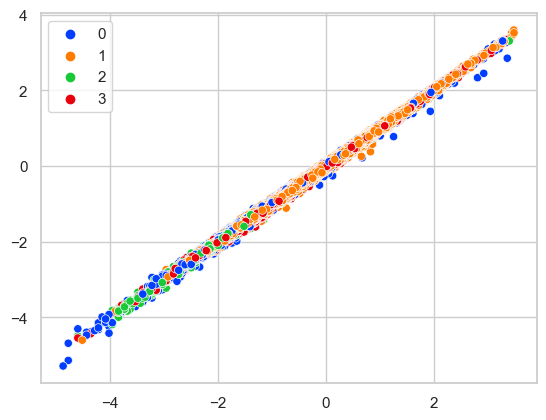

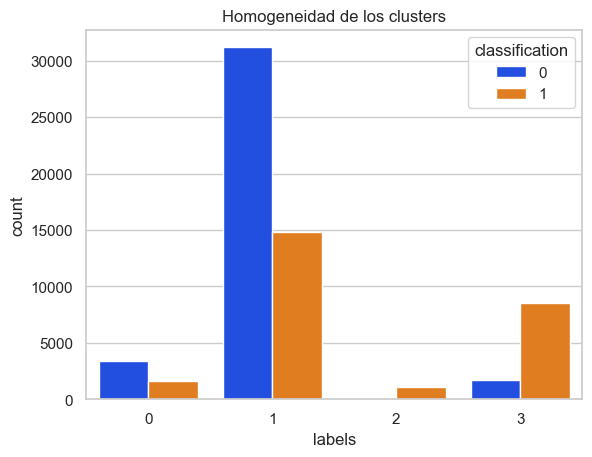

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 4, cov_type = diag)
homogeneity_score 0.10446387681922367
completeness_score 0.0578711925993085
v_measure_score 0.08023855027515708


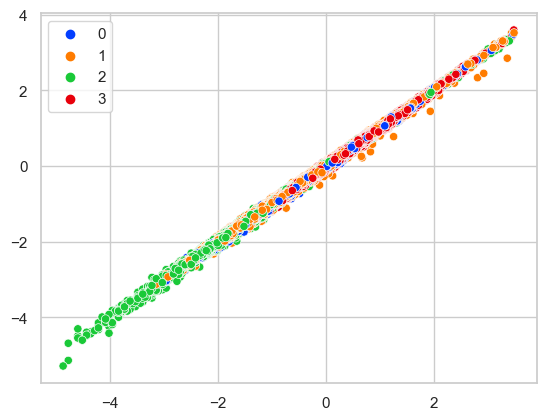

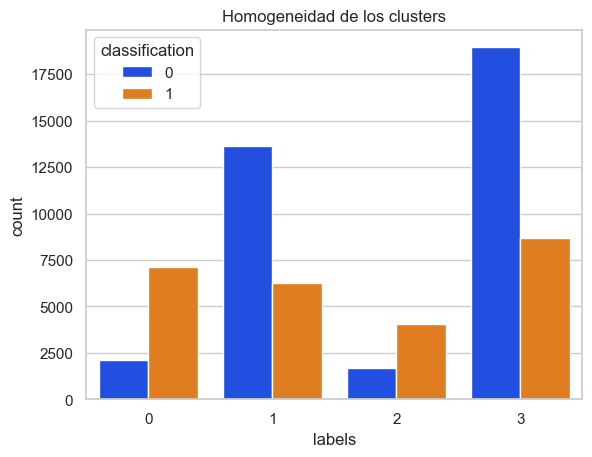

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 5, cov_type = spherical)
homogeneity_score 0.08486612668633543
completeness_score 0.03794780171186187
v_measure_score 0.0579826596642884


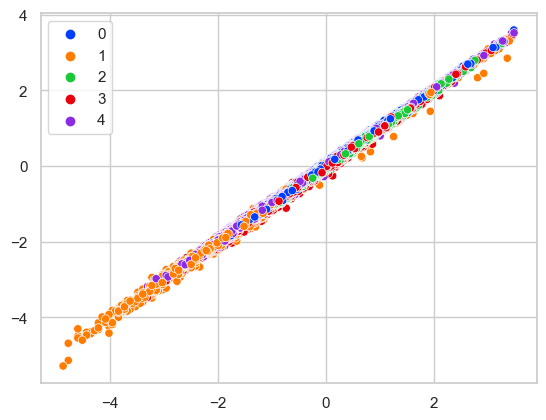

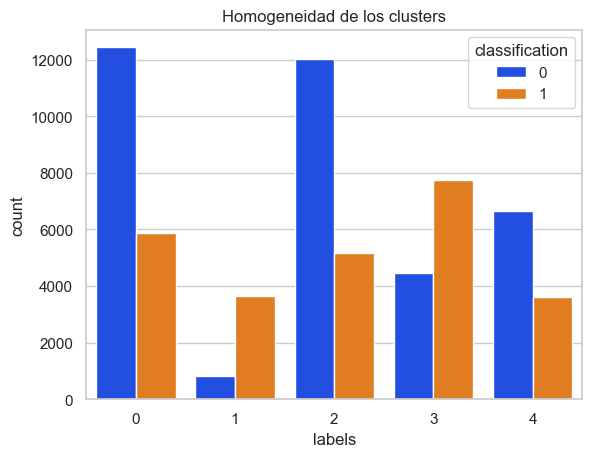

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 5, cov_type = full)
homogeneity_score 0.12579636073442238
completeness_score 0.058833507255451147
v_measure_score 0.08816580342814555


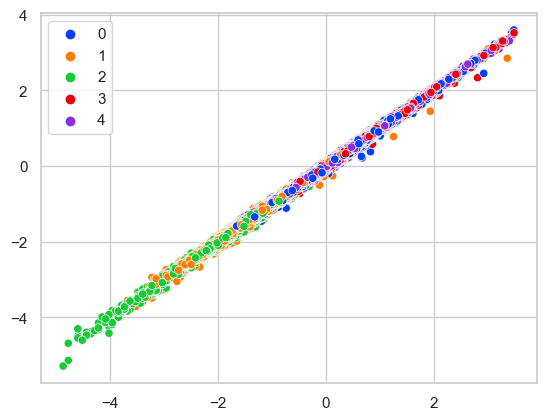

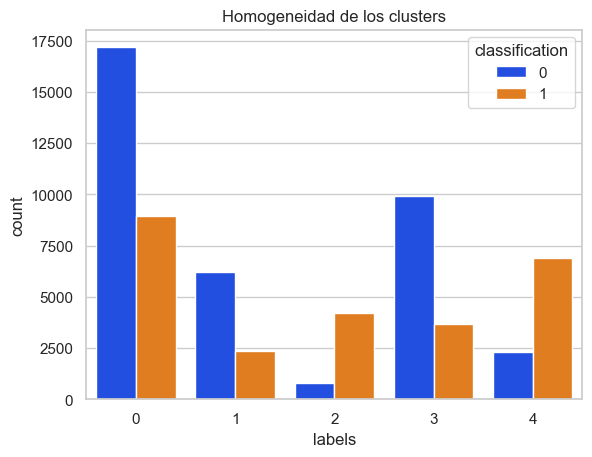

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 5, cov_type = tied)
homogeneity_score 0.1288410009245285
completeness_score 0.10143568148356932
v_measure_score 0.11698828788022451


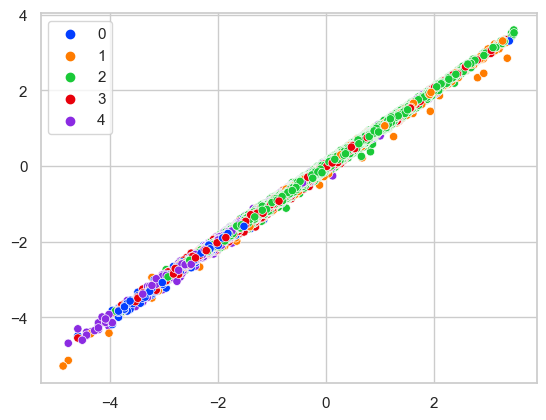

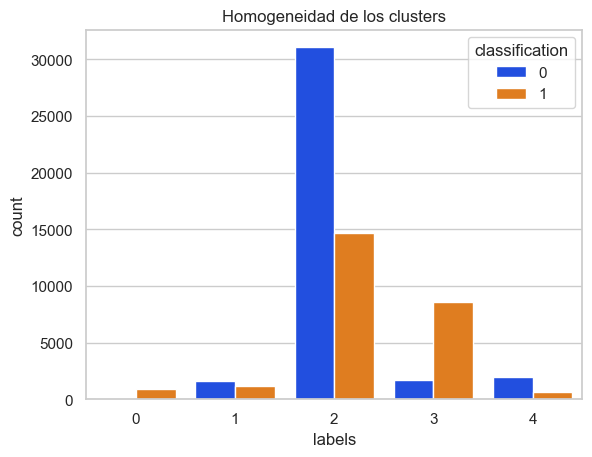

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 5, cov_type = diag)
homogeneity_score 0.10381792247972127
completeness_score 0.053027676080227536
v_measure_score 0.07638290858031752


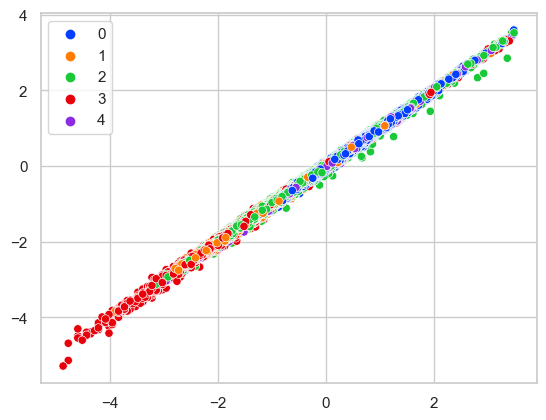

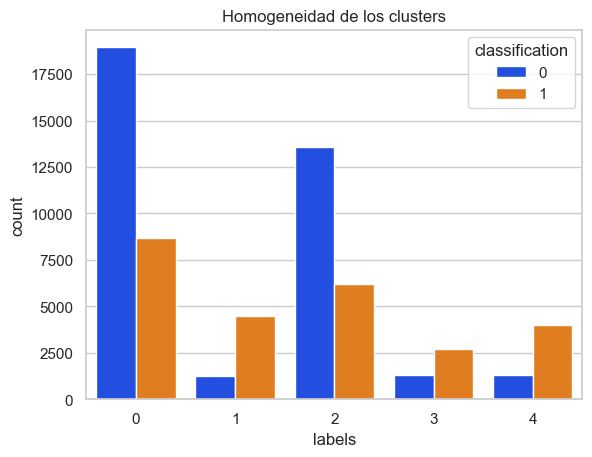

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 6, cov_type = spherical)
homogeneity_score 0.1119069428658822
completeness_score 0.044156778453363556
v_measure_score 0.07103551719519668


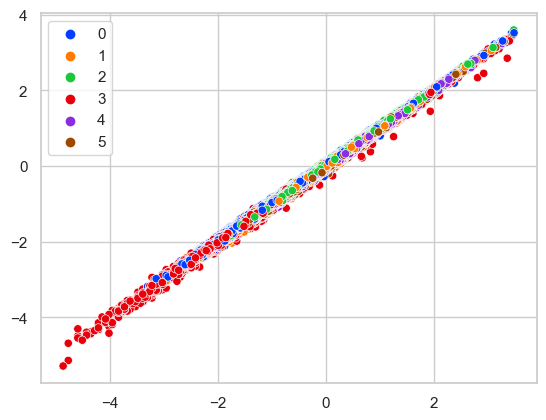

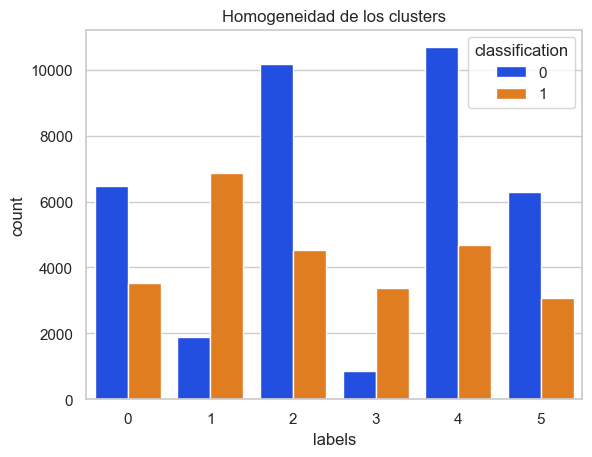

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 6, cov_type = full)
homogeneity_score 0.13571805167553794
completeness_score 0.056248340982019675
v_measure_score 0.08871541149318185


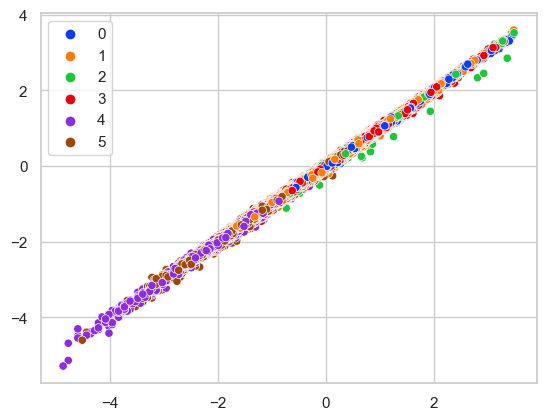

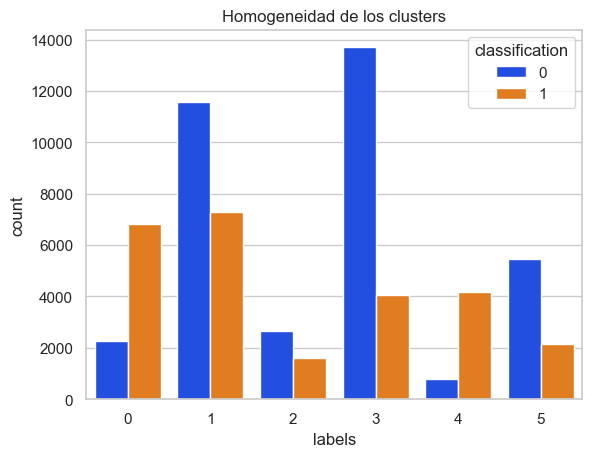

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 6, cov_type = tied)
homogeneity_score 0.12981264520113478
completeness_score 0.06530236095549553
v_measure_score 0.09472253970232508


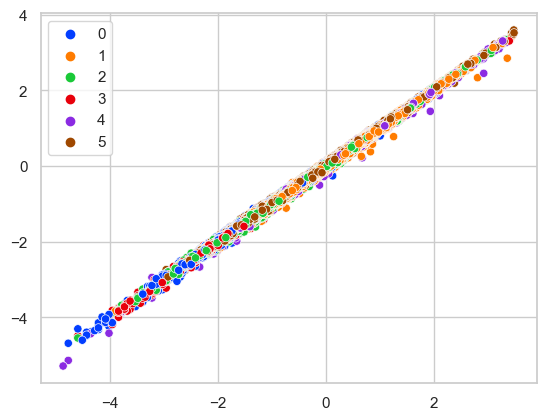

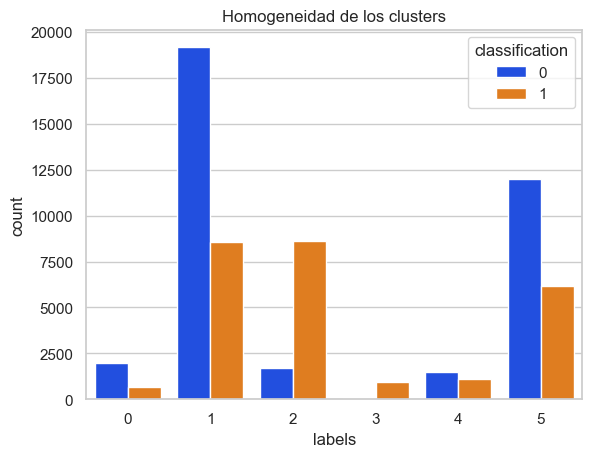

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 6, cov_type = diag)
homogeneity_score 0.11602870761672157
completeness_score 0.048901071471820864
v_measure_score 0.07659817345932284


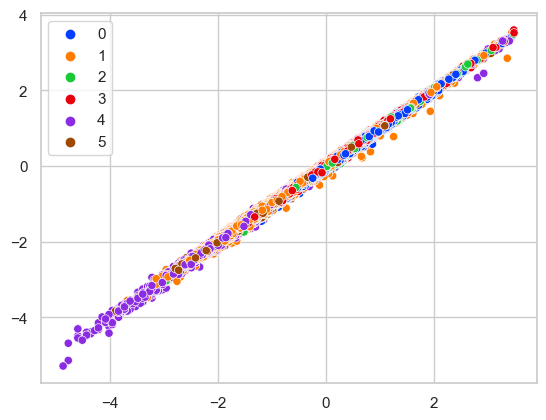

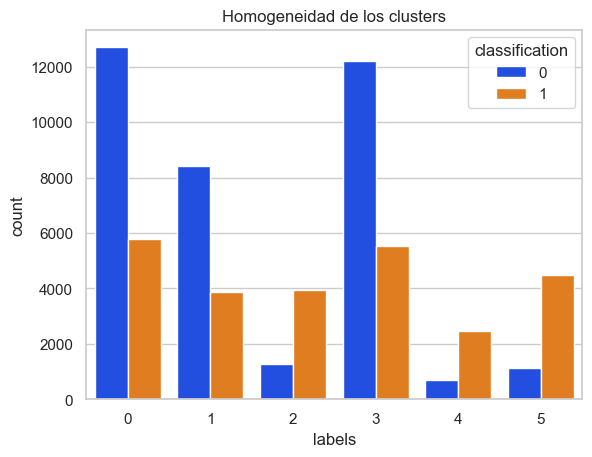

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 7, cov_type = spherical)
homogeneity_score 0.11637465062257274
completeness_score 0.041583097794070004
v_measure_score 0.06949911439388992


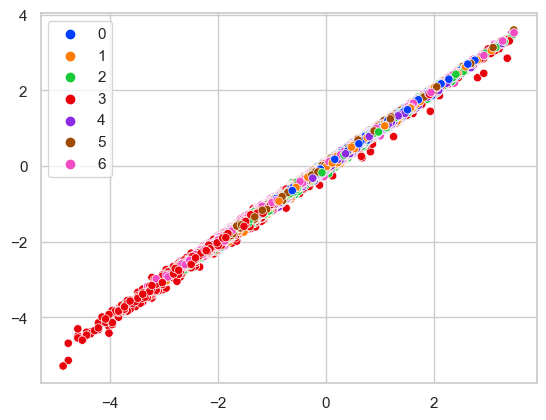

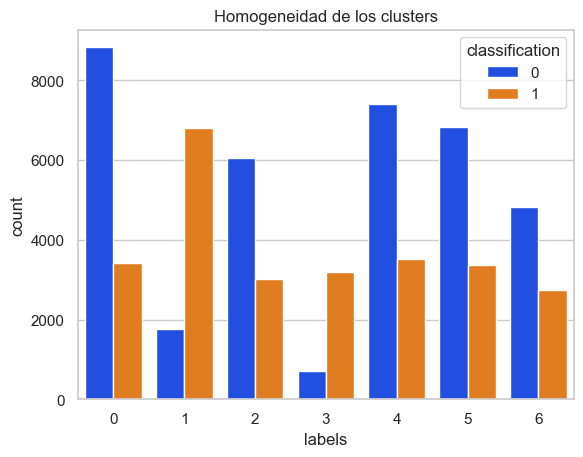

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 7, cov_type = full)
homogeneity_score 0.13355318680899028
completeness_score 0.057738418126353955
v_measure_score 0.08948872152830996


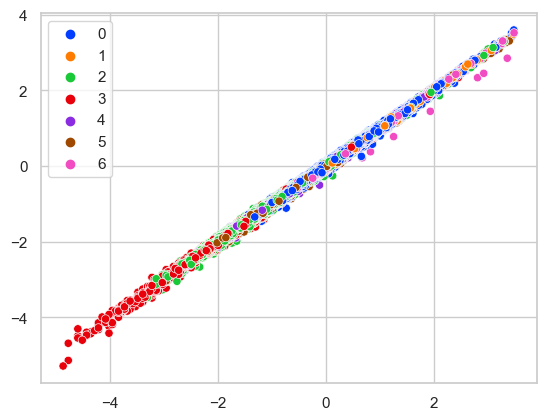

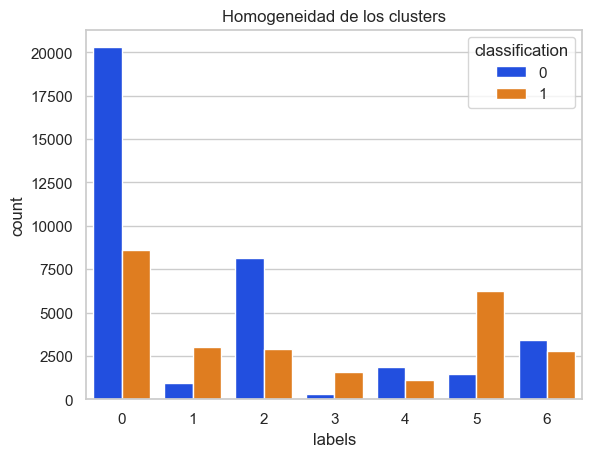

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 7, cov_type = tied)
homogeneity_score 0.13057286654098374
completeness_score 0.06152975688149195
v_measure_score 0.09190153177903272


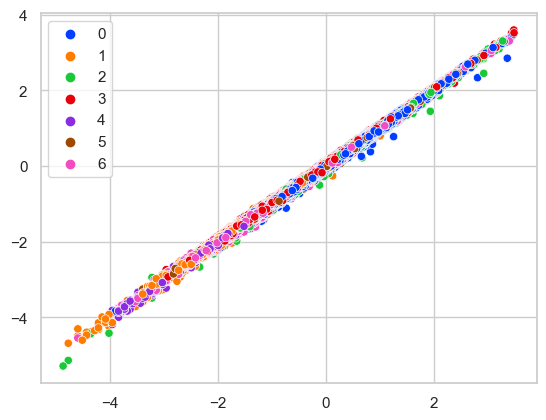

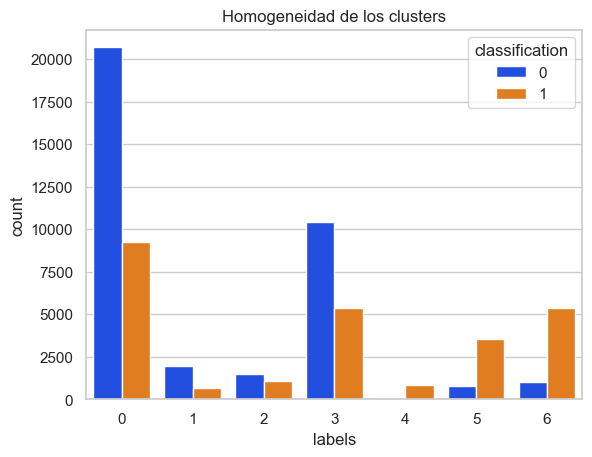

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 7, cov_type = diag)
homogeneity_score 0.12065363813551516
completeness_score 0.04710792377684446
v_measure_score 0.07610024857897002


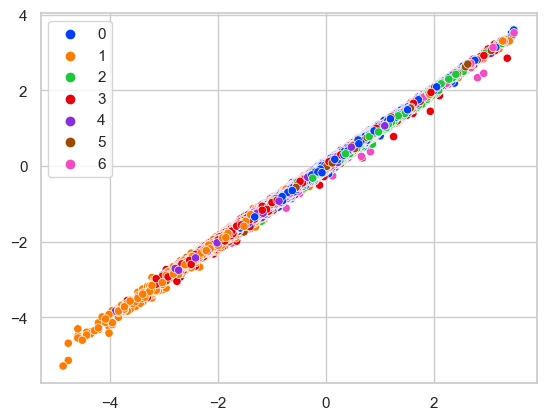

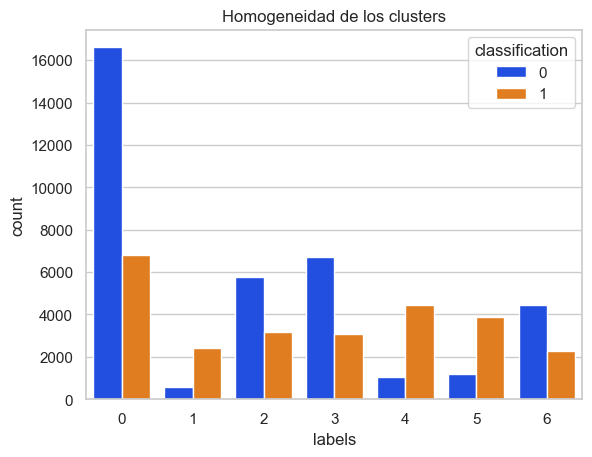

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 8, cov_type = spherical)
homogeneity_score 0.11719600826051635
completeness_score 0.03948249069708255
v_measure_score 0.06742712240233771


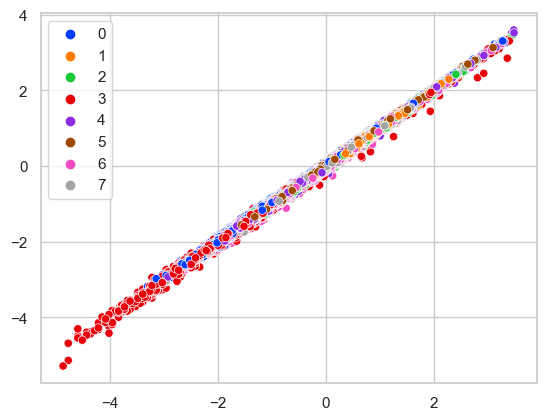

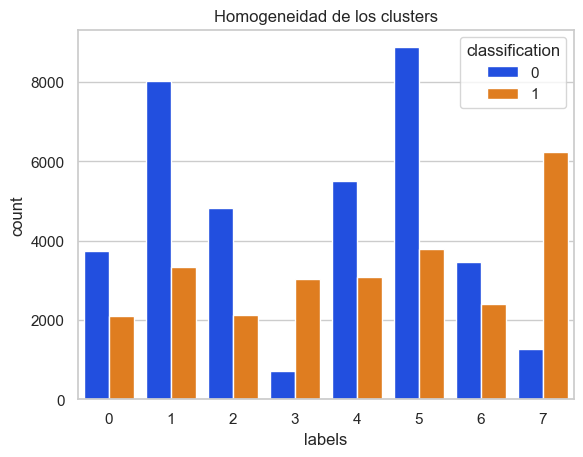

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 8, cov_type = full)
homogeneity_score 0.12757510691833615
completeness_score 0.05185885091997412
v_measure_score 0.082438588538311


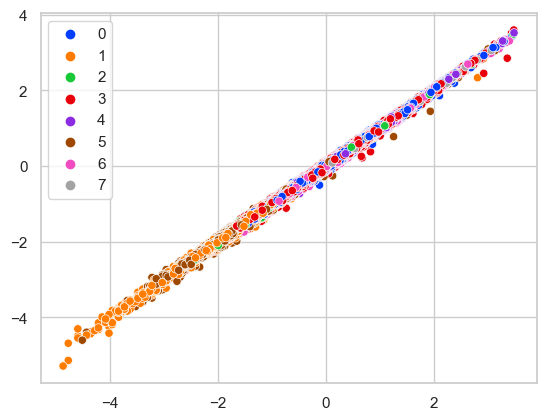

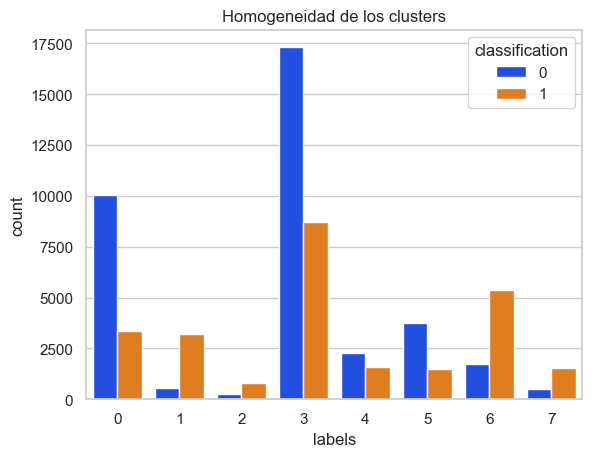

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 8, cov_type = tied)
homogeneity_score 0.13016656099153304
completeness_score 0.06301335646422501
v_measure_score 0.09300024659243357


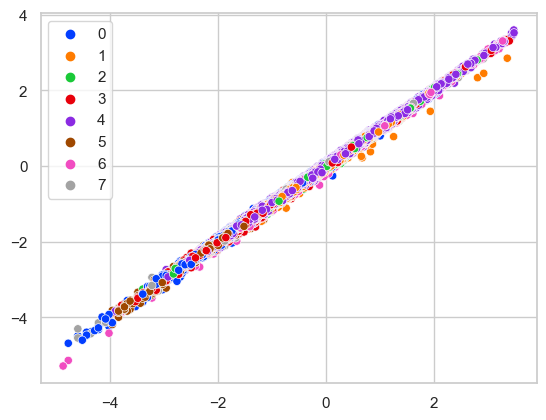

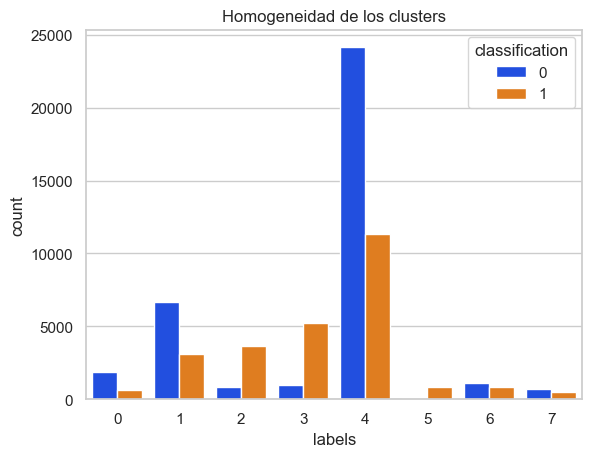

/Users/dany/.local/share/virtualenvs/python-ai-env-cTwd-LQ7/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but GaussianMixture was fitted without feature names
  warnings.warn(


##### GaussianMixture(comp = 8, cov_type = diag)
homogeneity_score 0.12925439155056836
completeness_score 0.048072186121656584
v_measure_score 0.0791377514809885


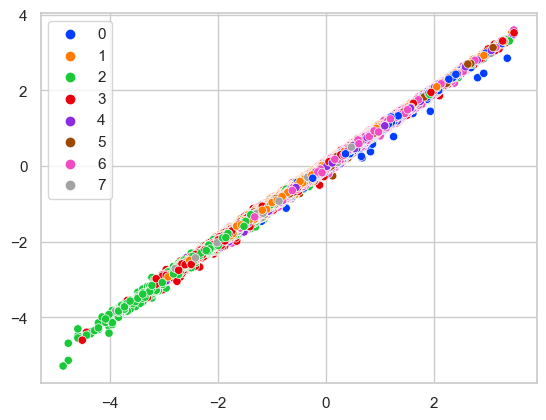

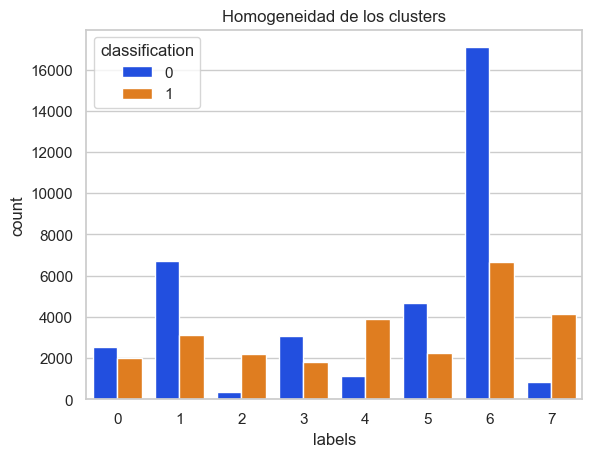

In [14]:
from sklearn.preprocessing import StandardScaler
label_save = {}
test_label_save = {}

GaussianAnalyze(
  StandardScaler().fit_transform(origin_df),
  target,
  test_origin_df,
  components = [2,3,4,5,6,7,8],
  tag = 'bio'
)

In [15]:
df = pd.DataFrame(label_save)
df.to_csv('gaussian_bio.csv', index=False)

df = pd.DataFrame(test_label_save)
df.to_csv('gaussian_test_bio.csv', index=False)